# Data Dictionary
1. begin_day Ex: 31 (DD format)
    The day of the month that the event began
2. end_day Ex: 01 (DD format)
    The day of the month that the event ended
3. state Ex: GEORGIA, WYOMING, COLORADO
    The state name where the event occurred (no State ID’s are included here; State Name is 
    spelled out in ALL CAPS).
4. year Ex: 2000, 2006, 2012
    The four digit year for the event in this record.
5. month_name Ex: January, February, March
    The name of the month for the event in this record (spelled out; not abbreviated).
6. event_type Ex: Hail, Thunderstorm Wind, Snow, Ice (spelled out; not abbreviated)
    The only events permitted in Storm Data are listed in Table 1 of Section 2.1.1 of NWS Directive 
    10-1605 at http://www.nws.noaa.gov/directives/sym/pd01016005curr.pdf. 
    The chosen event name should be the one that most accurately describes the meteorological 
    event leading to fatalities, injuries, damage, etc. However, significant events, such as tornadoes, 
    having no impact or causing no damage, should also be included in Storm Data.
7. injuries_direct Ex: 1, 0, 56
    The number of injuries directly caused by the weather event.
8. injuries_indirect Ex: 0, 15, 87
    The number of injuries indirectly caused by the weather event.
9. deaths_direct Ex: 0, 45, 23
    The number of deaths directly caused by the weather event.
10. deaths_indirect Ex: 0, 4, 6
    The number of deaths indirectly caused by the weather event.
11. damage_property Ex: 10.00K, 0.00K, 10.00M
    The estimated amount of damage to property incurred by the weather event (e.g. 10.00K =$10,000; 10.00M = $10,000,000)
12. damage_crops Ex: 0.00K, 500.00K, 15.00M
    The estimated amount of damage to crops incurred by the weather event (e.g. 10.00K = $10,000; 10.00M = $10,000,000)
13. source Ex: Public, Newspaper, Law Enforcement, Broadcast Media, ASOS, Park and Forest 
    Service, Trained Spotter, CoCoRaHS, etc. 
    The source reporting the weather event (can be any entry; isn’t restricted in what’s allowed)
14. Duration_in_days
    This is a new colum that I created subtracting start time and end time to find the duration of an event either it lasted  less than a day or greather that that.



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore") # REmoves all the warnings which appear in red box

In [2]:
# This dataset is a modified version of the actural dataset where I have dropped columns which are irrelevent for me becasue to
# load the entire dataset takes longer time
df = pd.read_csv("C_data.csv")

# Understanding the data

In [3]:
df.head()

,BEGIN_DAY,BEGIN_TIME,END_DAY,END_TIME,STATE,YEAR,MONTH_NAME,EVENT_TYPE,CZ_TYPE,CZ_TIMEZONE,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS,SOURCE
0,14,1810,14,1810,IOWA,2021,July,Tornado,C,CST-6,0,0,0,0,NaN,NaN,Emergency Manager
1,15,2357,15,2358,NORTH CAROLINA,2021,February,Thunderstorm Wind,C,EST-5,0,0,0,0,0.00K,0.00K,NWS Storm Survey
2,3,1842,3,1845,IDAHO,2021,June,Thunderstorm Wind,C,MST-7,0,0,0,0,0.00K,0.00K,Public
3,22,1850,22,1855,OREGON,2021,June,Thunderstorm Wind,C,MST-7,0,0,0,0,0.00K,0.00K,ASOS
4,2,2001,2,2001,KANSAS,2021,May,Thunderstorm Wind,C,CST-6,0,0,0,0,0.00K,0.00K,Mesonet


In [4]:
# Furthermore I wont be needing this column
df = df.drop(["CZ_TIMEZONE", "BEGIN_TIME", "END_TIME", "CZ_TYPE"], axis=1)

In [5]:
df.shape

(310061, 13)

# Note 
I have removed these locations as its either too far from the usa or it doesnt really fall inside the boundries of the USA
GULF OF MEXICO,PUERTO RICO,VIRGIN ISLANDS,ALASKA,AMERICAN SAMOA,ATLANTIC NORTH,ATLANTIC SOUTH,HAWAIi
HAWAII WATERS,E PACIFIC,DISTRICT OF COLUMBIA, GUAM

In [6]:
filter_conditions = ["GUAM","GULF OF MEXICO", "PUERTO RICO", "VIRGIN ISLANDS", "ALASKA", "AMERICAN SAMOA", "ATLANTIC NORTH", "ATLANTIC SOUTH",
                     "HAWAII", "HAWAII WATERS", "E PACIFIC"]
df = df[~df["STATE"].isin(filter_conditions)]

In [7]:
df["STATE"].unique() # CHecking if the above locations are removed or not

array(['IOWA', 'NORTH CAROLINA', 'IDAHO', 'OREGON', 'KANSAS', 'KENTUCKY',
       'MINNESOTA', 'MISSISSIPPI', 'LOUISIANA', 'NEBRASKA', 'ARIZONA',
       'NEW YORK', 'ARKANSAS', 'TENNESSEE', 'VIRGINIA', 'INDIANA',
       'MISSOURI', 'MONTANA', 'CALIFORNIA', 'ILLINOIS', 'COLORADO',
       'WISCONSIN', 'ALABAMA', 'MASSACHUSETTS', 'CONNECTICUT',
       'SOUTH DAKOTA', 'RHODE ISLAND', 'MICHIGAN', 'PENNSYLVANIA', 'UTAH',
       'WASHINGTON', 'NEW JERSEY', 'OHIO', 'LAKE SUPERIOR',
       'SOUTH CAROLINA', 'FLORIDA', 'GEORGIA', 'DELAWARE', 'MARYLAND',
       'VERMONT', 'LAKE MICHIGAN', 'NEW MEXICO', 'NEVADA', 'OKLAHOMA',
       'NEW HAMPSHIRE', 'TEXAS', 'MAINE', 'NORTH DAKOTA', 'WYOMING',
       'DISTRICT OF COLUMBIA', 'WEST VIRGINIA', 'LAKE ERIE', 'LAKE HURON',
       'LAKE ST CLAIR', 'LAKE ONTARIO', 'ST LAWRENCE R'], dtype=object)

In [8]:
df.shape # Rows by columns after removing the above mentioned locations

(292214, 13)

In [9]:
df.dtypes

BEGIN_DAY             int64
END_DAY               int64
STATE                object
YEAR                  int64
MONTH_NAME           object
EVENT_TYPE           object
INJURIES_DIRECT       int64
INJURIES_INDIRECT     int64
DEATHS_DIRECT         int64
DEATHS_INDIRECT       int64
DAMAGE_PROPERTY      object
DAMAGE_CROPS         object
SOURCE               object
dtype: object

In [10]:
# Checking for null values in the entire columns
df.isnull().sum() # Two of the columns has null values equivalent to 20% of the entire dataset, I could consider replacing those
                  # with mean or median but that would impact the model so better drop it
                  # Also dropping the null values on the state column

BEGIN_DAY                0
END_DAY                  0
STATE                    0
YEAR                     0
MONTH_NAME               0
EVENT_TYPE               0
INJURIES_DIRECT          0
INJURIES_INDIRECT        0
DEATHS_DIRECT            0
DEATHS_INDIRECT          0
DAMAGE_PROPERTY      57800
DAMAGE_CROPS         57090
SOURCE                   0
dtype: int64

In [11]:
df.describe()

,BEGIN_DAY,END_DAY,YEAR,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT
count,292214.000000,292214.000000,292214.000000,292214.000000,292214.000000,292214.000000,292214.000000
mean,15.071889,16.439240,2019.017015,0.022521,0.007772,0.011255,0.003761
std,8.985255,8.998343,1.386012,1.053946,0.993360,0.341206,0.103939
min,1.000000,1.000000,2017.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,9.000000,2018.000000,0.000000,0.000000,0.000000,0.000000
50%,15.000000,16.000000,2019.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,24.000000,2020.000000,0.000000,0.000000,0.000000,0.000000
max,31.000000,31.000000,2021.000000,210.000000,500.000000,93.000000,20.000000


In [12]:
df.corr()

,BEGIN_DAY,END_DAY,YEAR,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT
BEGIN_DAY,1.000000,0.827144,-0.003180,-0.003017,-0.001174,-0.001491,-0.000678
END_DAY,0.827144,1.000000,0.034005,-0.002117,-0.001610,0.000597,-0.001927
YEAR,-0.003180,0.034005,1.000000,0.000658,-0.002783,0.005449,-0.004696
INJURIES_DIRECT,-0.003017,-0.002117,0.000658,1.000000,0.035694,0.201962,0.036527
INJURIES_INDIRECT,-0.001174,-0.001610,-0.002783,0.035694,1.000000,0.001781,0.037535
DEATHS_DIRECT,-0.001491,0.000597,0.005449,0.201962,0.001781,1.000000,0.115758
DEATHS_INDIRECT,-0.000678,-0.001927,-0.004696,0.036527,0.037535,0.115758,1.000000


# Data Analysis

In [13]:
df = df.dropna() # all null values dropped

In [14]:
df.isnull().sum() # Checking if all cloumns are nnull free or not

BEGIN_DAY            0
END_DAY              0
STATE                0
YEAR                 0
MONTH_NAME           0
EVENT_TYPE           0
INJURIES_DIRECT      0
INJURIES_INDIRECT    0
DEATHS_DIRECT        0
DEATHS_INDIRECT      0
DAMAGE_PROPERTY      0
DAMAGE_CROPS         0
SOURCE               0
dtype: int64

In [15]:
df.shape # After dropping all the null values

(227531, 13)

#### In the DAMAGE_PROPERTY, DAMAGE_CROPS columns, texts are joined with integers which symbolizes number, so its need to be changed

In [16]:
def convert_to_int(x):
    x = str(x).replace(',', '')  # Remove commas if present
    if 'K' in x:
        return int(float(x.replace('K','')) * 1000)
    elif 'M' in x:
        return int(float(x.replace('M','')) * 1000000)
    elif 'B' in x:
        return int(float(x.replace('B','')) * 1000000000)
    else:
        return int(x)

# Apply the conversion function to the column containing the numbers with suffixes
df['DAMAGE_PROPERTY'] = df['DAMAGE_PROPERTY'].apply(convert_to_int)
df['DAMAGE_CROPS'] = df['DAMAGE_CROPS'].apply(convert_to_int)

In [17]:
df.dtypes

BEGIN_DAY             int64
END_DAY               int64
STATE                object
YEAR                  int64
MONTH_NAME           object
EVENT_TYPE           object
INJURIES_DIRECT       int64
INJURIES_INDIRECT     int64
DEATHS_DIRECT         int64
DEATHS_INDIRECT       int64
DAMAGE_PROPERTY       int64
DAMAGE_CROPS          int64
SOURCE               object
dtype: object

#### I dont need 2 columns to dispay the duration of the event so subtracting the BEGIN_DAY to END_DAY to get the duration of the event and storing it on a new column
#### Also I wont be need them as the information is dispalyed in one column instead of tow

In [18]:
df["Duration_in_days"] = df["END_DAY"] - df["BEGIN_DAY"]
df = df.drop(["BEGIN_DAY", "END_DAY"], axis=1)

In [19]:
df.sample(5)

,STATE,YEAR,MONTH_NAME,EVENT_TYPE,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS,SOURCE,Duration_in_days
240277,MONTANA,2018,December,High Wind,0,0,0,0,0,0,ASOS,0
270950,LOUISIANA,2017,April,Flash Flood,0,0,0,0,0,0,Law Enforcement,1
185548,CALIFORNIA,2019,November,Cold/Wind Chill,0,0,3,0,0,0,County Official,0
95175,TENNESSEE,2020,July,Thunderstorm Wind,0,0,0,0,5000,0,Emergency Manager,0
137135,KENTUCKY,2019,April,Strong Wind,0,0,0,0,1000,0,AWOS,0


In [20]:
duration_col = df.pop("Duration_in_days") # Removing the new column and adding that column in the beginning of the dataset.
df.insert(0, "Duration_in_days", duration_col)

In [21]:
df.head() # checking for the new column

,Duration_in_days,STATE,YEAR,MONTH_NAME,EVENT_TYPE,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS,SOURCE
1,0,NORTH CAROLINA,2021,February,Thunderstorm Wind,0,0,0,0,0,0,NWS Storm Survey
2,0,IDAHO,2021,June,Thunderstorm Wind,0,0,0,0,0,0,Public
3,0,OREGON,2021,June,Thunderstorm Wind,0,0,0,0,0,0,ASOS
4,0,KANSAS,2021,May,Thunderstorm Wind,0,0,0,0,0,0,Mesonet
5,0,KANSAS,2021,May,Thunderstorm Wind,0,0,0,0,0,0,AWOS


### Analyzing the min, max, mean, and median

In [22]:
print("Stats for INJURIES_DIRECT Columns are\n")
print("Minimum injury:", df["INJURIES_DIRECT"].min())
print("Maximum injury:", df["INJURIES_DIRECT"].max())
print("Average injury:", df["INJURIES_DIRECT"].mean())
print("")
print("Stats for INJURIES_INDIRECT Columns are\n")
print("Minimum injury:", df["INJURIES_INDIRECT"].min())
print("Maximum injury:", df["INJURIES_INDIRECT"].max())
print("Average injury:", df["INJURIES_INDIRECT"].mean())
print("")
print("Stats for DEATHS_DIRECT Columns are\n")
print("Minimum deaths:", df["DEATHS_DIRECT"].min())
print("Maximum deaths:", df["DEATHS_DIRECT"].max())
print("Average deaths:", df["DEATHS_DIRECT"].mean())
print("")
print("Stats for DEATHS_INDIRECT Columns are\n")
print("Minimum deaths:", df["DEATHS_INDIRECT"].min())
print("Maximum deaths:", df["DEATHS_INDIRECT"].max())
print("Average deaths:", df["DEATHS_INDIRECT"].mean())
print("")
print("Stats for DAMAGE_PROPERTY Columns are\n")
print("Minimum damage:", df["DAMAGE_PROPERTY"].min())
print("Maximum damage:", df["DAMAGE_PROPERTY"].max())
print("Average damage:", df["DAMAGE_PROPERTY"].mean())
print("")
print("Stats for DAMAGE_CROPS Columns are\n")
print("Minimum damage:", df["DAMAGE_CROPS"].min())
print("Maximum damage:", df["DAMAGE_CROPS"].max())
print("Average damage:", df["DAMAGE_CROPS"].mean())

Stats for INJURIES_DIRECT Columns are

Minimum injury: 0
Maximum injury: 185
Average injury: 0.021895917479376435

Stats for INJURIES_INDIRECT Columns are

Minimum injury: 0
Maximum injury: 500
Average injury: 0.00800330504414783

Stats for DEATHS_DIRECT Columns are

Minimum deaths: 0
Maximum deaths: 93
Average deaths: 0.012789466050779894

Stats for DEATHS_INDIRECT Columns are

Minimum deaths: 0
Maximum deaths: 16
Average deaths: 0.004021430046894709

Stats for DAMAGE_PROPERTY Columns are

Minimum damage: 0
Maximum damage: 17000000000
Average damage: 565707.6616109454

Stats for DAMAGE_CROPS Columns are

Minimum damage: 0
Maximum damage: 500000000
Average damage: 40626.740299124074


### Analyzing the data to show total damage on each aspect done by each event throughout the span of 5 years

In [23]:
data = df.groupby(["EVENT_TYPE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                        "DAMAGE_PROPERTY", "DAMAGE_CROPS"]]

In [24]:
data

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Astronomical Low Tide,1,0,1,0,5000,0
Avalanche,16,3,62,3,242500,0
Blizzard,4,13,4,7,11840000,0
Coastal Flood,2,0,1,0,23612000,0
Cold/Wind Chill,3,20,89,28,59171000,750000000
Debris Flow,172,1,25,3,842989700,22600
Dense Fog,0,117,0,35,2395000,0
Dense Smoke,0,0,0,0,0,0
Drought,0,0,0,0,2010000,115195000


### Sorting the data with respect to most deaths by each events

In [25]:
data = df.groupby(["EVENT_TYPE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                            "DAMAGE_PROPERTY", "DAMAGE_CROPS"]].sort_values("DEATHS_DIRECT", ascending=False)

In [26]:
# Showing the top half and the bottom half
data.head()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Excessive Heat,373,0,725,84,7560000,50000
Heat,520,30,476,225,20000,0
Flash Flood,117,18,367,14,48956860997,354531300
Rip Current,111,0,276,4,0,0
Tornado,1905,23,158,8,6696402100,54446750


In [27]:
data.tail()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Marine Hail,0,0,0,0,0,0
Lake-Effect Snow,0,5,0,2,34794000,0
Freezing Fog,0,3,0,2,495000,0
Funnel Cloud,0,0,0,0,1000,0
Dust Devil,1,20,0,0,668000,0


### Sorting the data with respect to most damage on property by each events

In [28]:
data = df.groupby(["EVENT_TYPE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                        "DAMAGE_PROPERTY", "DAMAGE_CROPS"]].sort_values("DAMAGE_PROPERTY", ascending=False)

In [29]:
# Showing the top half and the bottom half
data.head()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Flash Flood,117,18,367,14,48956860997,354531300
Hurricane,2,18,17,102,33969610000,4789900000
Wildfire,246,18,153,8,17667266500,2441000
Tornado,1905,23,158,8,6696402100,54446750
High Wind,81,34,29,4,5260174580,5176100


In [30]:
data.tail()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Funnel Cloud,0,0,0,0,1000,0
Dense Smoke,0,0,0,0,0,0
Rip Current,111,0,276,4,0,0
Waterspout,0,0,0,0,0,0
Marine Hail,0,0,0,0,0,0


### Sorting the data with respect to most damage on crops by each events

In [31]:
data = df.groupby(["EVENT_TYPE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                        "DAMAGE_PROPERTY", "DAMAGE_CROPS"]].sort_values("DAMAGE_CROPS", ascending=False)

In [32]:
# Showing the top half and the bottom half
data.head()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Hurricane,2,18,17,102,33969610000,4789900000
Flood,33,11,116,11,3585090377,1686892997
Frost/Freeze,1,0,2,0,177620,851748000
Cold/Wind Chill,3,20,89,28,59171000,750000000
Flash Flood,117,18,367,14,48956860997,354531300


In [33]:
data.tail()

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
EVENT_TYPE,,,,,,
Ice Storm,0,518,2,2,107779800,0
Freezing Fog,0,3,0,2,495000,0
Avalanche,16,3,62,3,242500,0
High Surf,17,0,41,2,201000,0
Astronomical Low Tide,1,0,1,0,5000,0


### Analyzing in which state the death was high in the span of 5 years

In [34]:
data2 = df.groupby(["STATE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                        "DAMAGE_PROPERTY", "DAMAGE_CROPS"]].sort_values("DEATHS_DIRECT", ascending=False)

In [35]:
data2

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
STATE,,,,,,
ARIZONA,94,37,859,175,202916850,5000
CALIFORNIA,477,85,265,57,18966105550,170542160
TEXAS,369,82,224,82,52764148930,807282550
NEVADA,11,1,188,114,35770000,250
OREGON,6,10,155,22,3817134700,117000
FLORIDA,207,13,145,70,8042603490,1868635000
NORTH CAROLINA,80,5,94,25,2138253709,436233500
ALABAMA,283,5,82,2,358997300,2080000
TENNESSEE,410,3,82,2,1999382440,833000


### Analyzing in which state the crops damage was high in the span of 5 years

In [36]:
data2 = df.groupby(["STATE"]).sum()[["INJURIES_DIRECT", "INJURIES_INDIRECT", "DEATHS_DIRECT", "DEATHS_INDIRECT", 
                                        "DAMAGE_PROPERTY", "DAMAGE_CROPS"]].sort_values("DAMAGE_CROPS", ascending=False)

In [37]:
data2

,INJURIES_DIRECT,INJURIES_INDIRECT,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
STATE,,,,,,
GEORGIA,156,0,19,2,1634924790,3119663500
FLORIDA,207,13,145,70,8042603490,1868635000
SOUTH DAKOTA,16,20,10,12,130039449,929917499
TEXAS,369,82,224,82,52764148930,807282550
SOUTH CAROLINA,51,2,24,4,138899060,750024950
NORTH CAROLINA,80,5,94,25,2138253709,436233500
NEBRASKA,8,5,5,5,744360150,317622100
IOWA,174,109,10,6,468958999,218463998
MINNESOTA,22,53,12,21,114046400,174009000


### Analyzing the total number of events occured in each state in the span of 5 years

In [38]:
count = df.groupby(["STATE", "EVENT_TYPE"]).size()
count.head(50)

STATE    EVENT_TYPE             
ALABAMA  Coastal Flood                 4
         Cold/Wind Chill              41
         Drought                     159
         Excessive Heat                8
         Extreme Cold/Wind Chill       2
         Flash Flood                 516
         Flood                       179
         Freezing Fog                 12
         Frost/Freeze                219
         Funnel Cloud                 10
         Hail                        428
         Heat                         83
         Heavy Rain                   23
         Heavy Snow                   13
         High Surf                     1
         High Wind                    14
         Hurricane                     6
         Ice Storm                     9
         Lightning                    31
         Rip Current                  16
         Storm Surge/Tide             26
         Strong Wind                  49
         Thunderstorm Wind          2429
         Tornado        

### Analyzing total number of events occured in the span of 5 year

In [39]:
data3 = df.groupby(["EVENT_TYPE"]).size().sort_values(ascending=False)
data3

EVENT_TYPE
Thunderstorm Wind           62423
Hail                        28745
Flash Flood                 20025
Flood                       16699
High Wind                   14054
Winter Weather              13131
Winter Storm                10770
Heavy Snow                   8213
Drought                      6747
Heavy Rain                   6096
Tornado                      5802
Strong Wind                  5206
Heat                         4612
Excessive Heat               3437
Dense Fog                    2284
Extreme Cold/Wind Chill      2233
Frost/Freeze                 2120
Blizzard                     1606
Cold/Wind Chill              1557
Marine Thunderstorm Wind     1477
Lightning                    1373
Wildfire                     1309
Funnel Cloud                 1292
Tropical Storm               1216
Ice Storm                     822
Coastal Flood                 715
Debris Flow                   707
Lake-Effect Snow              378
Rip Current                   352
Dus

# Most affected state

In [40]:
data3 = df.groupby(["STATE"]).size().sort_values(ascending=False)
data3

STATE
TEXAS                   17189
CALIFORNIA               9643
IOWA                     9330
ILLINOIS                 8696
PENNSYLVANIA             8657
MISSOURI                 8565
OKLAHOMA                 7535
NEW YORK                 7089
VIRGINIA                 7067
OHIO                     6627
KENTUCKY                 6449
KANSAS                   6399
COLORADO                 6263
NORTH CAROLINA           6228
WISCONSIN                5816
SOUTH DAKOTA             5749
NEBRASKA                 5725
MINNESOTA                5665
ARKANSAS                 5656
MONTANA                  5576
MISSISSIPPI              5191
TENNESSEE                4885
ALABAMA                  4849
FLORIDA                  4803
ARIZONA                  4196
MICHIGAN                 4084
INDIANA                  4084
LOUISIANA                3912
WYOMING                  3809
MASSACHUSETTS            3409
NEW MEXICO               3374
NEW JERSEY               3267
GEORGIA                  3129
WEST

### Analyzing the count of each event in each year in chronological order

In [41]:
data3 = df.groupby(["EVENT_TYPE", "YEAR"]).size().unstack().fillna(0)
data3

YEAR,2017,2018,2019,2020,2021
EVENT_TYPE,,,,,
Astronomical Low Tide,11.0,32.0,14.0,17.0,21.0
Avalanche,19.0,10.0,42.0,19.0,26.0
Blizzard,167.0,601.0,479.0,276.0,83.0
Coastal Flood,61.0,220.0,174.0,114.0,146.0
Cold/Wind Chill,154.0,440.0,297.0,134.0,532.0
Debris Flow,191.0,129.0,152.0,63.0,172.0
Dense Fog,474.0,440.0,435.0,493.0,442.0
Dense Smoke,16.0,45.0,2.0,13.0,0.0
Drought,869.0,1265.0,731.0,1323.0,2559.0


### Analyzing the count of each event as per months

In [42]:
month_order = ["January", "February", "March", "April", "May", "June", 
               "July", "August", "September", "October", "November", "December"]
data3 = df.groupby(["EVENT_TYPE", "MONTH_NAME"]).size().unstack().fillna(0)[month_order] # Dispaying by month order
data3

MONTH_NAME,January,February,March,April,May,June,July,August,September,October,November,December
EVENT_TYPE,,,,,,,,,,,,
Astronomical Low Tide,36.0,19.0,2.0,2.0,1.0,1.0,0.0,4.0,3.0,0.0,8.0,19.0
Avalanche,26.0,41.0,13.0,9.0,3.0,0.0,0.0,1.0,3.0,4.0,1.0,15.0
Blizzard,262.0,370.0,235.0,239.0,0.0,0.0,4.0,0.0,0.0,16.0,174.0,306.0
Coastal Flood,69.0,29.0,74.0,37.0,36.0,6.0,3.0,22.0,116.0,215.0,85.0,23.0
Cold/Wind Chill,632.0,603.0,45.0,3.0,6.0,4.0,3.0,0.0,1.0,68.0,10.0,182.0
Debris Flow,111.0,173.0,61.0,37.0,23.0,18.0,112.0,59.0,28.0,36.0,15.0,34.0
Dense Fog,482.0,227.0,212.0,129.0,47.0,2.0,82.0,162.0,113.0,148.0,285.0,395.0
Dense Smoke,0.0,0.0,0.0,0.0,0.0,4.0,2.0,20.0,23.0,2.0,25.0,0.0
Drought,595.0,497.0,430.0,400.0,321.0,397.0,459.0,646.0,771.0,814.0,732.0,685.0


# Analyzing the eventtype as per each year and month in each month

In [43]:
data4 = df.groupby(["YEAR", "EVENT_TYPE", "STATE", "MONTH_NAME"]).size().unstack().fillna(0)
data4.sample(50)

MONTH_NAME                                   April  August  December  \
YEAR EVENT_TYPE              STATE                                     
2018 Winter Weather          UTAH              1.0     0.0       9.0   
2020 Heavy Rain              NEW MEXICO        0.0     0.0       0.0   
2017 Lightning               ALABAMA           1.0     1.0       0.0   
2018 Flood                   MAINE             5.0     0.0       2.0   
2017 Debris Flow             IDAHO             4.0     0.0       2.0   
     Funnel Cloud            ILLINOIS          0.0     4.0       0.0   
     Winter Storm            MARYLAND          0.0     0.0       5.0   
2019 Wildfire                WASHINGTON        0.0     1.0       0.0   
2021 Cold/Wind Chill         MONTANA           0.0     0.0      11.0   
2020 High Wind               COLORADO          4.0     0.0      13.0   
2019 Winter Storm            UTAH              5.0     0.0       1.0   
2020 Flash Flood             KENTUCKY          0.0    13.0       0.0   
2017 Drought                 MINNESOTA         0.0     0.0       0.0   
     High Wind               KENTUCKY          0.0     0.0       0.0   
2020 Winter Weather          WASHINGTON        0.0     0.0       3.0   
2018 Lightning               NEVADA            0.0     1.0       0.0   
2021 Heavy Rain              TENNESSEE         0.0     4.0       0.0   
2020 Cold/Wind Chill         MICHIGAN          0.0     0.0       0.0   
     Heavy Rain              MISSOURI          0.0     1.0       0.0   
     Tornado                 GEORGIA          33.0     0.0       0.0   
2018 Extreme Cold/Wind Chill INDIANA           0.0     0.0       0.0   
2020 Lakeshore Flood         WISCONSIN         4.0     0.0       0.0   
     Flash Flood             CALIFORNIA        9.0     7.0       1.0   
2019 High Wind               IOWA             23.0     0.0       0.0   
2021 Winter Storm            NEBRASKA          0.0     0.0       0.0   
     Drought                 COLORADO         22.0    21.0       9.0   
2019 Dense Fog               NEVADA            0.0     0.0       6.0   
2018 Extreme Cold/Wind Chill MASSACHUSETTS     0.0     0.0       0.0   
     Flash Flood             MISSOURI          5.0    21.0       0.0   
2017 Cold/Wind Chill         IOWA              0.0     0.0      11.0   
2019 Tornado                 TENNESSEE         0.0     0.0       2.0   
2018 Dense Fog               COLORADO          0.0     0.0       6.0   
     Drought                 MONTANA           2.0     2.0       0.0   
     Lightning               OREGON            0.0     0.0       0.0   
2020 Heavy Rain              UTAH              0.0     0.0       0.0   
2018 Frost/Freeze            COLORADO          5.0     0.0       0.0   
2017 Flood                   MISSOURI         90.0    11.0       0.0   
     Tornado                 WASHINGTON        0.0     0.0       0.0   
2020 Winter Weather          COLORADO         24.0     0.0      41.0   
     Astronomical Low Tide   FLORIDA           0.0     0.0       0.0   
2017 Tropical Depression     GEORGIA           0.0     0.0       0.0   
2021 Cold/Wind Chill         NEW MEXICO        0.0     0.0       0.0   
2020 Flash Flood             NEBRASKA          0.0     1.0       0.0   
2017 High Wind               NORTH DAKOTA      0.0     0.0       0.0   
     Winter Weather          KANSAS            0.0     0.0       3.0   
2019 Winter Weather          MONTANA           0.0     0.0       9.0   
2017 Extreme Cold/Wind Chill NORTH CAROLINA    0.0     0.0       0.0   
2019 Lightning               OKLAHOMA          0.0     1.0       0.0   
     Heat                    ILLINOIS          0.0    13.0       0.0   
     Lightning               ARKANSAS          0.0     0.0       0.0   

MONTH_NAME                                   February  January  July  June  \
YEAR EVENT_TYPE              STATE                                           
2018 Winter Weather          UTAH                 5.0      6.0   0.0   0.0   
2020 Heavy Rain      

### Analysing the duration of event in the past 5 years alongside its count

In [44]:
data = df.groupby(["EVENT_TYPE", "Duration_in_days"]).size().sort_values()
data.head(30)

EVENT_TYPE                Duration_in_days
Thunderstorm Wind         4                   1
Cold/Wind Chill           27                  1
Tropical Depression       3                   1
High Wind                 8                   1
                          9                   1
Freezing Fog              1                   1
Hurricane                 3                   1
Debris Flow               14                  1
                          17                  1
Marine Thunderstorm Wind  1                   1
Dense Fog                 3                   1
                          4                   1
Rip Current               2                   1
                          6                   1
Seiche                    1                   1
Flash Flood               19                  1
Dense Smoke               5                   1
                          6                   1
Flash Flood               18                  1
Dense Smoke               8                  

# Analysis per Zones in the span of 5 years

### Differentiating the locations as per the US time zones

In [45]:
eastern_states = ["NORTH CAROLINA", "KENTUCKY", "NEW YORK", "TENNESSEE", "VIRGINIA", "INDIANA", "MASSACHUSETTS", "CONNECTICUT", "RHODE ISLAND", "MICHIGAN",
                  "PENNSYLVANIA", "NEW JERSEY", "OHIO", "LAKE SUPERIOR", "SOUTH CAROLINA", "FLORIDA", "DELAWARE", "MARYLAND", "GEORGIA", "VERMONT", "LAKE MICHIGAN",
                  "NEW HAMPSHIRE", "MAINE", "WEST VIRGINIA", "LAKE ERIE", "LAKE HURON", "LAKE ST CLAIR", "LAKE ONTARIO", "ST LAWRENCE R", "DISTRICT OF COLUMBIA"]

central_states = ["KANSAS", "MINNESOTA", "MISSISSIPPI", "LOUISIANA", "NEBRASKA", "ARKANSAS","MISSOURI", "IOWA", "WISCONSIN", "ALABAMA", "ILLINOIS", "SOUTH DAKOTA",
                  "OKLAHOMA", "TEXAS", "NORTH DAKOTA"]

mountain_states = ["IDAHO", "ARIZONA", "MONTANA", "COLORADO", "UTAH", "NEW MEXICO", "WYOMING"]

pacific_states = ["OREGON", "CALIFORNIA", "WASHINGTON", "NEVADA"]

df["ZONE"] = ""

df.loc[df["STATE"].isin(eastern_states), "ZONE"] = "Eastern Zone"
df.loc[df["STATE"].isin(central_states), "ZONE"] = "Central Zone"
df.loc[df["STATE"].isin(mountain_states), "ZONE"] = "Mountain Zone"
df.loc[df["STATE"].isin(pacific_states), "ZONE"] = "Pacific Zone"

In [46]:
df.groupby("ZONE")[["STATE"]].size() # Displaying the zones with its count

ZONE
Central Zone     103163
Eastern Zone      83040
Mountain Zone     27097
Pacific Zone      14231
dtype: int64

In [47]:
# Count of event occurance in each state divided into 4 zones
zone_state_counts = df.groupby(['ZONE', 'STATE']).size().reset_index(name='occurrences')
zone_state_counts

,ZONE,STATE,occurrences
0,Central Zone,ALABAMA,4849
1,Central Zone,ARKANSAS,5656
2,Central Zone,ILLINOIS,8696
3,Central Zone,IOWA,9330
4,Central Zone,KANSAS,6399
5,Central Zone,LOUISIANA,3912
6,Central Zone,MINNESOTA,5665
7,Central Zone,MISSISSIPPI,5191
8,Central Zone,MISSOURI,8565
9,Central Zone,NEBRASKA,5725


In [48]:
e_deaths = df.groupby(["ZONE", "DEATHS_INDIRECT"]).size()
e_deaths

ZONE           DEATHS_INDIRECT
Central Zone   0                  102964
               1                     156
               2                      25
               3                       5
               4                       6
               5                       2
               6                       2
               10                      1
               12                      2
Eastern Zone   0                   82911
               1                      97
               2                      19
               3                       8
               4                       3
               6                       1
               16                      1
Mountain Zone  0                   26935
               1                     121
               2                      31
               3                       6
               4                       3
               5                       1
Pacific Zone   0                   14098
               1          

In [49]:
# Max Death as pe the zones
data = df.groupby(["ZONE"]).sum()[["DEATHS_DIRECT", "DEATHS_INDIRECT","DAMAGE_PROPERTY",
                                   "DAMAGE_CROPS"]].sort_values("DEATHS_DIRECT", ascending=False)
data

,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
ZONE,,,,
Mountain Zone,977,218,1246507030,32756240
Eastern Zone,657,193,18511959567,6317954600
Central Zone,649,301,84514617847,2721884597
Pacific Zone,627,203,24442945510,171247410


In [50]:
# Max Propery damage as per the zones
data = df.groupby(["ZONE"]).sum()[["DEATHS_DIRECT", "DEATHS_INDIRECT","DAMAGE_PROPERTY",
                                   "DAMAGE_CROPS"]].sort_values("DAMAGE_PROPERTY", ascending=False)
data

,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
ZONE,,,,
Central Zone,649,301,84514617847,2721884597
Pacific Zone,627,203,24442945510,171247410
Eastern Zone,657,193,18511959567,6317954600
Mountain Zone,977,218,1246507030,32756240


In [51]:
# Max Crop damage as per the zones
data = df.groupby(["ZONE"]).sum()[["DEATHS_DIRECT", "DEATHS_INDIRECT","DAMAGE_PROPERTY",
                                   "DAMAGE_CROPS"]].sort_values("DAMAGE_CROPS", ascending=False)
data

,DEATHS_DIRECT,DEATHS_INDIRECT,DAMAGE_PROPERTY,DAMAGE_CROPS
ZONE,,,,
Eastern Zone,657,193,18511959567,6317954600
Central Zone,649,301,84514617847,2721884597
Pacific Zone,627,203,24442945510,171247410
Mountain Zone,977,218,1246507030,32756240


# Data Visualization(EDA)

# As per the zones

<AxesSubplot:ylabel='ZONE'>

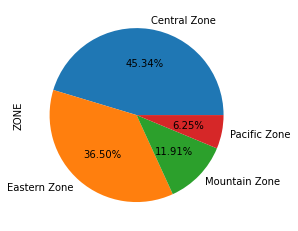

In [52]:
# Analyzing which zone was mostly affted via pie chart
df["ZONE"].value_counts().plot(kind="pie", autopct=lambda pct: f"{pct:.2f}%")


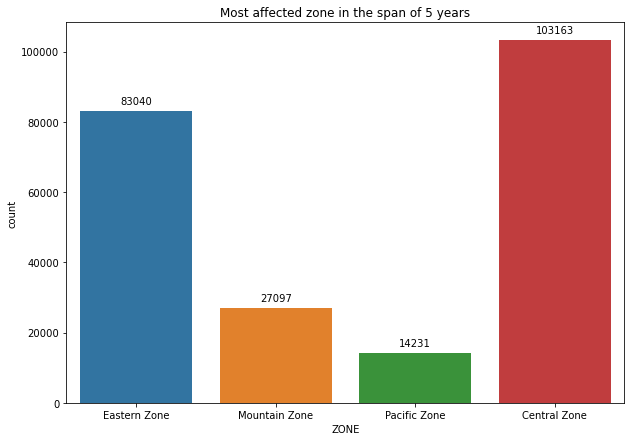

In [53]:
# NOw this plot gives the count as well in across all the zones in the span of 5 years
plt.figure(figsize=(10, 7))
ax = sns.countplot(df["ZONE"])
ax.set_title("Most affected zone in the span of 5 years")

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', 
                va='center', xytext=(0, 10), textcoords='offset points')
plt.show()


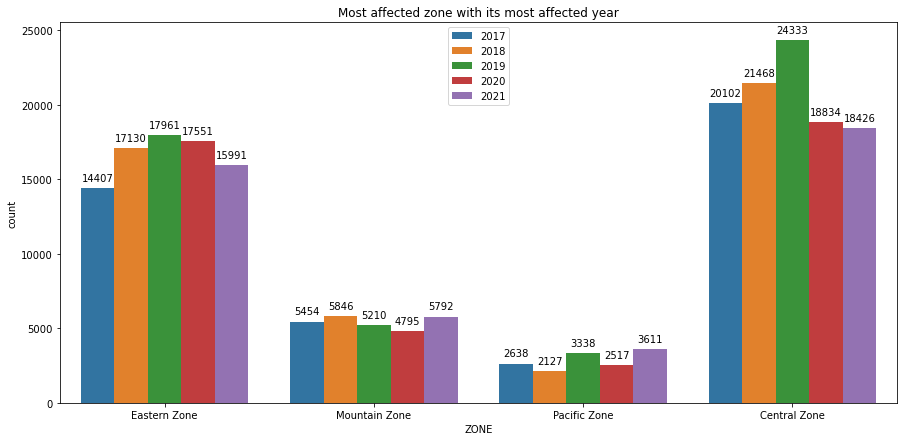

In [54]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="ZONE", hue="YEAR", data=df)
ax.set_title("Most affected zone with its most affected year")

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')
ax.legend(loc='upper center') # Structuring the legend
plt.show()

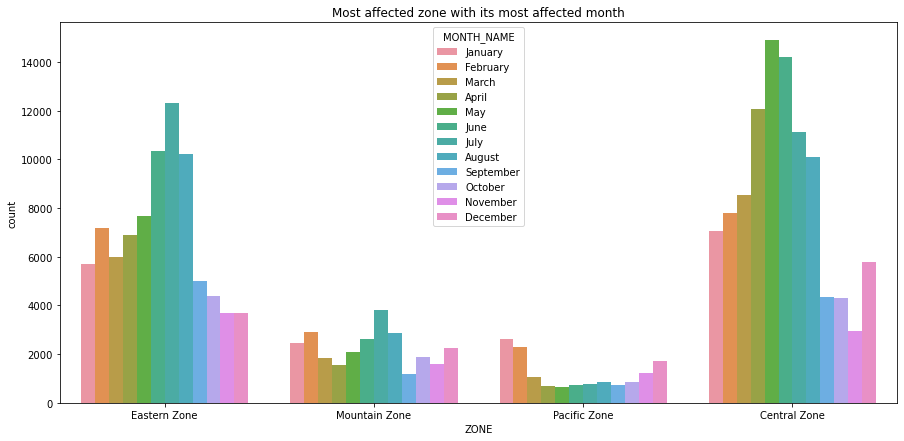

In [55]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 
               'October', 'November', 'December']
df['MONTH_NAME'] = pd.Categorical(df['MONTH_NAME'], categories=month_order, ordered=True) # Convert MONTH_NAME to ordered categorical
plt.figure(figsize=(15, 7))
sns.countplot(x="ZONE", hue="MONTH_NAME", data=df, hue_order=month_order)
plt.title("Most affected zone with its most affected month")
ax.legend(loc='upper center') # Structuring the legend
plt.show()

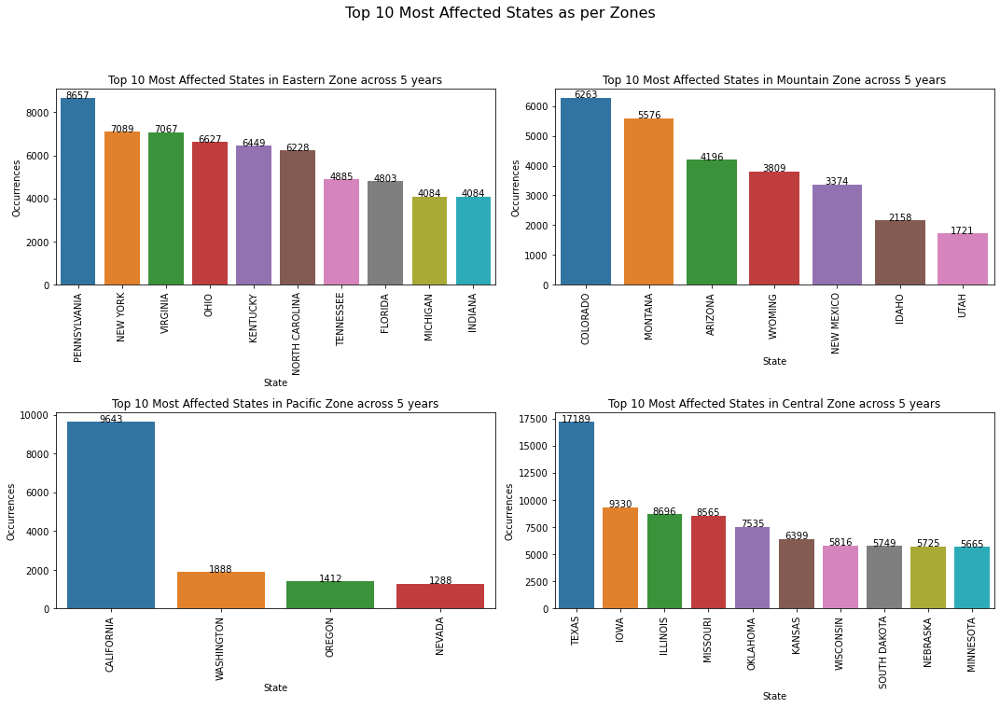

In [56]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

e_zone = df[df["ZONE"] == "Eastern Zone"]
top_states_e = e_zone["STATE"].value_counts().head(10)
sns.barplot(x=top_states_e.index, y=top_states_e.values, ax=axs[0, 0])
axs[0, 0].set_title("Top 10 Most Affected States in Eastern Zone across 5 years")
axs[0, 0].set_xlabel("State")
axs[0, 0].set_ylabel("Occurrences")
axs[0, 0].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_states_e.values):
    axs[0, 0].text(i, v+10, str(v), ha='center')

m_zone = df[df["ZONE"] == "Mountain Zone"]
top_states_m = m_zone["STATE"].value_counts().head(10)
sns.barplot(x=top_states_m.index, y=top_states_m.values, ax=axs[0, 1])
axs[0, 1].set_title("Top 10 Most Affected States in Mountain Zone across 5 years")
axs[0, 1].set_xlabel("State")
axs[0, 1].set_ylabel("Occurrences")
axs[0, 1].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_states_m.values):
    axs[0, 1].text(i, v+10, str(v), ha='center')

p_zone = df[df["ZONE"] == "Pacific Zone"]
top_states_p = p_zone["STATE"].value_counts().head(10)
sns.barplot(x=top_states_p.index, y=top_states_p.values, ax=axs[1, 0])
axs[1, 0].set_title("Top 10 Most Affected States in Pacific Zone across 5 years")
axs[1, 0].set_xlabel("State")
axs[1, 0].set_ylabel("Occurrences")
axs[1, 0].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_states_p.values):
    axs[1, 0].text(i, v+10, str(v), ha='center')

c_zone = df[df["ZONE"] == "Central Zone"]
top_states_c = c_zone["STATE"].value_counts().head(10)
sns.barplot(x=top_states_c.index, y=top_states_c.values, ax=axs[1, 1])
axs[1, 1].set_title("Top 10 Most Affected States in Central Zone across 5 years")
axs[1, 1].set_xlabel("State")
axs[1, 1].set_ylabel("Occurrences")
axs[1, 1].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_states_c.values):
    axs[1, 1].text(i, v+10, str(v), ha='center')

fig.suptitle("Top 10 Most Affected States as per Zones", fontsize=16, y=1.05)
fig.tight_layout()
plt.show()


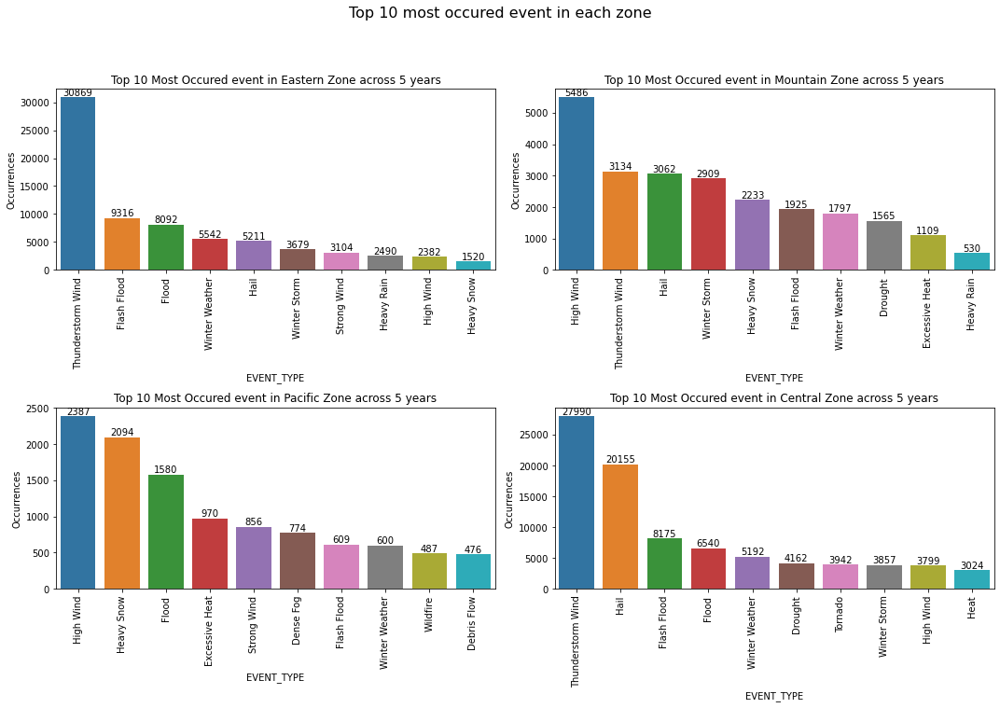

In [57]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

e_zone = df[df["ZONE"] == "Eastern Zone"]
top_events_e = e_zone["EVENT_TYPE"].value_counts().head(10)
sns.barplot(x=top_events_e.index, y=top_events_e.values, ax=axs[0, 0])
axs[0, 0].set_title("Top 10 Most Occured event in Eastern Zone across 5 years")
axs[0, 0].set_xlabel("EVENT_TYPE")
axs[0, 0].set_ylabel("Occurrences")
axs[0, 0].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_events_e.values):
    axs[0, 0].annotate(str(v), xy=(i, v), ha='center', va='bottom')

m_zone = df[df["ZONE"] == "Mountain Zone"]
top_events_m = m_zone["EVENT_TYPE"].value_counts().head(10)
sns.barplot(x=top_events_m.index, y=top_events_m.values, ax=axs[0, 1])
axs[0, 1].set_title("Top 10 Most Occured event in Mountain Zone across 5 years")
axs[0, 1].set_xlabel("EVENT_TYPE")
axs[0, 1].set_ylabel("Occurrences")
axs[0, 1].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_events_m.values):
    axs[0, 1].annotate(str(v), xy=(i, v), ha='center', va='bottom')

p_zone = df[df["ZONE"] == "Pacific Zone"]
top_events_p = p_zone["EVENT_TYPE"].value_counts().head(10)
sns.barplot(x=top_events_p.index, y=top_events_p.values, ax=axs[1, 0])
axs[1, 0].set_title("Top 10 Most Occured event in Pacific Zone across 5 years")
axs[1, 0].set_xlabel("EVENT_TYPE")
axs[1, 0].set_ylabel("Occurrences")
axs[1, 0].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_events_p.values):
    axs[1, 0].annotate(str(v), xy=(i, v), ha='center', va='bottom')

c_zone = df[df["ZONE"] == "Central Zone"]
top_events_c = c_zone["EVENT_TYPE"].value_counts().head(10)
sns.barplot(x=top_events_c.index, y=top_events_c.values, ax=axs[1, 1])
axs[1, 1].set_title("Top 10 Most Occured event in Central Zone across 5 years")
axs[1, 1].set_xlabel("EVENT_TYPE")
axs[1, 1].set_ylabel("Occurrences")
axs[1, 1].tick_params(axis='x', rotation=90)
for i, v in enumerate(top_events_c.values):
    axs[1, 1].annotate(str(v), xy=(i, v), ha='center', va='bottom')

fig.suptitle("Top 10 most occured event in each zone", fontsize=16, y=1.05)
fig.tight_layout()
plt.show()


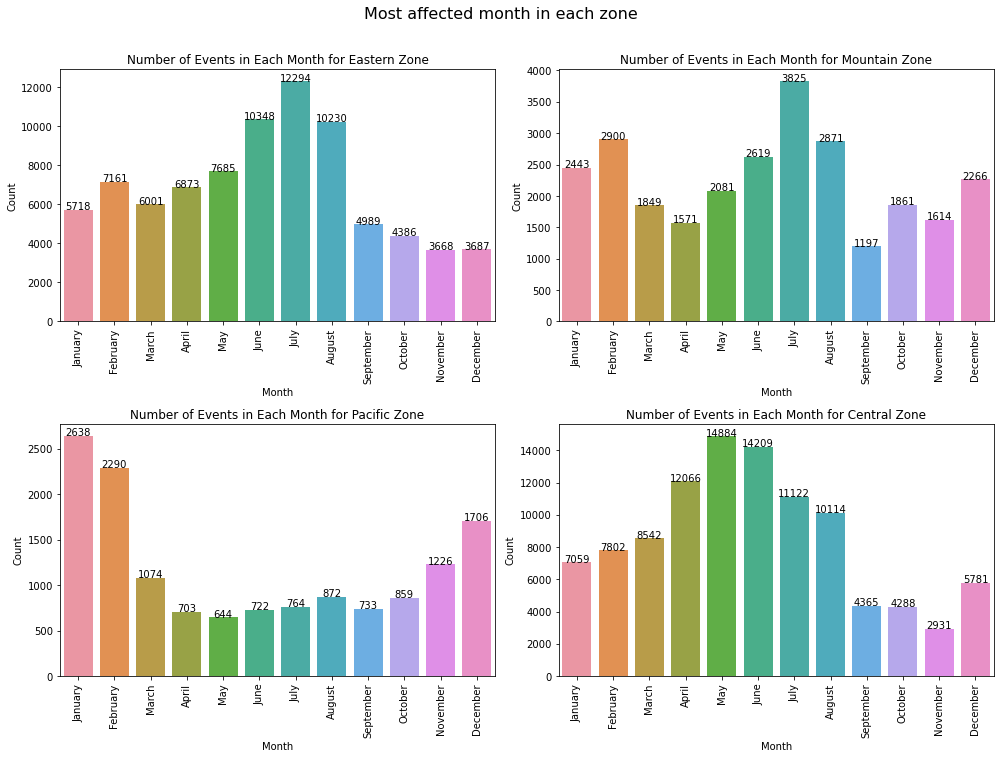

In [58]:
tz_data = {}
for tz in df["ZONE"].unique():
    tz_data[tz] = df[df["ZONE"] == tz]["MONTH_NAME"].value_counts().sort_index()

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
axes = axes.flatten()

for i, (tz, data) in enumerate(tz_data.items()):
    sns.barplot(x=data.index, y=data.values, ax=axes[i], order=["January", "February", "March", "April", "May", "June", 
                                                           "July", "August", "September", "October", "November", "December"])
    axes[i].set_title(f"Number of Events in Each Month for {tz}")
    axes[i].set_xlabel("Month")
    axes[i].set_ylabel("Count")
    for j, v in enumerate(data):
        axes[i].text(j, v + 5, str(v), ha='center')
    axes[i].set_xticklabels(data.index, rotation=90)
    
plt.tight_layout()
fig.suptitle("Most affected month in each zone", fontsize=16, y=1.05)
plt.show()


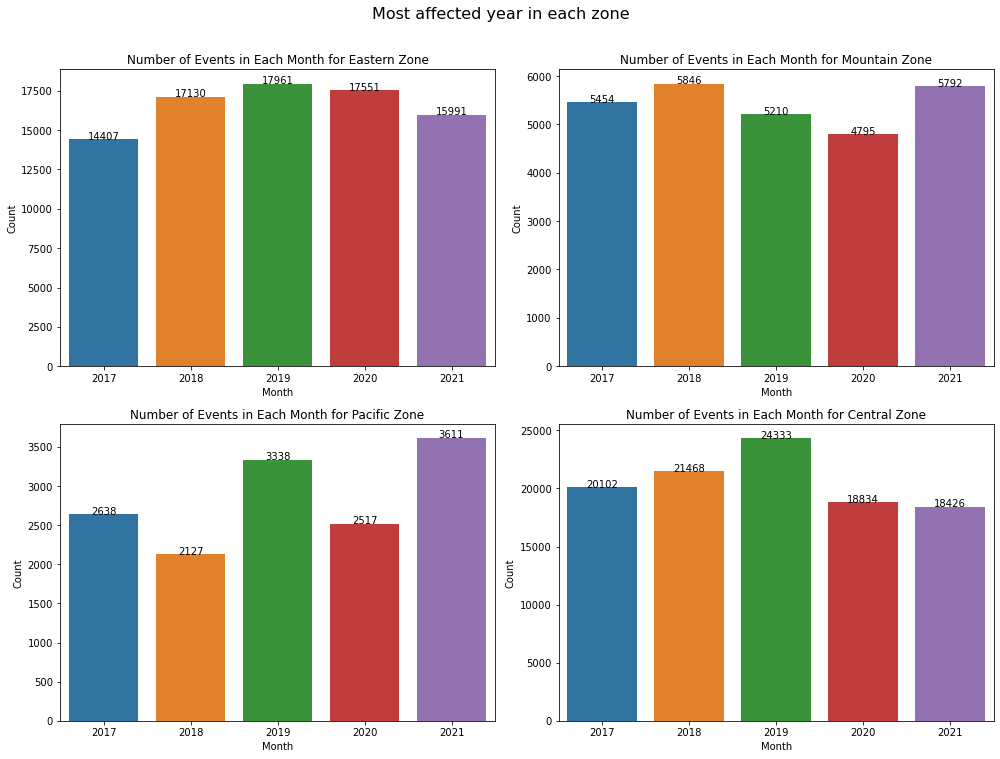

In [59]:
tz_data = {}
for tz in df["ZONE"].unique():
    tz_data[tz] = df[df["ZONE"] == tz]["YEAR"].value_counts().sort_index()

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
axes = axes.flatten()

for i, (tz, data) in enumerate(tz_data.items()):
    sns.barplot(x=data.index, y=data.values, ax=axes[i])
    axes[i].set_title(f"Number of Events in Each Month for {tz}")
    axes[i].set_xlabel("Month")
    axes[i].set_ylabel("Count")
    for j, v in enumerate(data):
        axes[i].text(j, v + 5, str(v), ha='center')
    
plt.tight_layout()
fig.suptitle("Most affected year in each zone", fontsize=16, y=1.05)
plt.show()


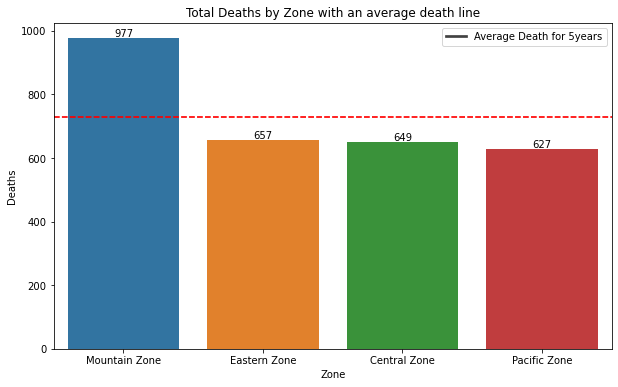

In [60]:
data = df.groupby(["ZONE"]).sum()[["DEATHS_DIRECT", "DEATHS_INDIRECT","DAMAGE_PROPERTY",
                                   "DAMAGE_CROPS"]].sort_values("DEATHS_DIRECT", ascending=False)

fig, ax = plt.subplots(figsize=(10,6))

sns.barplot(data=data, x=data.index, y="DEATHS_DIRECT", ax=ax)
ax.set_title("Total Deaths by Zone with an average death line")
ax.set_xlabel("Zone")
ax.set_ylabel("Deaths")

# Add text labels on top of bars
for i, v in enumerate(data["DEATHS_DIRECT"]):
    ax.text(i, v + 5, str(v), ha='center')

# Calculate the average death for each bar
avg_deaths = data["DEATHS_DIRECT"].mean()

# Add horizontal lines at the average value of each bar
for i, v in enumerate(data["DEATHS_DIRECT"]):
    ax.axhline(y=avg_deaths, color='r', linestyle='--', alpha=0.5)

# Add legend
ax.legend(['Average Death for 5years'])

plt.show()


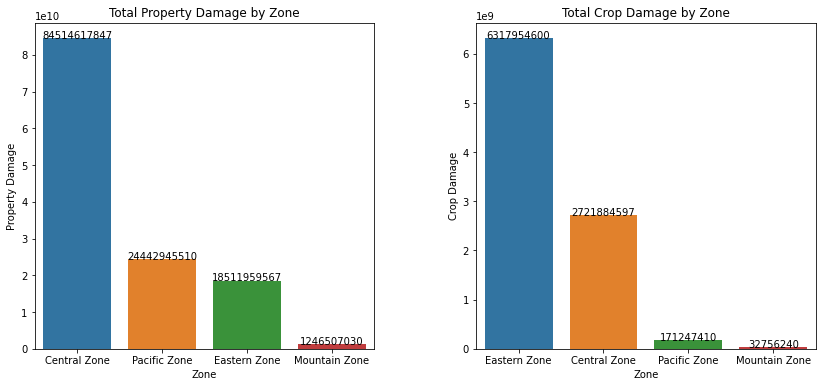

In [61]:
# Group data by zone and sum relevant columns
data = df.groupby(["ZONE"]).sum()[["DEATHS_DIRECT", "DEATHS_INDIRECT", "DAMAGE_PROPERTY", "DAMAGE_CROPS"]]

# Sort data by total property damage
data = data.sort_values("DAMAGE_PROPERTY", ascending=False)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14,6))

# Plot barplot for property damage on first subplot
sns.barplot(data=data, x=data.index, y="DAMAGE_PROPERTY", ax=ax1)
ax1.set_title("Total Property Damage by Zone")
ax1.set_xlabel("Zone")
ax1.set_ylabel("Property Damage")

# Add text labels on top of bars for property damage
for i, v in enumerate(data["DAMAGE_PROPERTY"]):
    ax1.text(i, v + 5, str(v), ha='center')

# Sort data by total crop damage
data = data.sort_values("DAMAGE_CROPS", ascending=False)

# Plot barplot for crop damage on second subplot
sns.barplot(data=data, x=data.index, y="DAMAGE_CROPS", ax=ax2)
ax2.set_title("Total Crop Damage by Zone")
ax2.set_xlabel("Zone")
ax2.set_ylabel("Crop Damage")

# Add text labels on top of bars for crop damage
for i, v in enumerate(data["DAMAGE_CROPS"]):
    ax2.text(i, v + 5, str(v), ha='center')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

plt.show()


# Visualization of 5 years data

<AxesSubplot:ylabel='YEAR'>

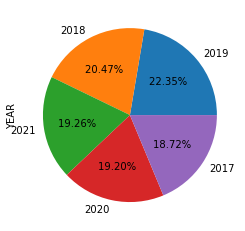

In [62]:
df["YEAR"].value_counts().plot(kind="pie", autopct=lambda pct: f"{pct:.2f}% ")


Text(0.5, 1.0, 'Plot showing in which year did the event occured the most')

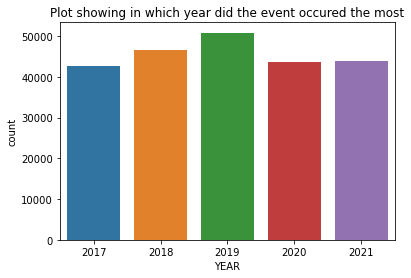

In [63]:
sns.countplot(df["YEAR"])
plt.title("Plot showing in which year did the event occured the most")

Text(0.5, 1.0, 'Pie chart showing the percent of events occured in each monthe throughout 5 years')

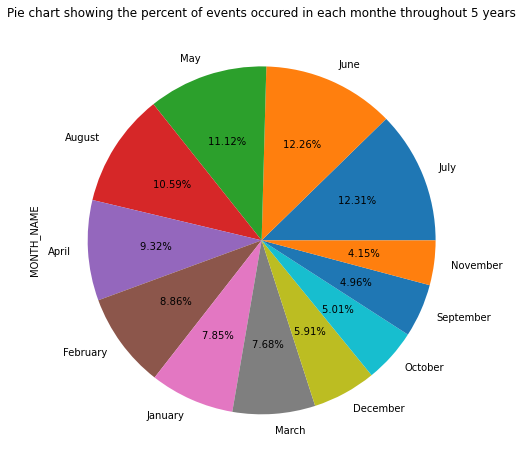

In [64]:
plt.figure(figsize=(8,8))
df["MONTH_NAME"].value_counts().plot(kind="pie", autopct=lambda pct: f"{pct:.2f}% ")
plt.title("Pie chart showing the percent of events occured in each monthe throughout 5 years")

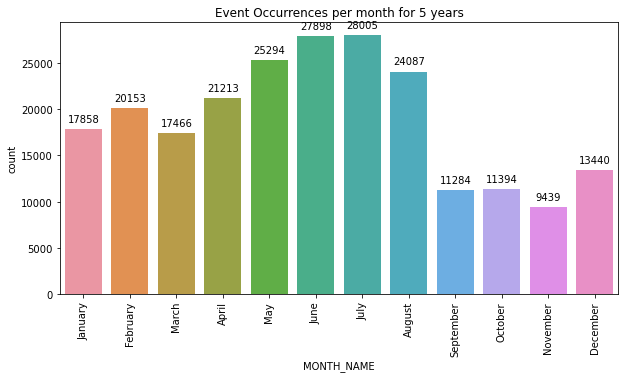

In [65]:
month_counts = df["MONTH_NAME"].value_counts()
month_order = ["January", "February", "March", "April", "May", "June", "July", "August",
               "September", "October", "November", "December"]
plt.figure(figsize=(10,5))
ax = sns.countplot(df["MONTH_NAME"], order=month_order)
plt.xticks(rotation=90)
plt.title("Event Occurrences per month for 5 years")
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()


# Analysis for the most affected state throught 2017-2021

In [66]:
df.groupby("STATE").size().sort_values(ascending=False).head(1)

STATE
TEXAS    17189
dtype: int64

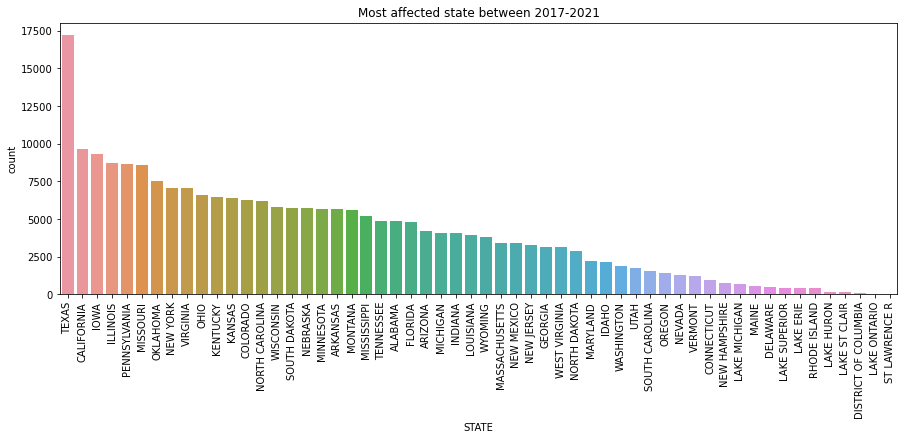

In [67]:
state_counts = df["STATE"].value_counts().sort_values(ascending=False)
state_order = state_counts.index.tolist()# Extract the ordered state names from the sorted count series
plt.figure(figsize=(15,5))
sns.countplot(df["STATE"], order=state_order)
plt.xticks(rotation=90)
plt.title("Most affected state between 2017-2021")
plt.show()


In [68]:
texas = df[df["STATE"] == "TEXAS"]
texas = texas.groupby("YEAR").size()

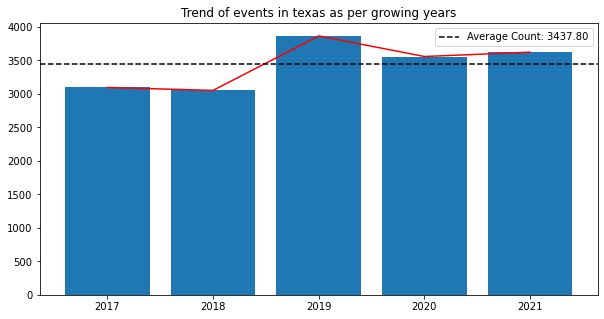

In [69]:
plt.figure(figsize=(10,5))
plt.bar(texas.index, texas.values)
plt.plot(texas.index, texas.values, color="red")
plt.title("Trend of events in texas as per growing years")
avg_count = texas.mean()

plt.axhline(y=avg_count, color='black', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.legend()
# From this plot it can be stated that the event occuracne on texas in the upcoming years will be above average line ans people should be prepared.

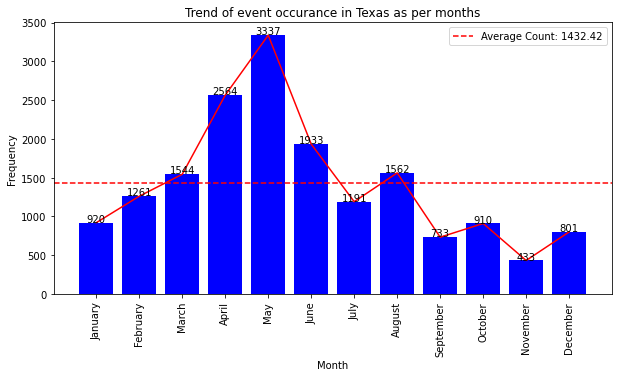

In [70]:
texas = df[df["STATE"] == "TEXAS"]
texas = texas.groupby("MONTH_NAME").size()

plt.figure(figsize=(10,5))
plt.bar(texas.index, texas.values, color='blue')
avg_count = texas.mean()

plt.axhline(y=avg_count, color='red', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.legend()

for i, v in enumerate(texas.values):
    plt.text(i, v+10, str(v), ha='center')


plt.plot(texas.index, texas.values, color='red')
plt.title("Trend of event occurance in Texas as per months")
plt.xlabel("Month")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

# From this plot it can be stated that texas is hevialy affected at April and May in comparision to others.
# Since the below chart is the total sum of each year, the distribution for each year will result the same plot so no need to plot year wise.

In [71]:
texas = df[df["STATE"] == "TEXAS"]

In [73]:
texas_events = texas.groupby("EVENT_TYPE").size().sort_values(ascending=False).head(10)

In [74]:
texas_events

EVENT_TYPE
Hail                 4729
Thunderstorm Wind    3621
Drought              1917
Flash Flood          1539
Heat                 1069
High Wind            1042
Winter Weather        531
Tornado               494
Flood                 440
Winter Storm          293
dtype: int64

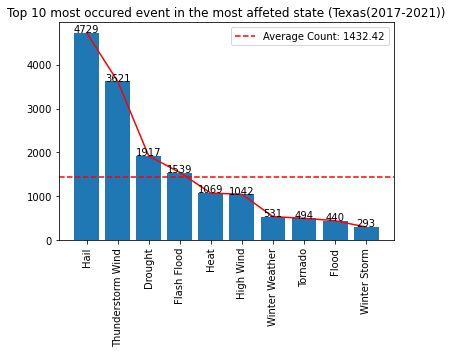

In [75]:
plt.bar(texas_events.index, texas_events.values)
plt.plot(texas_events.index, texas_events.values, color = "red")
plt.xticks(rotation=90)

plt.axhline(y=avg_count, color='red', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.legend()

for i, v in enumerate(texas_events.values):
    plt.text(i, v+10, str(v), ha='center')

plt.title("Top 10 most occured event in the most affeted state (Texas(2017-2021))")
plt.show()

# From this plot it can be said tha in the upcoming years texas is more prone to HAIL and THUNDERSTORM WIND in the month of APRIL and MAY than any other events.

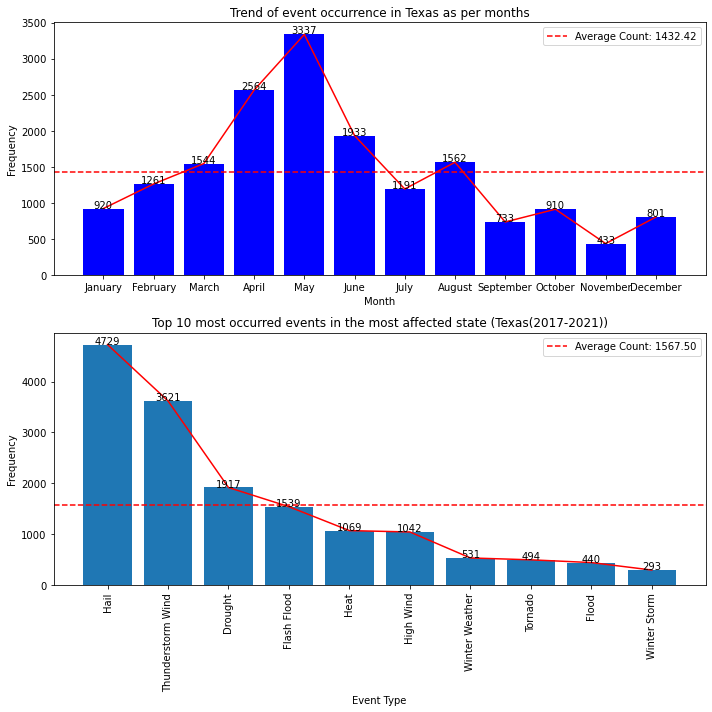

In [76]:
texas = df[df["STATE"] == "TEXAS"]
texas_monthly_events = texas.groupby("MONTH_NAME").size()
texas_top_events = texas.groupby("EVENT_TYPE").size().sort_values(ascending=False).head(10)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.bar(texas_monthly_events.index, texas_monthly_events.values, color='blue')
ax1.plot(texas_monthly_events.index, texas_monthly_events.values, color='red')
ax1.axhline(y=texas_monthly_events.mean(), color='red', linestyle='--', label=f"Average Count: {texas_monthly_events.mean():.2f}")
ax1.set_title("Trend of event occurrence in Texas as per months")
ax1.set_xlabel("Month")
ax1.set_ylabel("Frequency")
ax1.legend()

for i, v in enumerate(texas_monthly_events.values):
    ax1.text(i, v+10, str(v), ha='center')

ax2.bar(texas_top_events.index, texas_top_events.values)
ax2.plot(texas_top_events.index, texas_top_events.values, color='red')
ax2.axhline(y=texas_top_events.mean(), color='red', linestyle='--', label=f"Average Count: {texas_top_events.mean():.2f}")
ax2.set_title("Top 10 most occurred events in the most affected state (Texas(2017-2021))")
ax2.set_xlabel("Event Type")
ax2.set_ylabel("Frequency")
ax2.set_xticklabels(texas_top_events.index, rotation=90)
ax2.legend()

for i, v in enumerate(texas_top_events.values):
    ax2.text(i, v+10, str(v), ha='center')

plt.tight_layout()
plt.show()
# From this plot it can be said tha in the upcoming years texas is more prone to HAIL and THUNDERSTORM WIND in the month of APRIL and MAY than any other events.

# Analysis for the most occured event in the span of 5 years

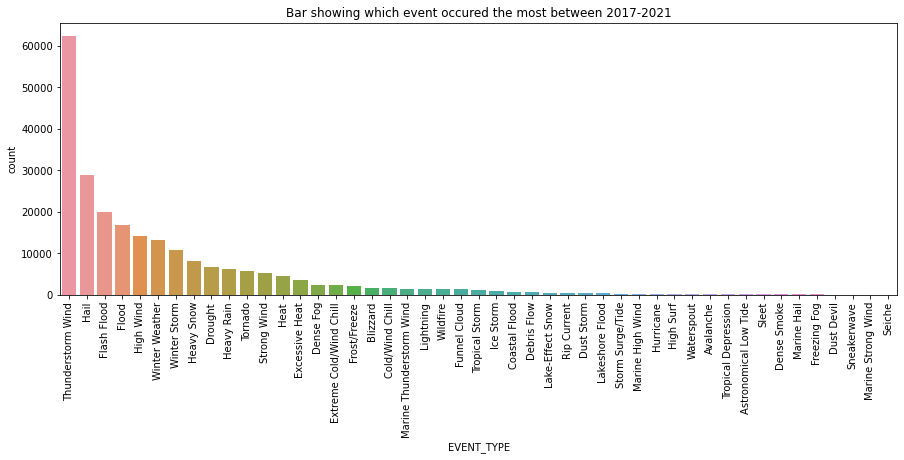

In [77]:
event_counts = df["EVENT_TYPE"].value_counts()# Count the occurrences of each event type and sort them by frequency
event_order = event_counts.index
plt.figure(figsize=(15,5))
sns.countplot(df["EVENT_TYPE"], order=event_order)
plt.xticks(rotation=90)
plt.title("Bar showing which event occured the most between 2017-2021")
plt.show()


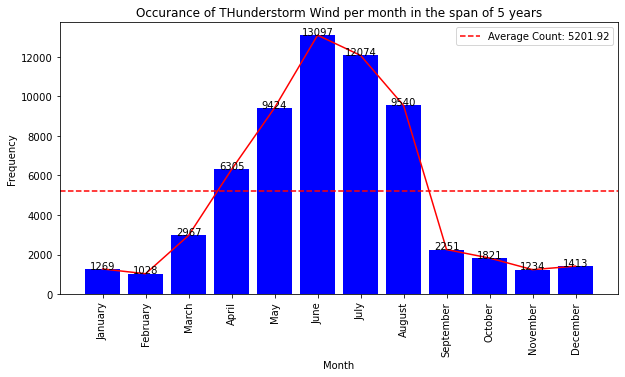

In [78]:
zz = df[df["EVENT_TYPE"] == "Thunderstorm Wind"]
zzz = zz.groupby("MONTH_NAME").size()

plt.figure(figsize=(10,5))
plt.bar(zzz.index, zzz.values, color='blue')
avg_count = zzz.mean()

plt.axhline(y=avg_count, color='red', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.legend()

for i, v in enumerate(zzz.values):
    plt.text(i, v+10, str(v), ha='center')


plt.plot(zzz.index, zzz.values, color='red')
plt.title("Occurance of THunderstorm Wind per month in the span of 5 years")
plt.xlabel("Month")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()
# This graph shows that the occurane of thunderstorm wind peaks from may to aujust so people should definetly checkout for this particlar event on these months.
# And the occurance for this event is below average on other months.

# This is the sum of 5 year data so it is obvious that in each year the occurace of thunderstom wind will peak at these months

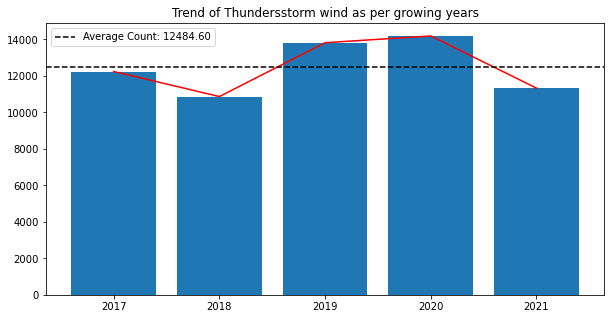

In [79]:
zz_year = zz.groupby("YEAR").size()
plt.figure(figsize=(10,5))
plt.bar(zz_year.index, zz_year.values)
plt.plot(zz_year.index, zz_year.values, color='red')
avg_count = zz_year.mean()

plt.axhline(y=avg_count, color='black', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.title("Trend of Thundersstorm wind as per growing years")
plt.legend()
# THe plt below shows the trend of thundersotrm event as per the incresing years which is very high. Observing the behavior of this event troughout 5 years it can be said 
# that its occurance in the upcoming year will be above the average line.

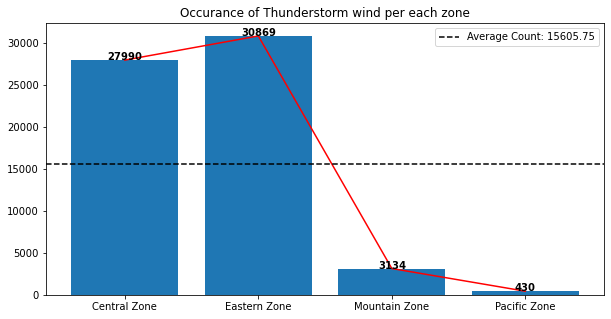

In [80]:
zz_zone = zz.groupby("ZONE").size()
plt.figure(figsize=(10,5))
plt.bar(zz_zone.index, zz_zone.values)
plt.plot(zz_zone.index, zz_zone.values, color='red')
avg_count = zz_zone.mean()

plt.axhline(y=avg_count, color='black', linestyle='--', label=f"Average Count: {avg_count:.2f}")
plt.legend()

# Add count labels on top of each bar
for i, v in enumerate(zz_zone.values):
    plt.text(i, v+10, str(v), ha='center', fontweight='bold')

plt.title("Occurance of Thunderstorm wind per each zone")
plt.show()
# From the plot below it can be concluded that thunderstorm event is more likely to occur in central and eastern zone than others.

# Analysis for the most affected state per year and months

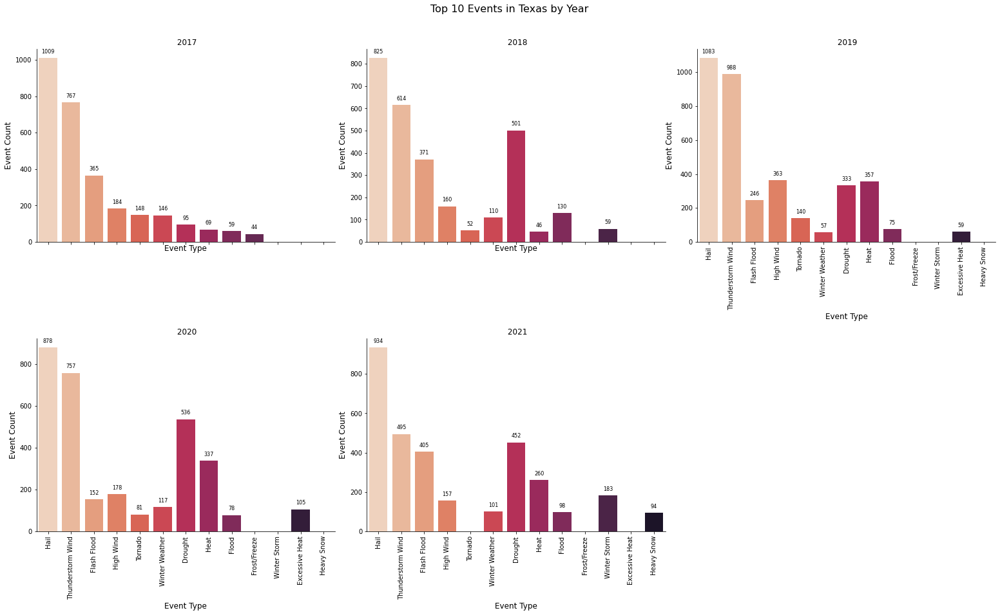

In [97]:
tt_event = df[df["STATE"] == "TEXAS"]
tt_event = tt_event.groupby(["YEAR", "EVENT_TYPE"]).size().reset_index(name="EVENT_COUNT")

top_events = pd.DataFrame(columns=["YEAR", "EVENT_TYPE", "EVENT_COUNT"])

for year in tt_event["YEAR"].unique():
    year_data = tt_event[tt_event["YEAR"] == year]
    top_year_events = year_data.sort_values("EVENT_COUNT", ascending=False).head(10)
    top_events = top_events.append(top_year_events, ignore_index=True)

g = sns.catplot(x="EVENT_TYPE", y="EVENT_COUNT", data=top_events, col="YEAR", col_wrap=3, kind="bar", 
                height=6, aspect=1.2, sharey=False, palette="rocket_r")

for ax in g.axes.flat:
    ax.set_title(ax.get_title().split("=")[1])
    ax.set_xlabel('Event Type', fontsize=12)
    ax.set_ylabel('Event Count', fontsize=12)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points', fontsize=8)

for ax in g.axes.flat:
    plt.setp(ax.get_xticklabels(), rotation=90)

g.fig.suptitle("Top 10 Events in Texas by Year", fontsize=16)

g.fig.subplots_adjust(top=0.9, hspace=0.5)

# Show the plot
plt.show()

Text(0.5, 1.0, 'Average duraion of event in each year ')

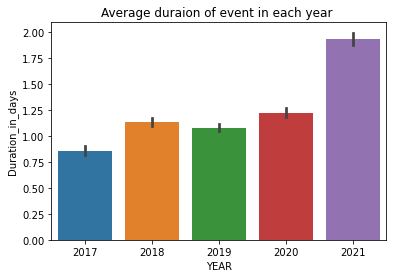

In [81]:
sns.barplot(df["YEAR"], df["Duration_in_days"])
plt.title("Average duraion of event in each year ")

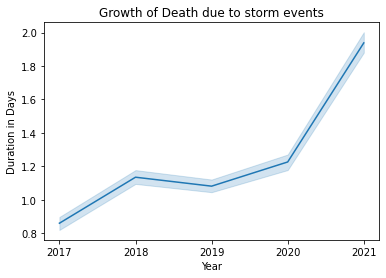

In [82]:
sns.lineplot(x="YEAR", y="Duration_in_days", data=df)
plt.title("Growth of Death due to storm events")
plt.xlabel("Year")
plt.xticks(df["YEAR"].unique())
plt.ylabel("Duration in Days")
plt.show()

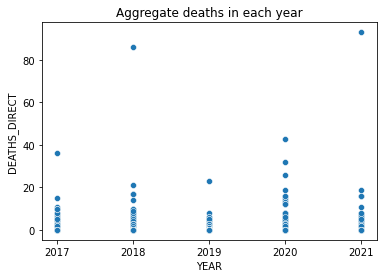

In [83]:
sns.scatterplot(df["YEAR"], df["DEATHS_DIRECT"])
plt.title("Aggregate deaths in each year")
plt.xticks(df["YEAR"].astype(int).unique())
plt.show()

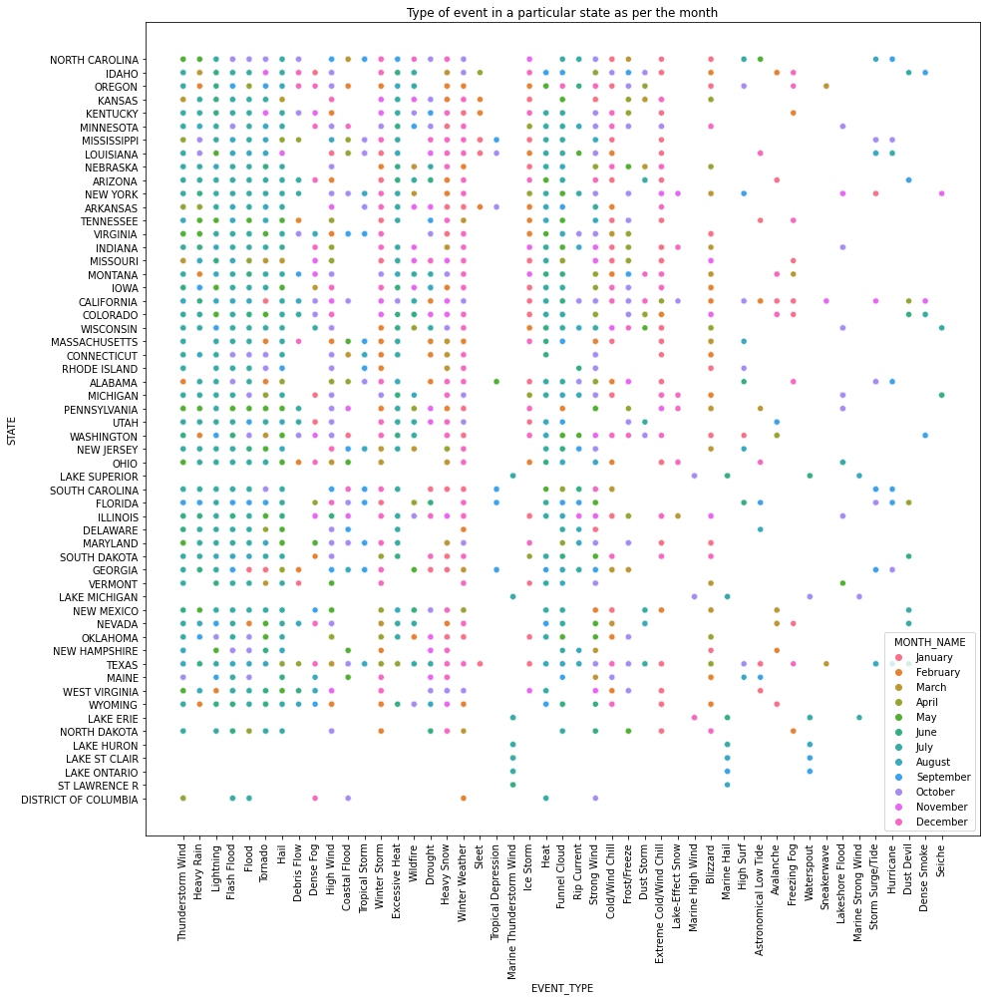

In [84]:
# THis plot is showing the occurance of event in event in each state per month. If there are nodots it means the event never 
# counterd on that state in hte spa for 5 years
plt.subplots(figsize=(15,15))
sns.scatterplot(df["EVENT_TYPE"], df["STATE"], hue=df["MONTH_NAME"])
plt.xticks(rotation=90)
plt.title("Type of event in a particular state as per the month")
plt.show()

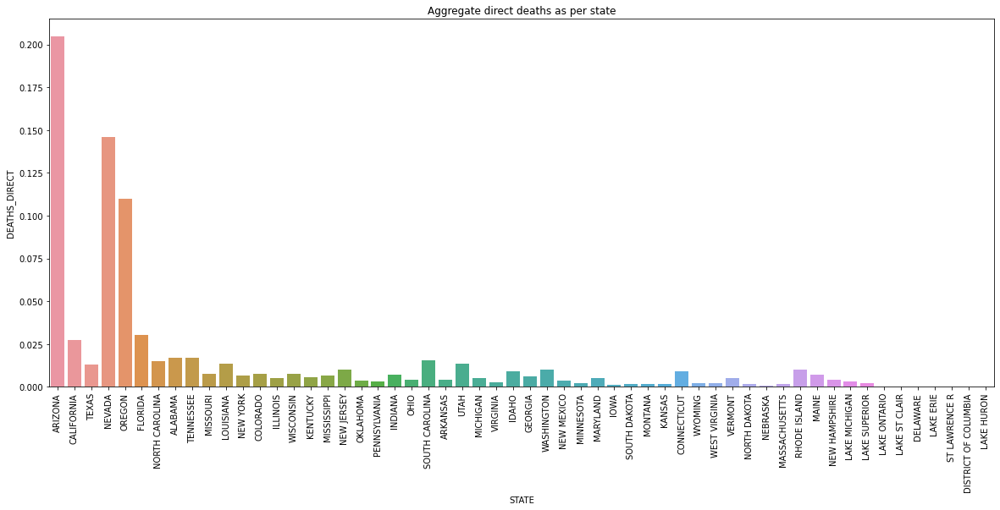

In [85]:
state_order = df.groupby("STATE")["DEATHS_DIRECT"].sum().sort_values(ascending=False).index

plt.figure(figsize=(20,8))
sns.barplot(x="STATE", y="DEATHS_DIRECT", data=df, order=state_order, ci=None) # The error bars removed
plt.xticks(rotation=90)
plt.title("Aggregate direct deaths as per state")
plt.show()


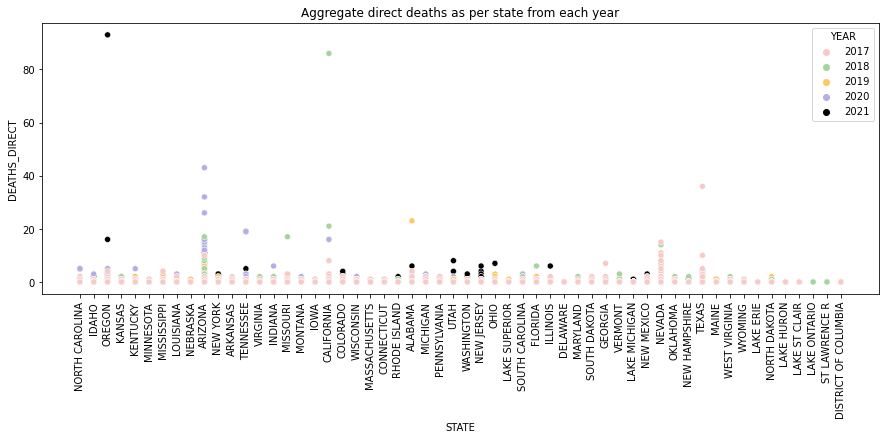

In [86]:
plt.figure(figsize=(15,5))
custom_palette = ['#f7cac9', '#a6d49f', '#ffc75f', '#b4aee8', 'Black']
sns.scatterplot(x="STATE", y="DEATHS_DIRECT", hue="YEAR", data=df, palette=custom_palette)
plt.xticks(rotation=90)
plt.title("Aggregate direct deaths as per state from each year")
plt.show()

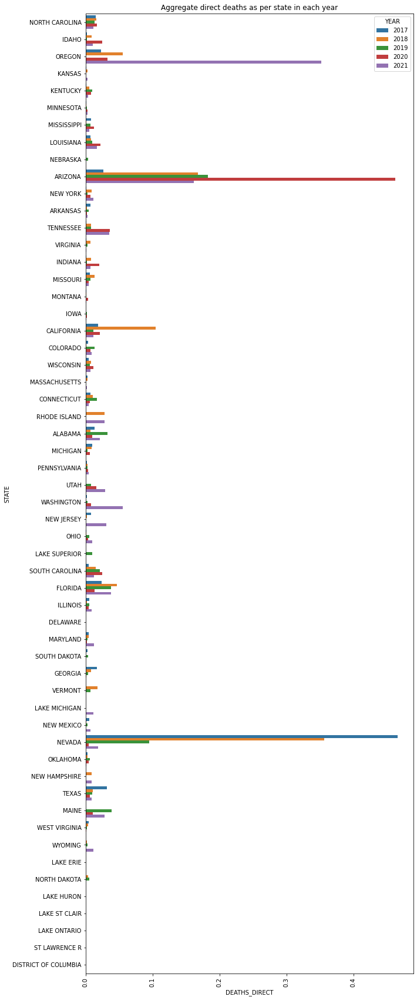

In [87]:
plt.figure(figsize=(10,30))
sns.barplot(x="DEATHS_DIRECT", y="STATE", hue=df["YEAR"],data=df, ci=None) # The error bars removed
plt.xticks(rotation=90)
plt.title("Aggregate direct deaths as per state in each year")
plt.show()

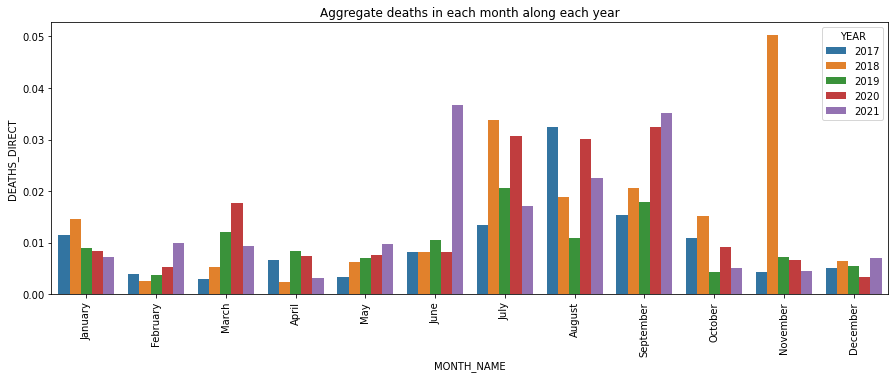

In [88]:
plt.figure(figsize=(15,5))
month_order = pd.to_datetime(df['MONTH_NAME'], format='%B').dt.month.sort_values().unique()
month_labels = pd.to_datetime(month_order, format='%m').strftime('%B')

sns.barplot(x="MONTH_NAME", y="DEATHS_DIRECT", hue="YEAR", data=df, ci=None, order=month_labels)
plt.xticks(rotation=90)
plt.title("Aggregate deaths in each month along each year")
plt.show()


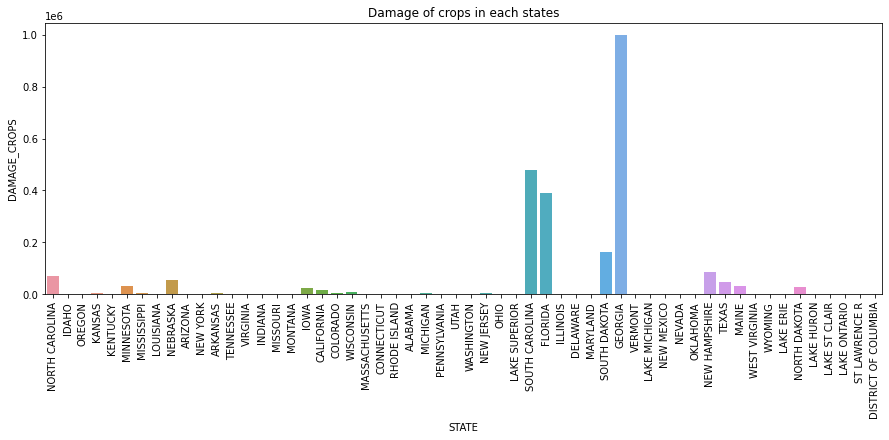

In [89]:
plt.figure(figsize=(15,5))
sns.barplot(df["STATE"], df["DAMAGE_CROPS"], ci=None)
plt.xticks(rotation=90)
plt.title("Damage of crops in each states")
plt.show()

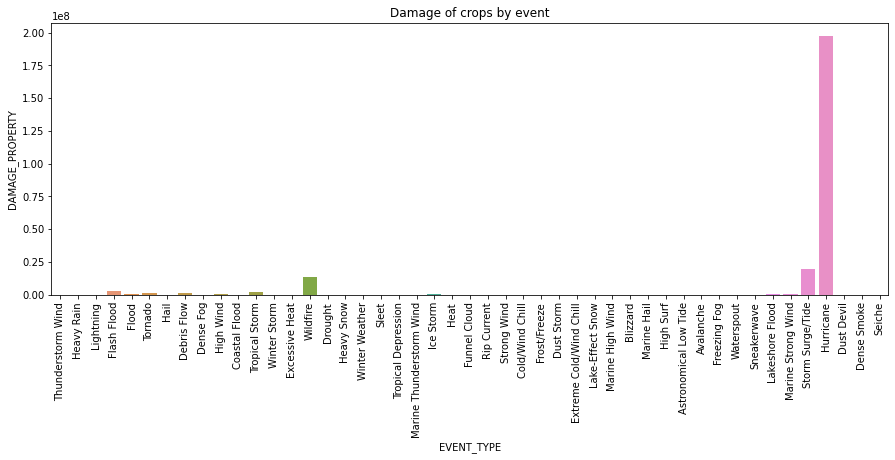

In [90]:
plt.figure(figsize=(15,5))
sns.barplot(df["EVENT_TYPE"], df["DAMAGE_PROPERTY"], ci=None)
plt.xticks(rotation=90)
plt.title("Damage of crops by event")
plt.show()

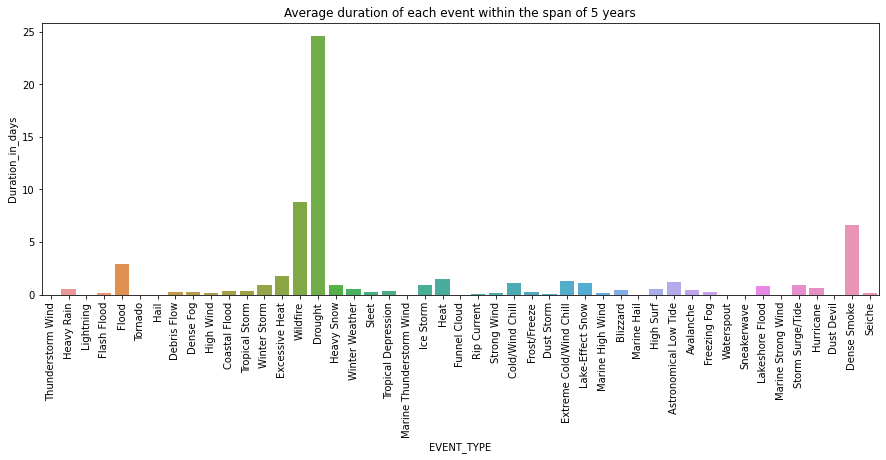

In [91]:
plt.figure(figsize=(15,5))
sns.barplot(df["EVENT_TYPE"], df["Duration_in_days"], ci=None)
plt.xticks(rotation=90)
plt.title("Average duration of each event within the span of 5 years")
plt.show()

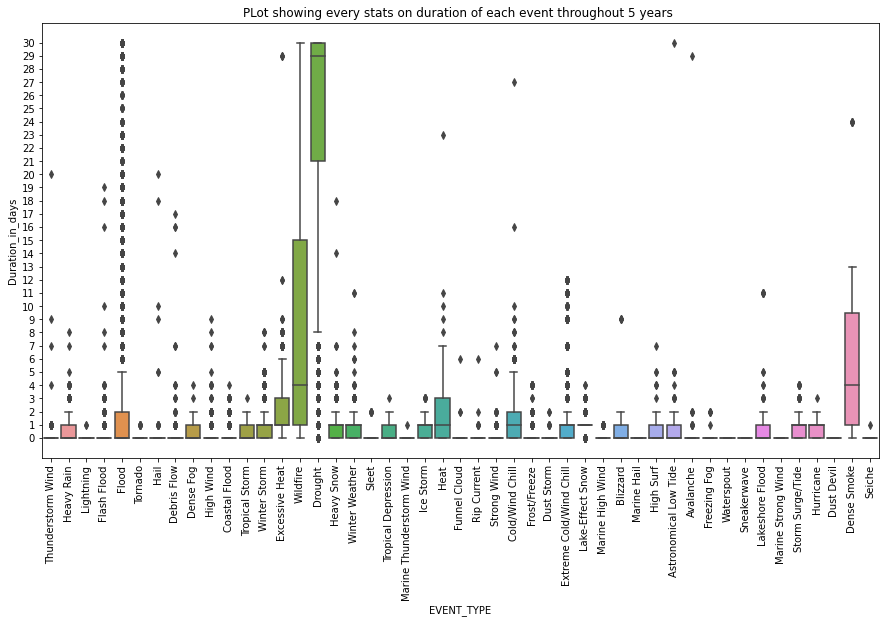

In [92]:
plt.figure(figsize=(15,8))
sns.boxplot(df["EVENT_TYPE"], df["Duration_in_days"])
plt.xticks(rotation=90)
plt.yticks(df["Duration_in_days"].unique())
plt.title("PLot showing every stats on duration of each event throughout 5 years ")
plt.show()

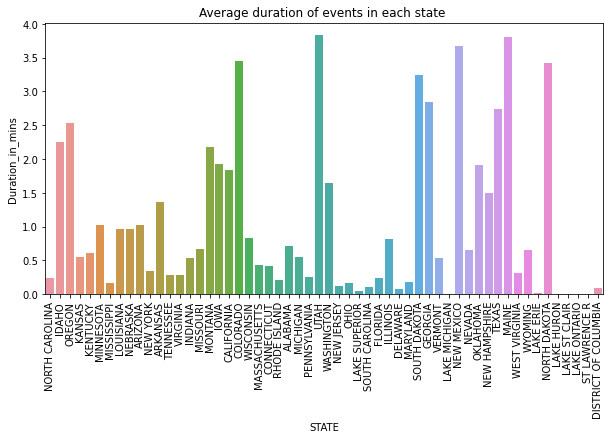

In [93]:
plt.figure(figsize=(10,5))
sns.barplot(df["STATE"], df["Duration_in_days"], ci = None)
plt.xticks(rotation=90)
plt.title("Average duration of events in each state ")
plt.ylabel("Duration_in_mins")
plt.show()

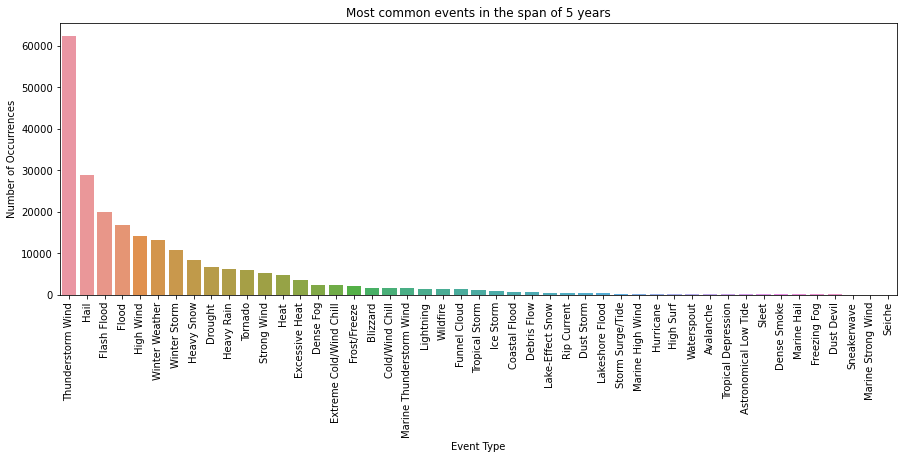

In [94]:
plt.figure(figsize=(15, 5))

sns.countplot(data=df, x="EVENT_TYPE", order=df["EVENT_TYPE"].value_counts().index)

plt.title("Most common events in the span of 5 years")
plt.xlabel("Event Type")
plt.ylabel("Number of Occurrences")

plt.xticks(rotation=90)
plt.show()


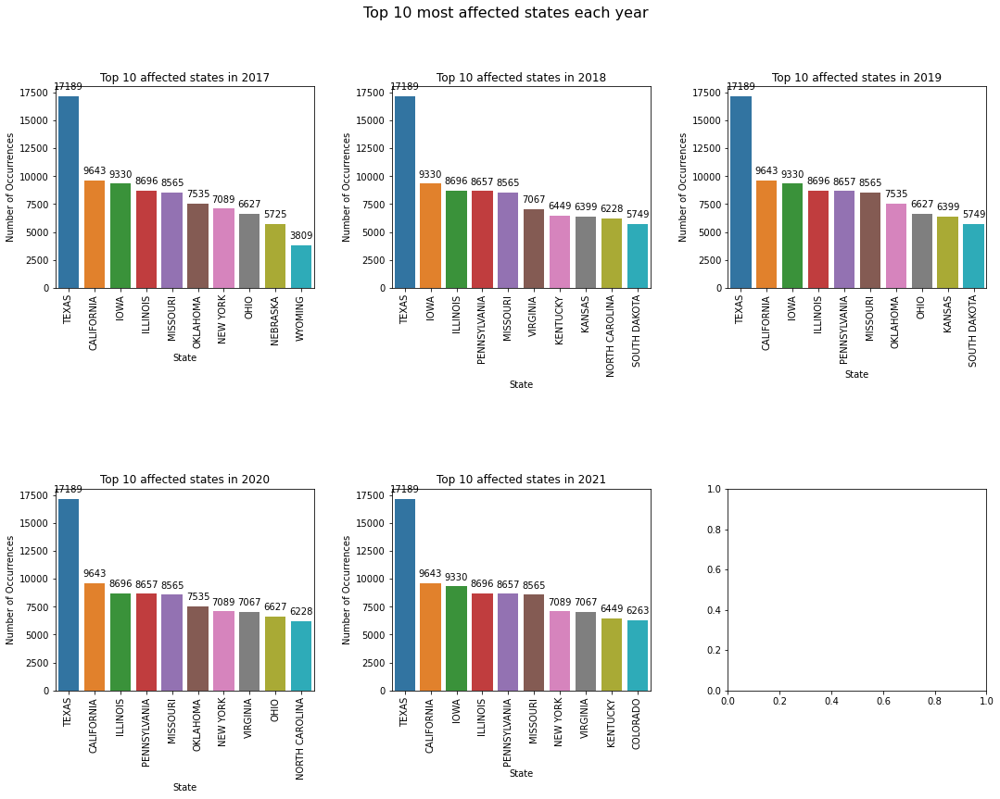

In [95]:
grouped = df.groupby(["YEAR", "STATE"]).size().reset_index(name='count')
years = sorted(df['YEAR'].unique())

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
fig.suptitle('Top 10 most affected states each year', fontsize=16)

for i, year in enumerate(years):
    top_10_states = grouped[grouped['YEAR'] == year].nlargest(10, 'count')['STATE']
    filtered = df[df['STATE'].isin(top_10_states)]
    sns.countplot(x='STATE', data=filtered, order=filtered['STATE'].value_counts().index, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Top 10 affected states in {year}")
    axes[i//3, i%3].set_xlabel('State')
    axes[i//3, i%3].set_ylabel('Number of Occurrences')
    axes[i//3, i%3].tick_params(axis='x', rotation=90)
    for p in axes[i//3, i%3].patches:
        axes[i//3, i%3].annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', 
                                 va='center', xytext=(0, 10), textcoords='offset points')
    
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.show()


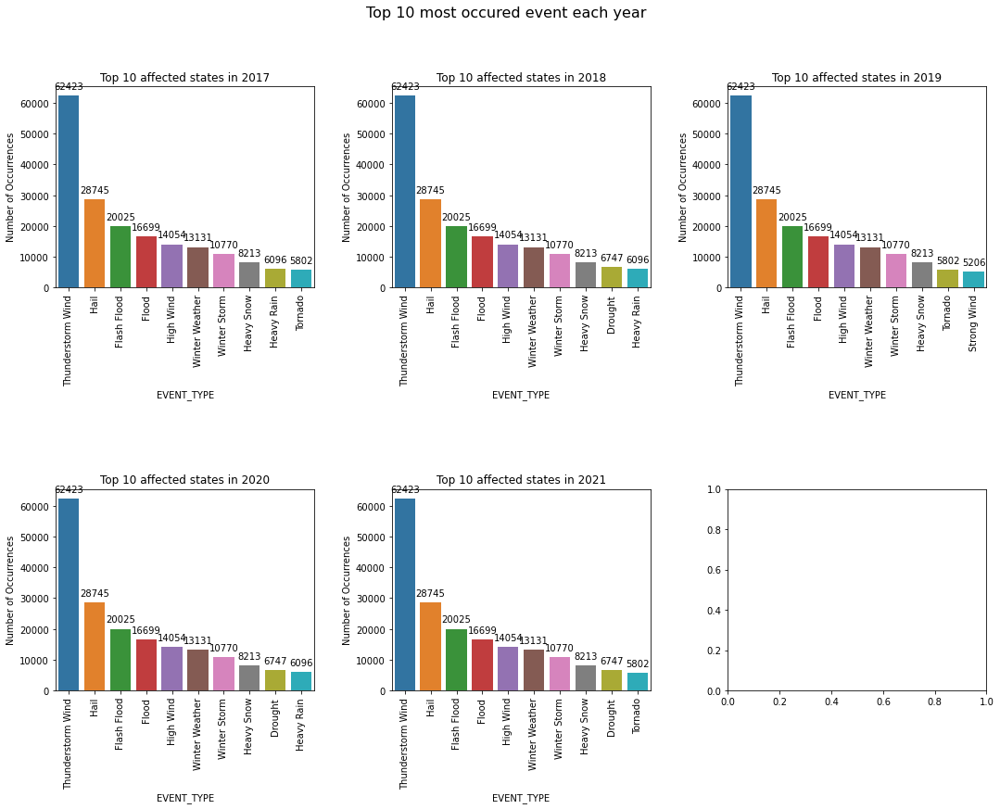

In [96]:
grouped = df.groupby(["YEAR", "EVENT_TYPE"]).size().reset_index(name='count')
years = sorted(df['YEAR'].unique())

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
fig.suptitle('Top 10 most occured event each year', fontsize=16)

for i, year in enumerate(years):
    top_10_states = grouped[grouped['YEAR'] == year].nlargest(10, 'count')['EVENT_TYPE']
    filtered = df[df['EVENT_TYPE'].isin(top_10_states)]
    sns.countplot(x='EVENT_TYPE', data=filtered, order=filtered['EVENT_TYPE'].value_counts().index, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Top 10 affected states in {year}")
    axes[i//3, i%3].set_xlabel('EVENT_TYPE')
    axes[i//3, i%3].set_ylabel('Number of Occurrences')
    axes[i//3, i%3].tick_params(axis='x', rotation=90)
    for p in axes[i//3, i%3].patches:
        axes[i//3, i%3].annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', 
                                 va='center', xytext=(0, 10), textcoords='offset points')
    
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.show()

# Comparision of most commom events over each month from 2017-2021

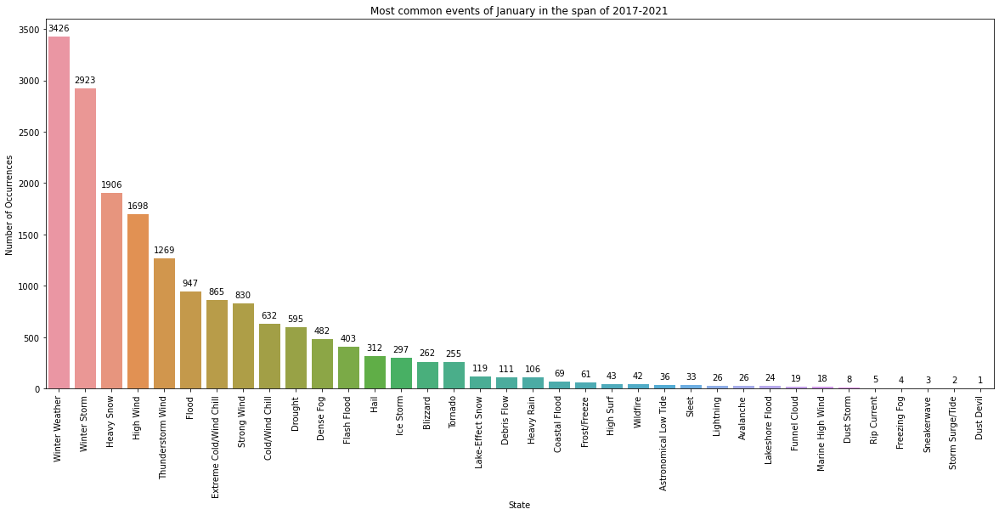

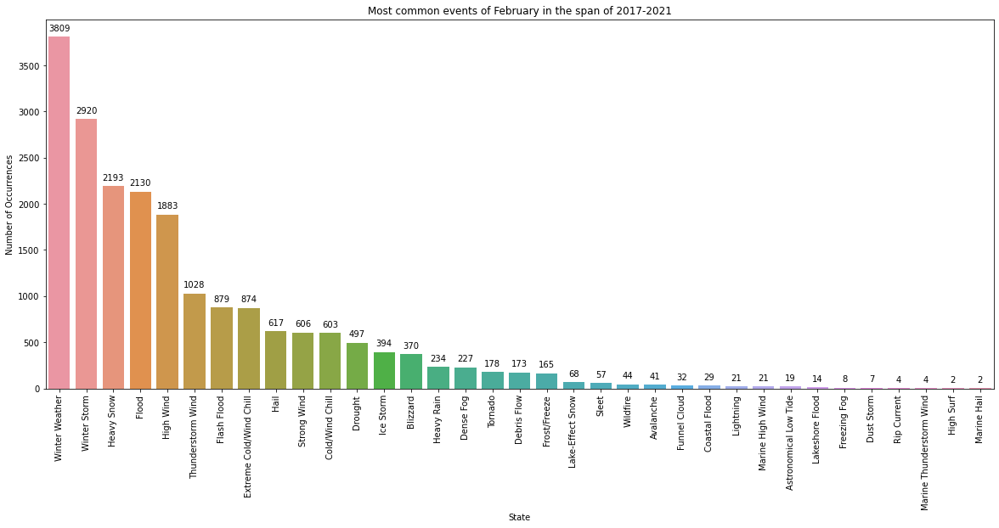

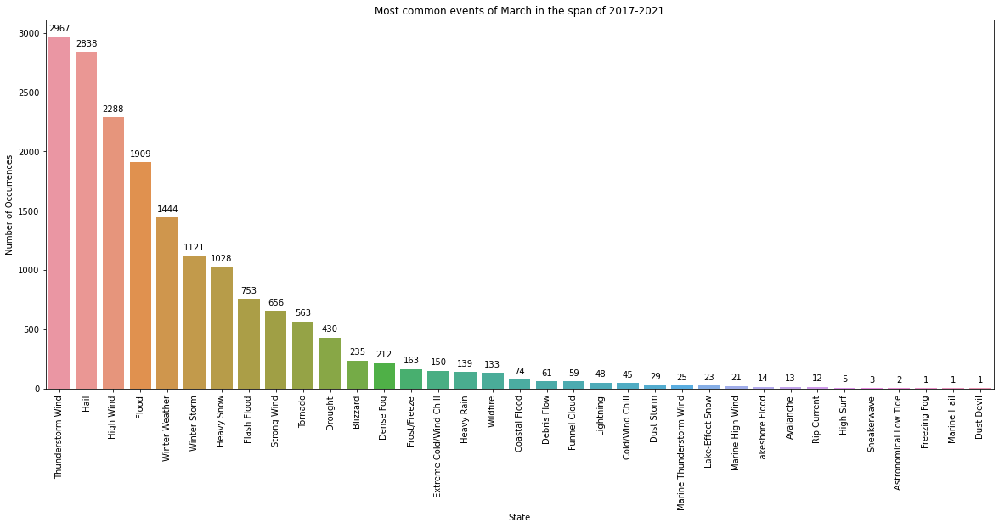

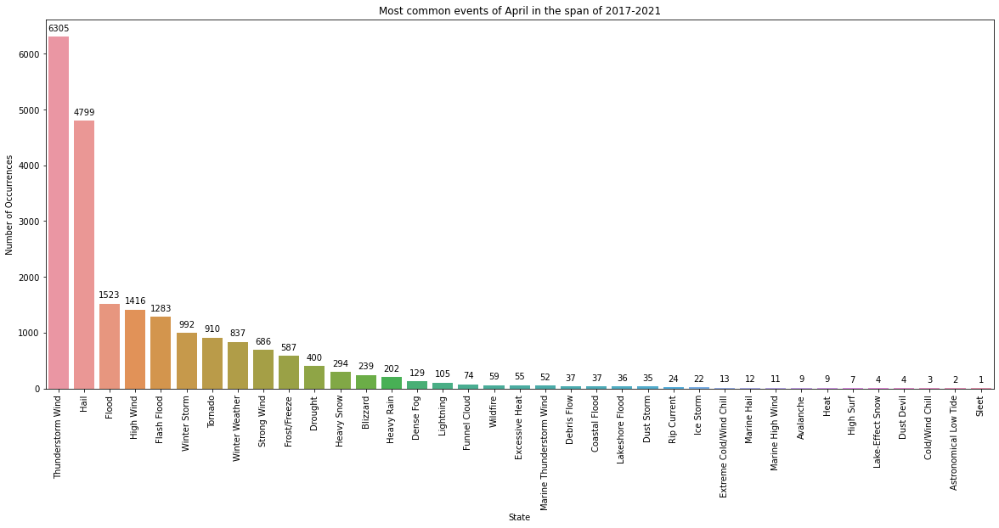

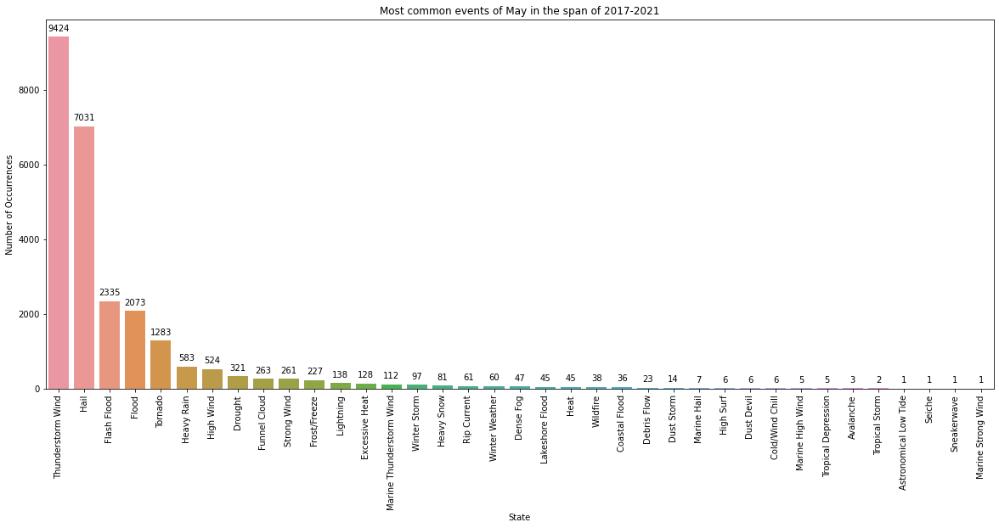

...

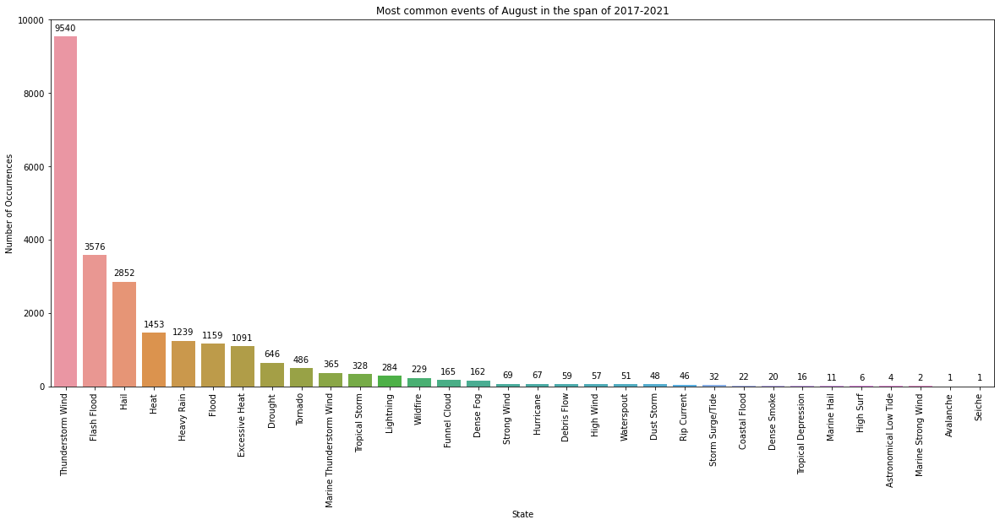

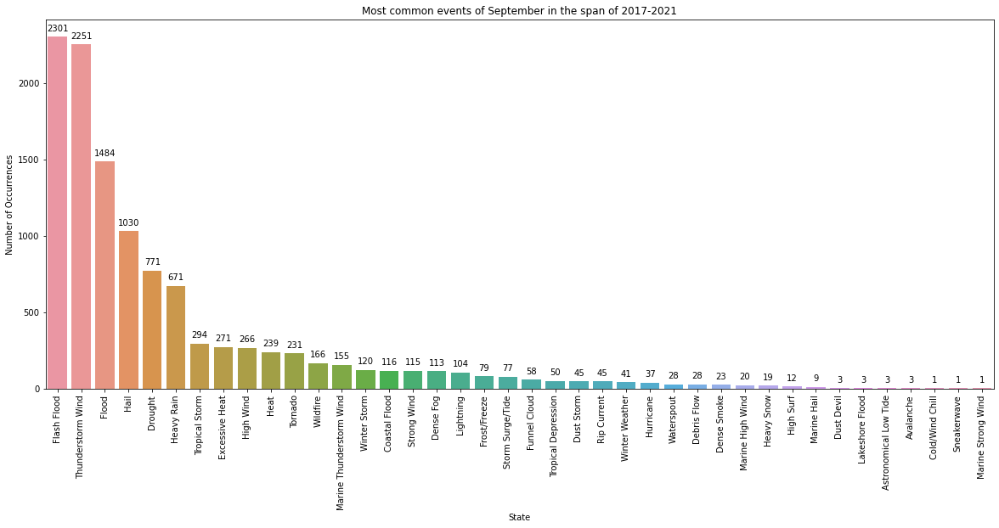

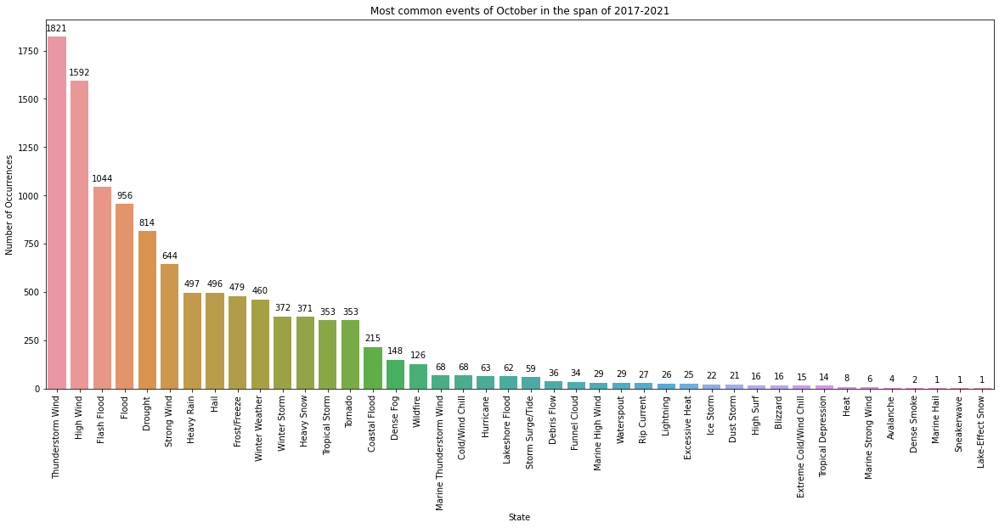

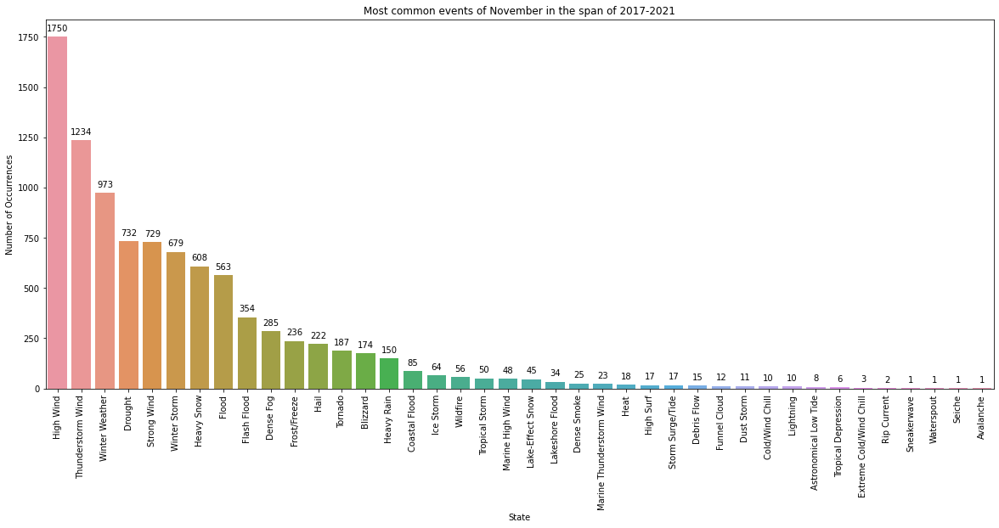

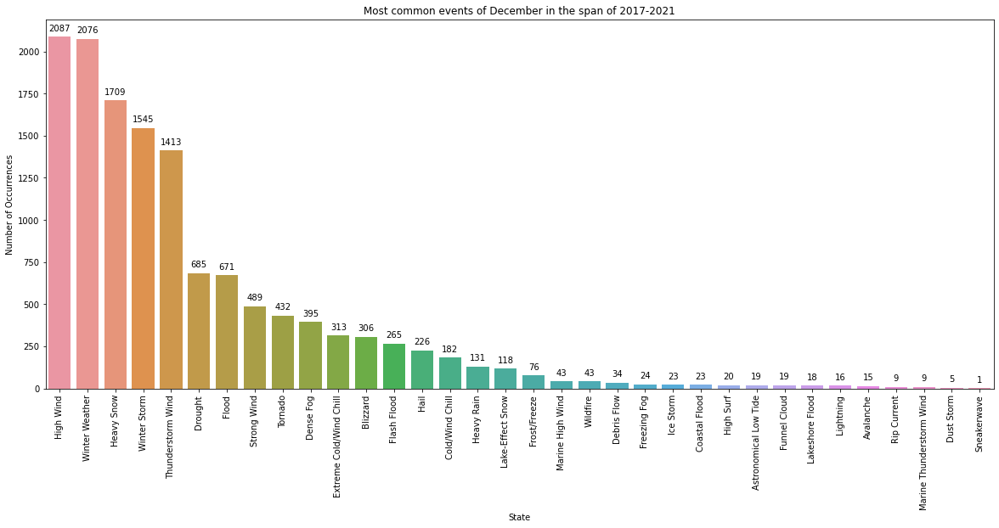

In [98]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df[df["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in the span of 2017-2021")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    plt.show()
    
# This plots below represents that winter weather collectively occured 3426 times in January from 2017-2021. likewise for others

# Comparision of most affected state over each month from 2017-2021

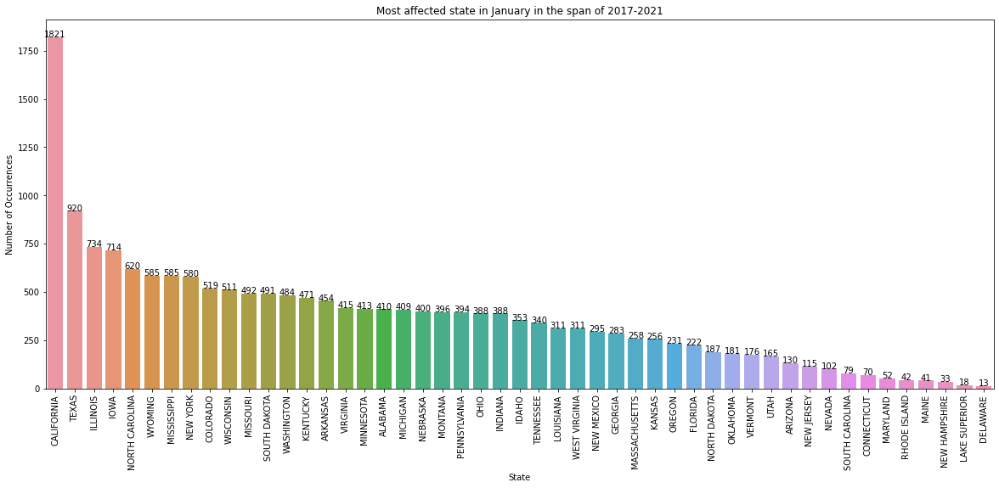

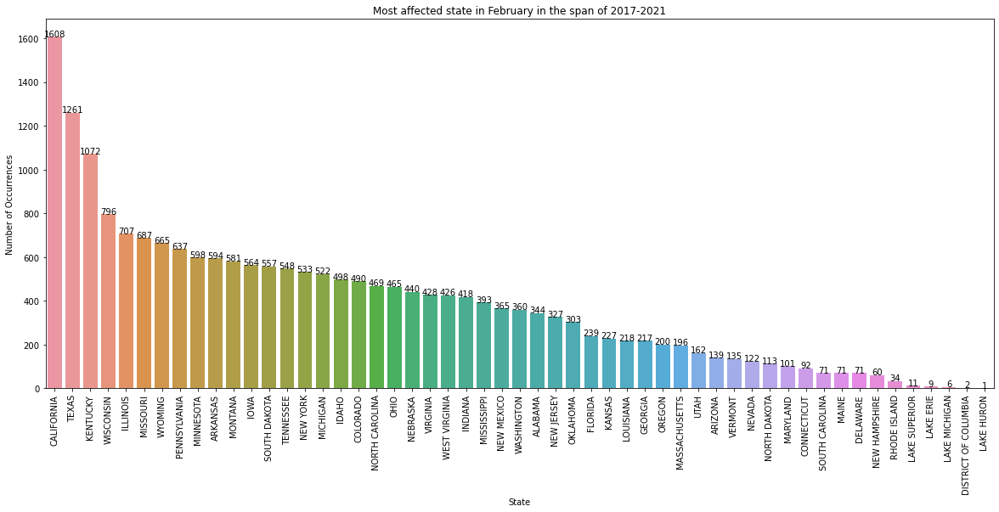

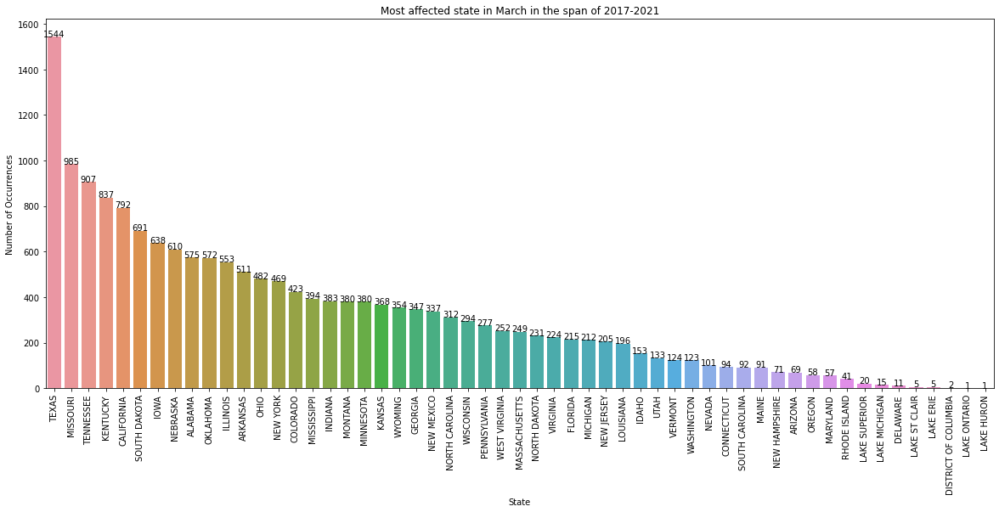

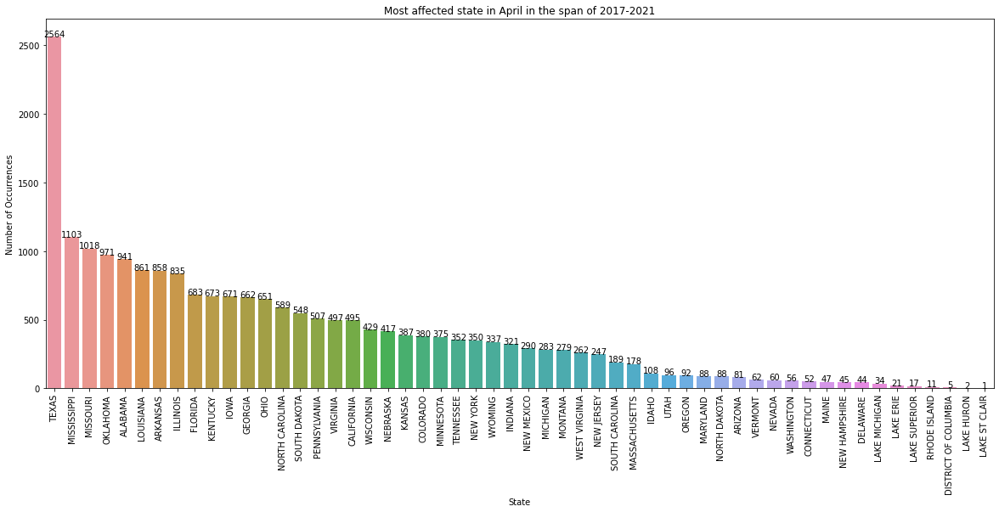

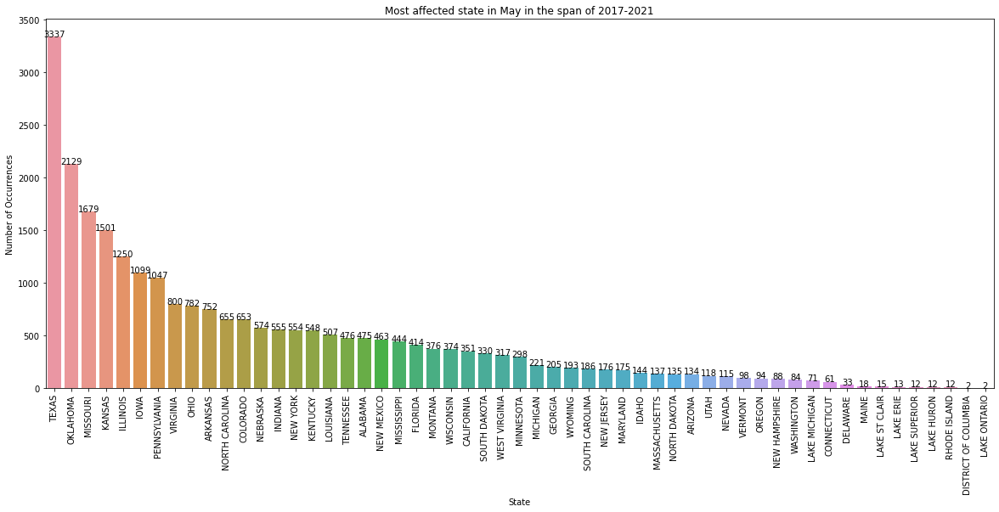

...

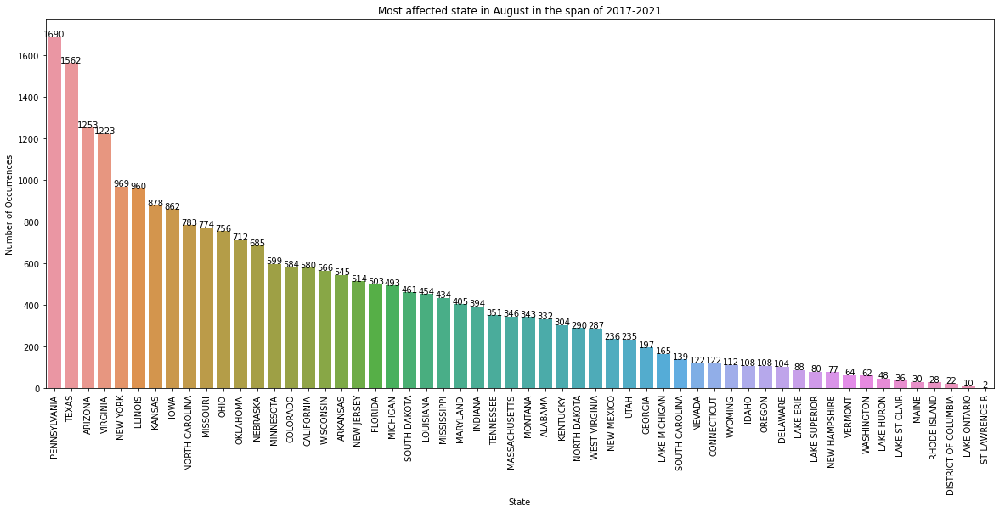

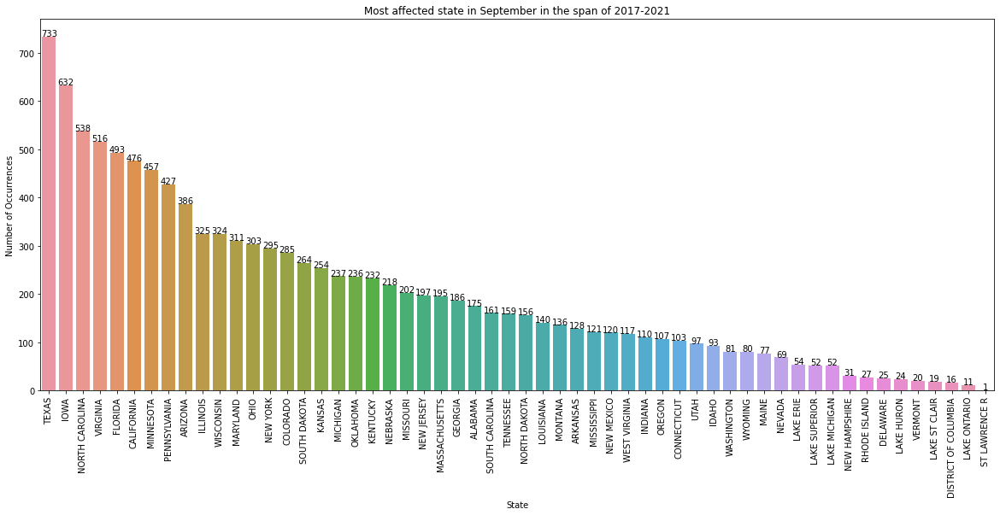

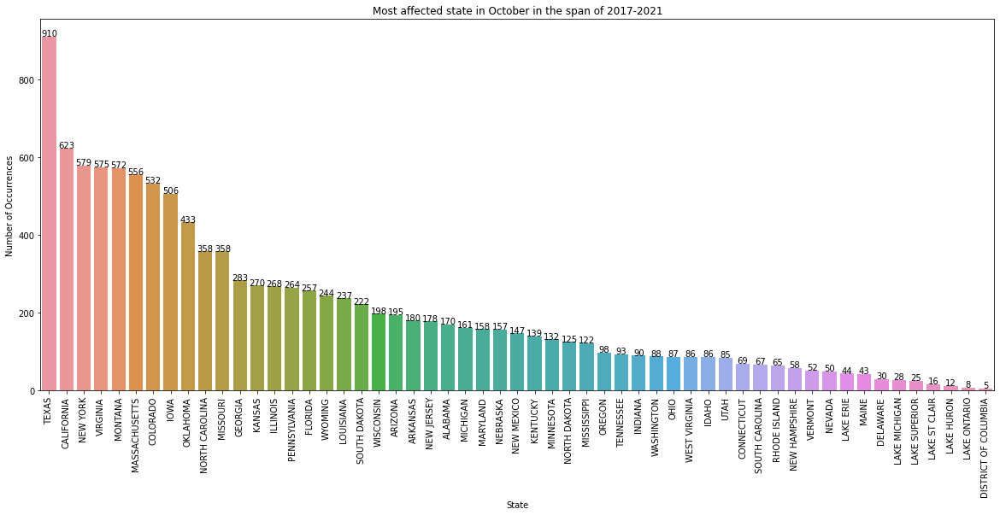

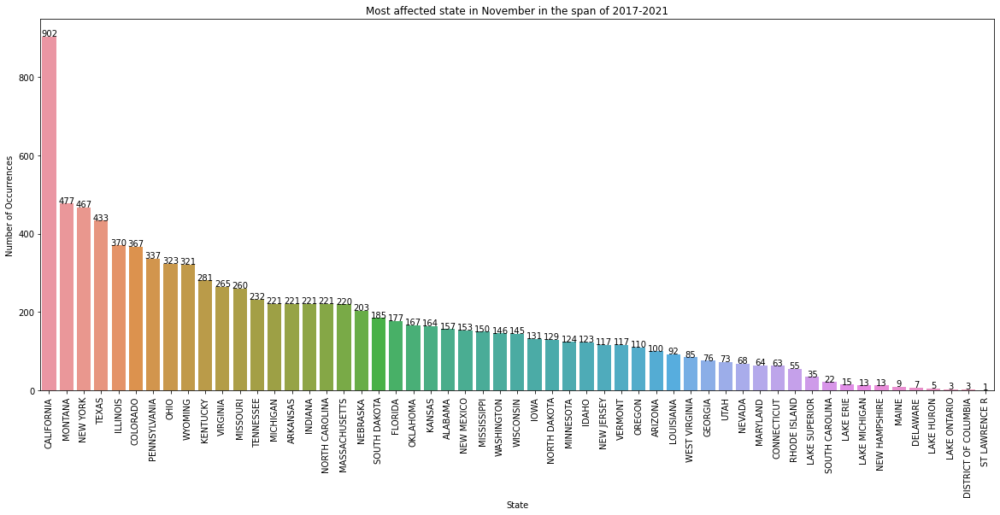

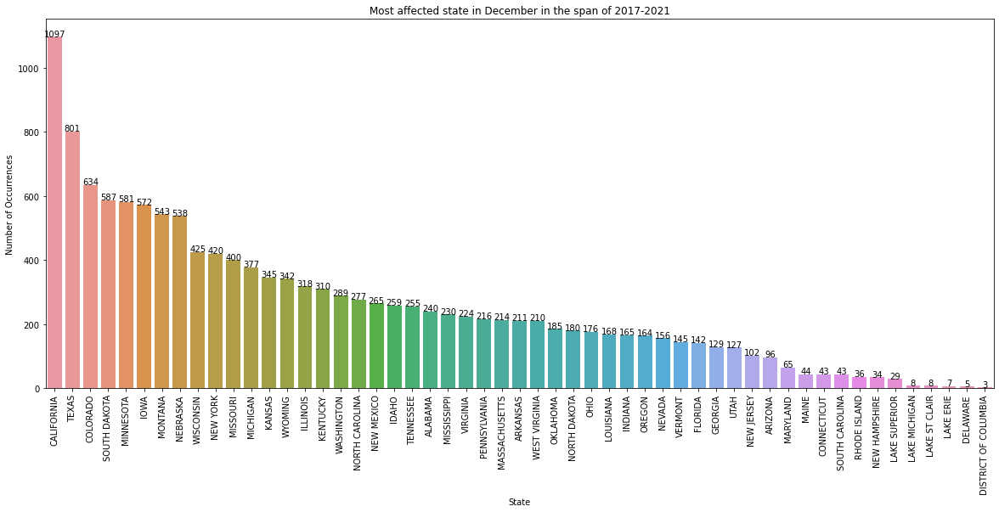

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df[df["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state in {month} in the span of 2017-2021")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
    
# The plot below represents California was the most affected state for Januaray(2017-2021) where 1821 event occured. Likewise

# Analysis for indivisual years
# 2017

In [100]:
df_2017 = df[df["YEAR"]==2017]

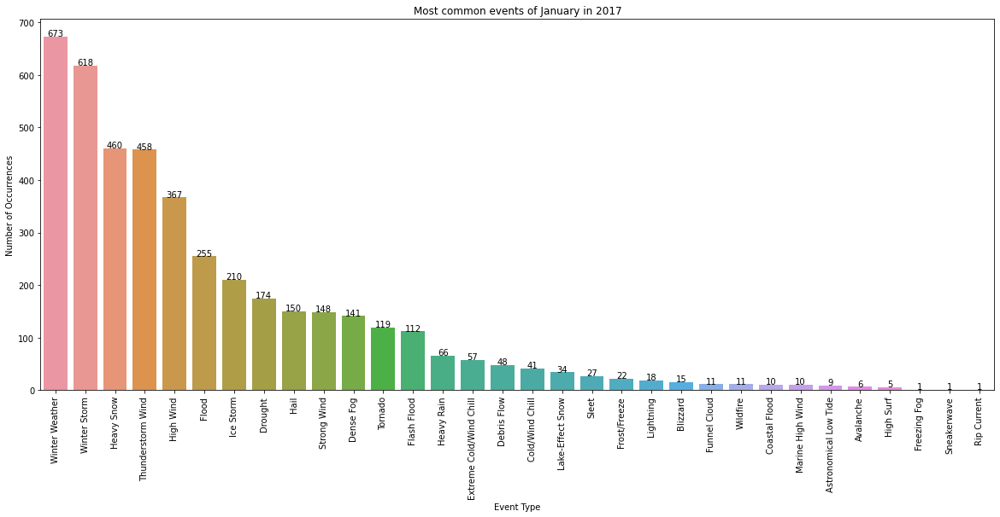

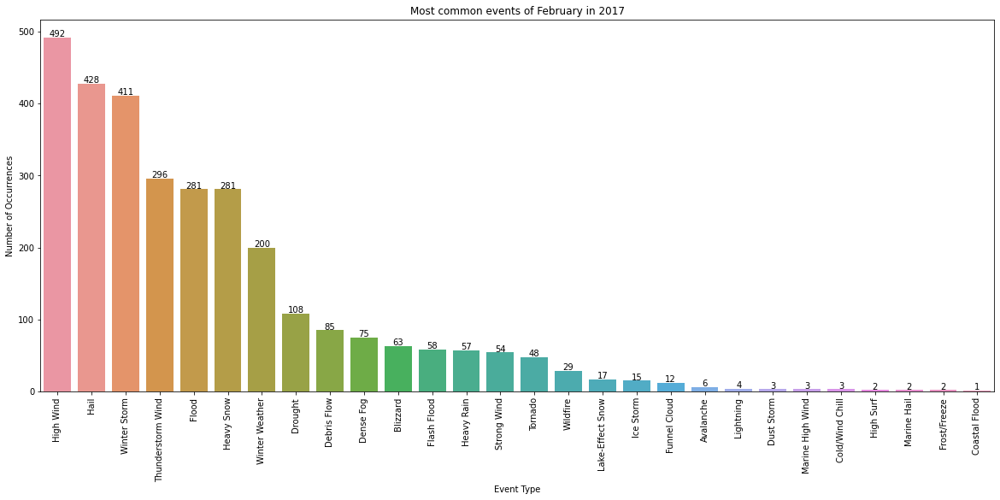

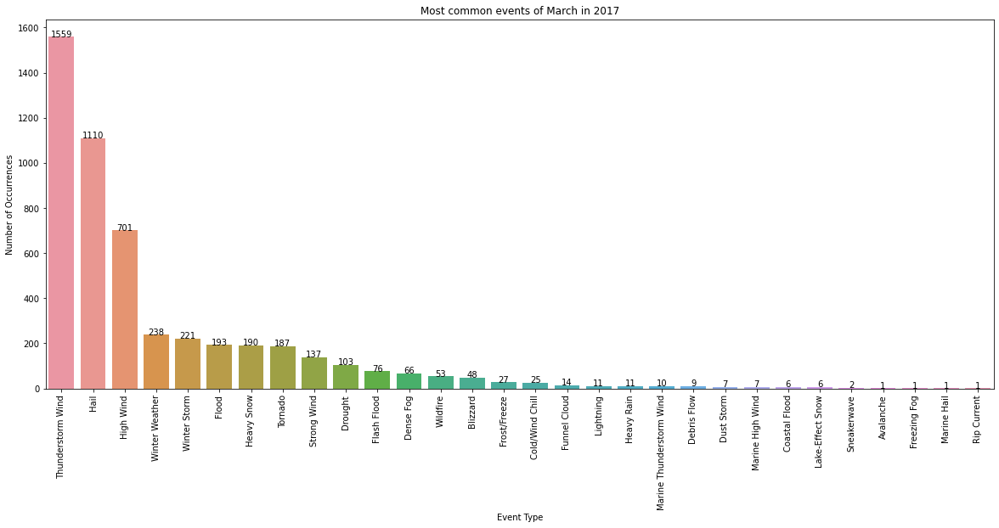

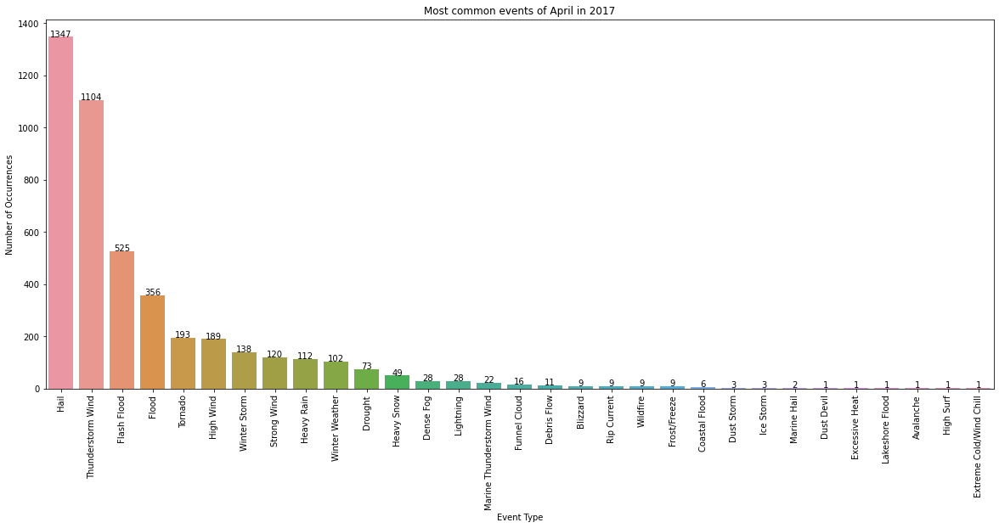

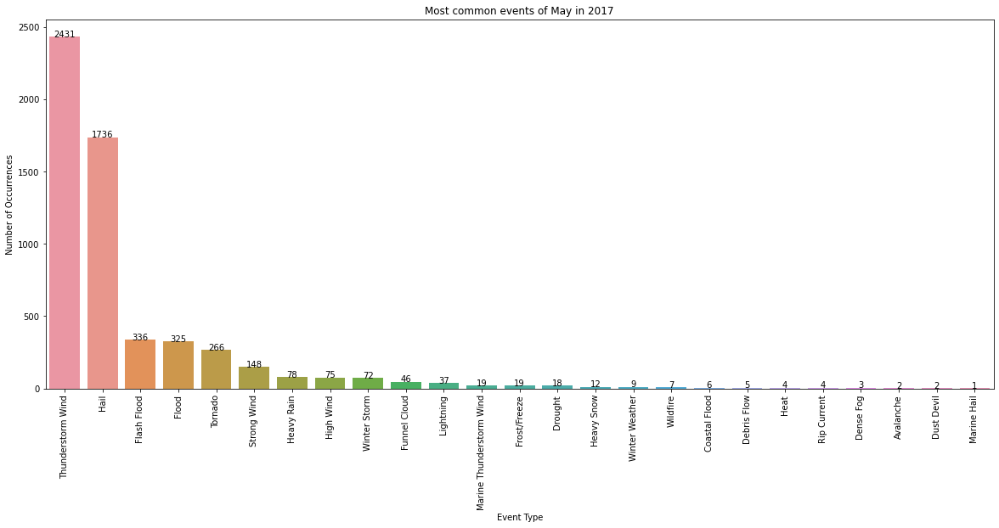

...

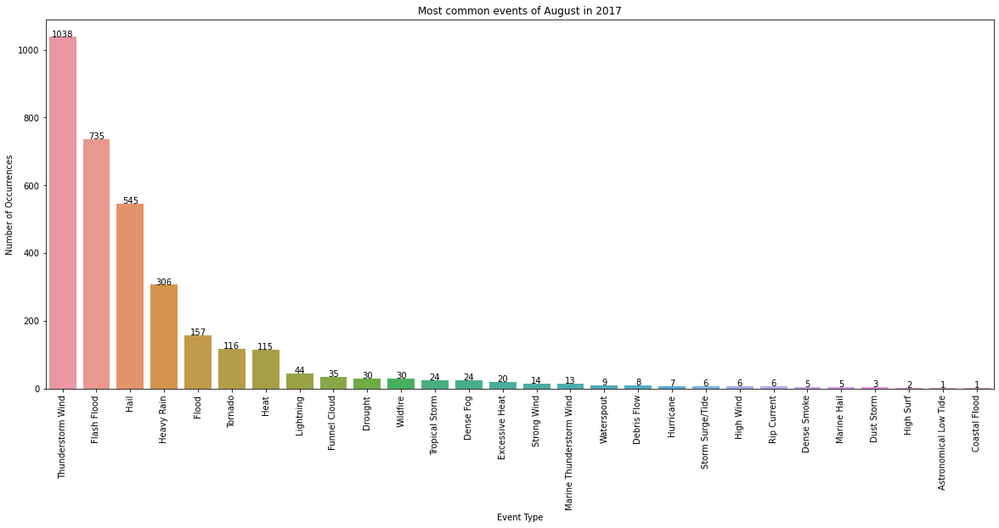

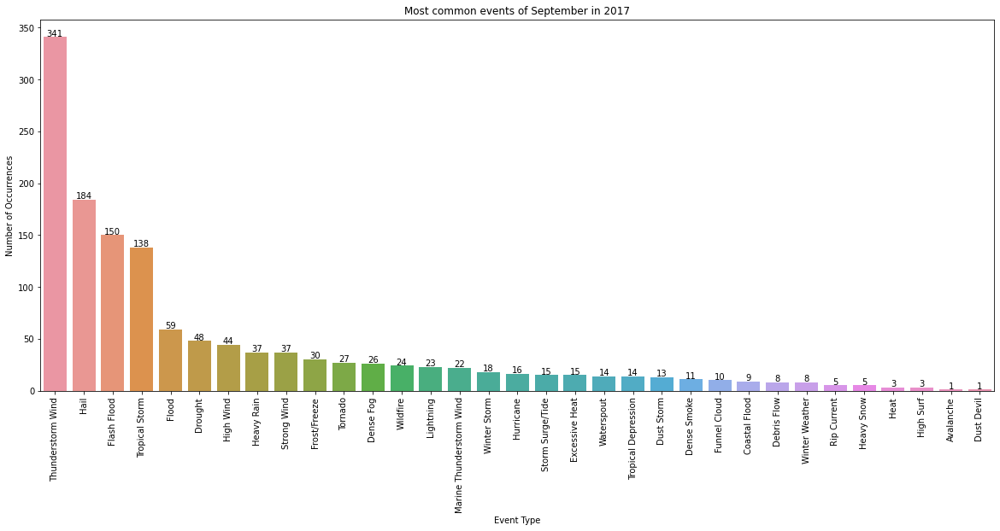

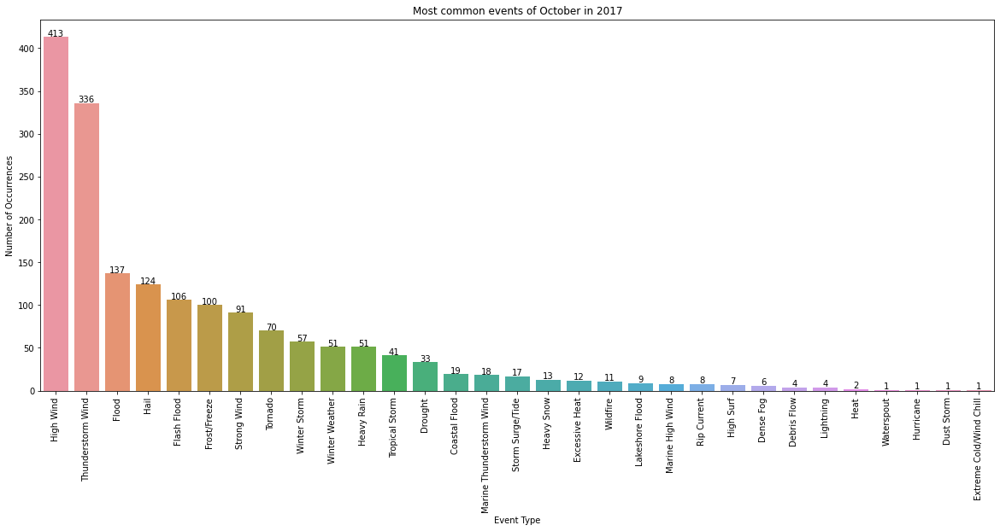

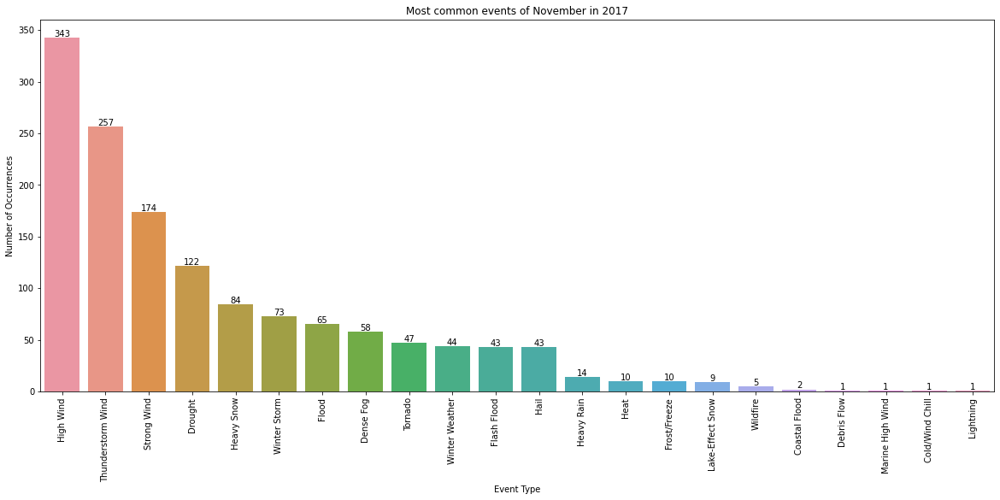

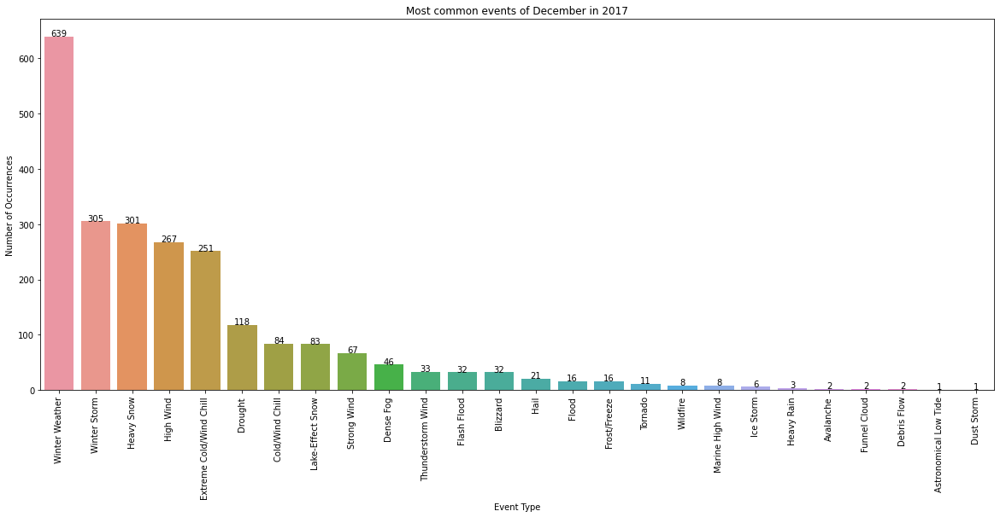

In [101]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2017[df_2017["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in 2017")
    plt.xlabel("Event Type")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")

    plt.show()
# The plot below represents Winter Weather occured 673 in Jan 2017 and so on. Likewise others

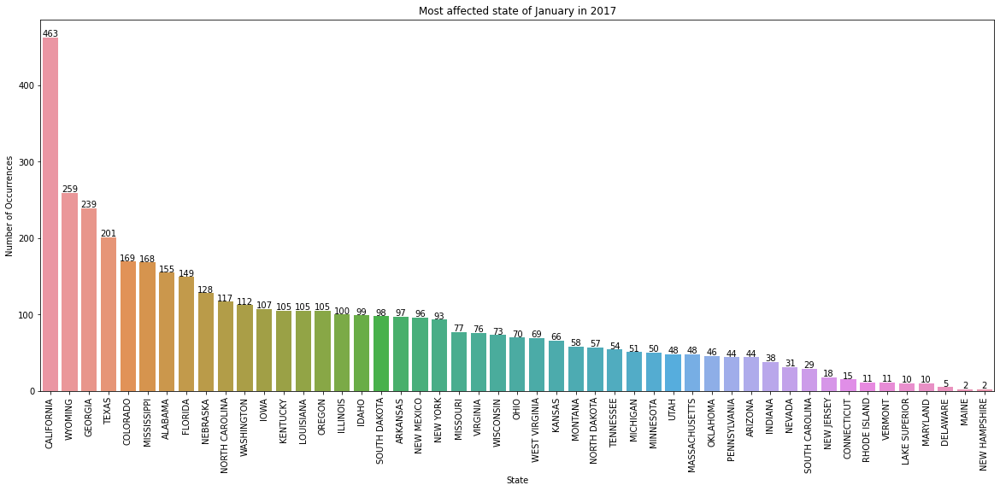

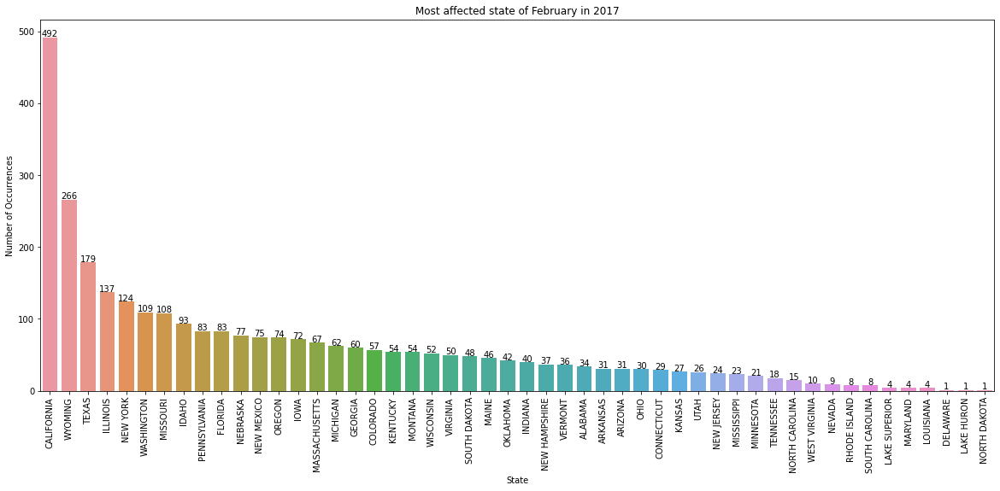

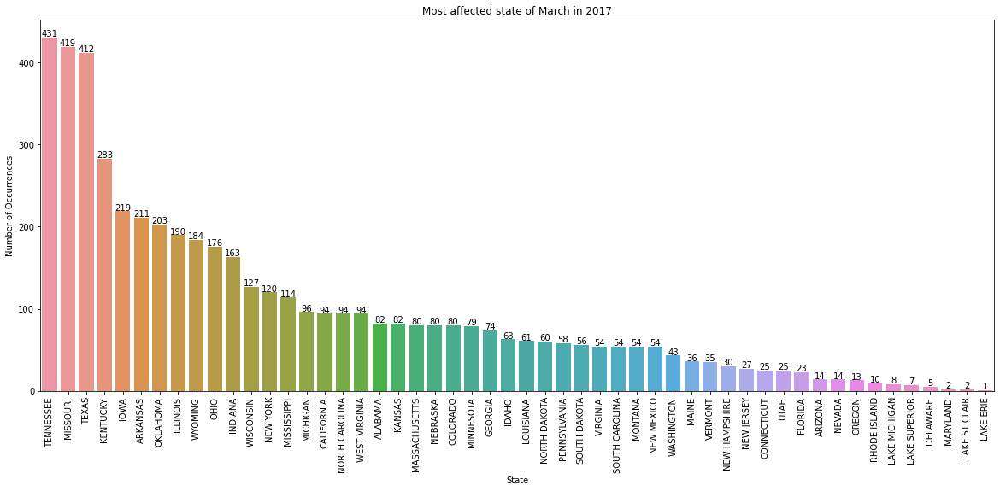

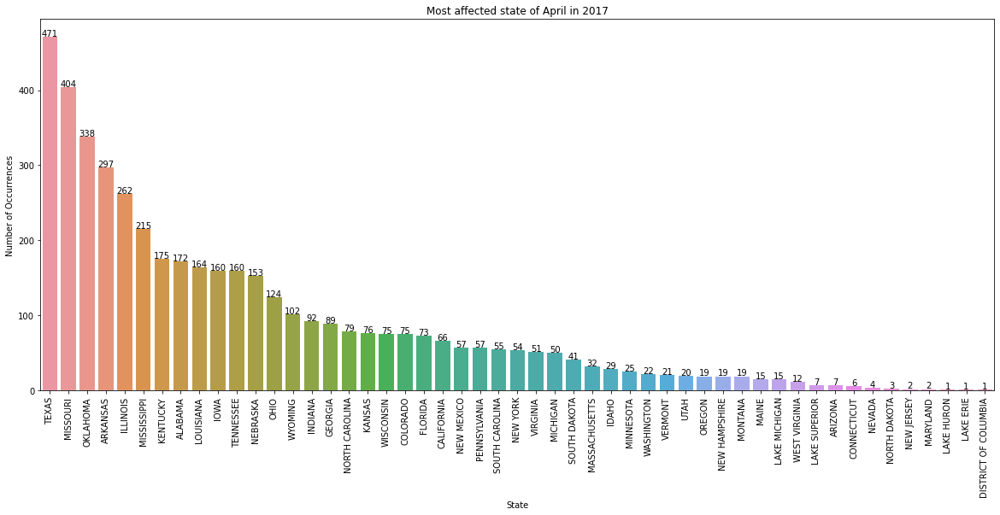

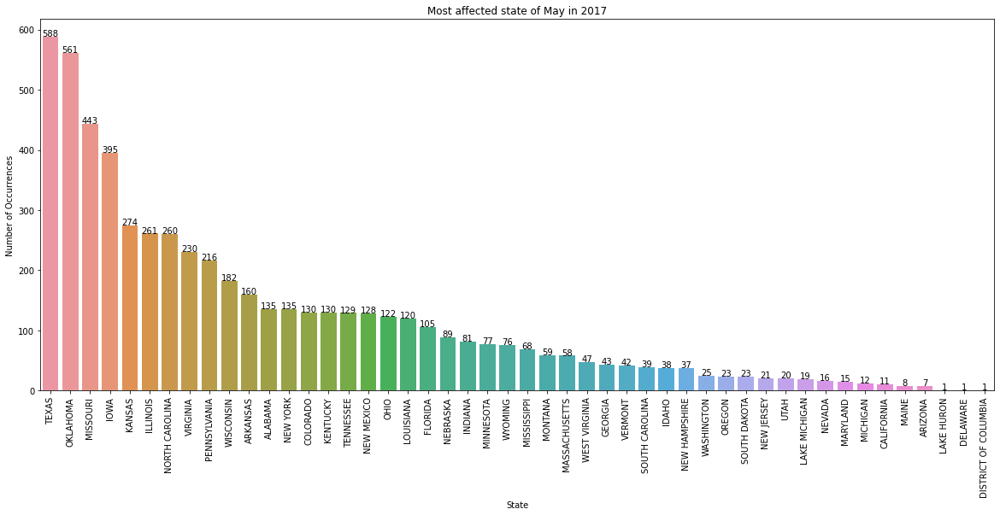

...

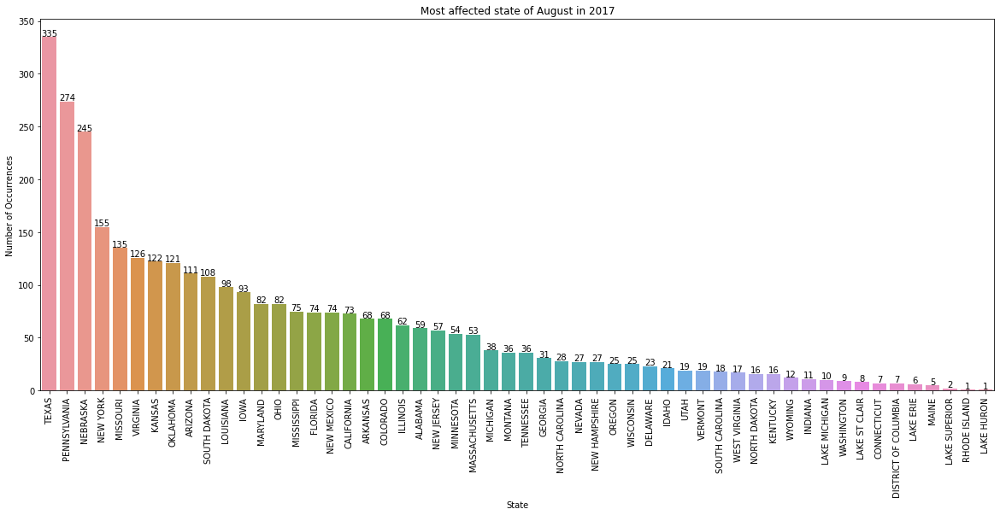

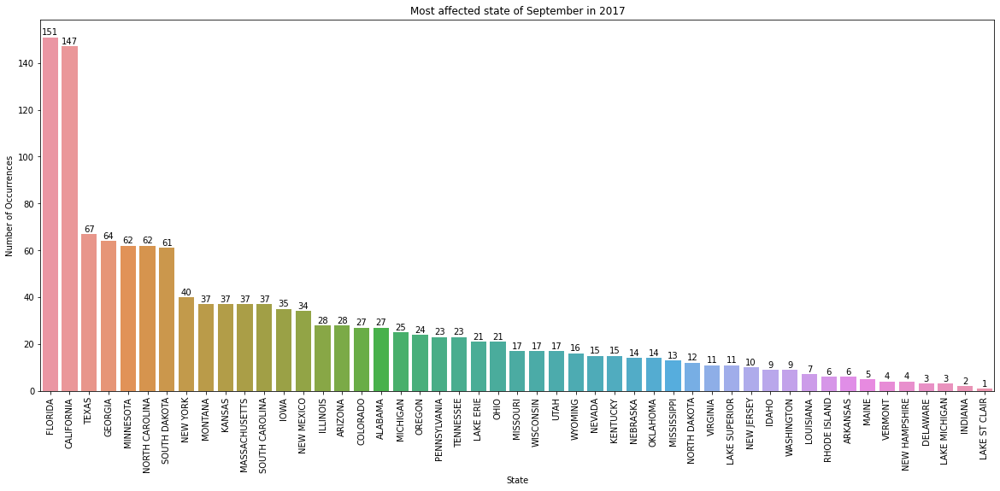

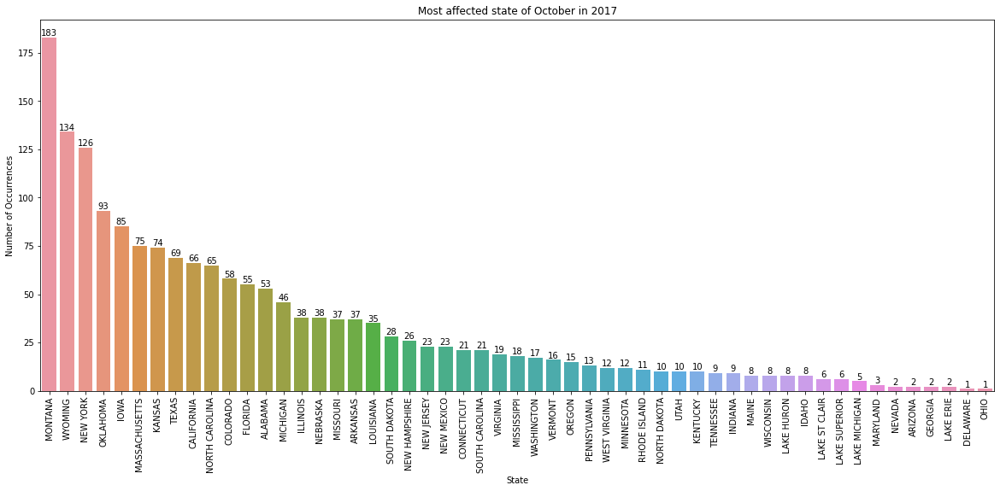

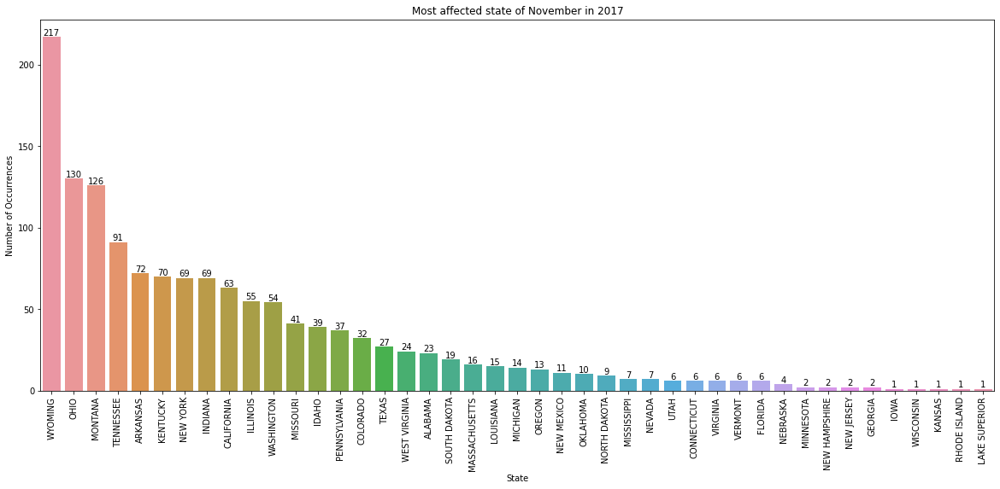

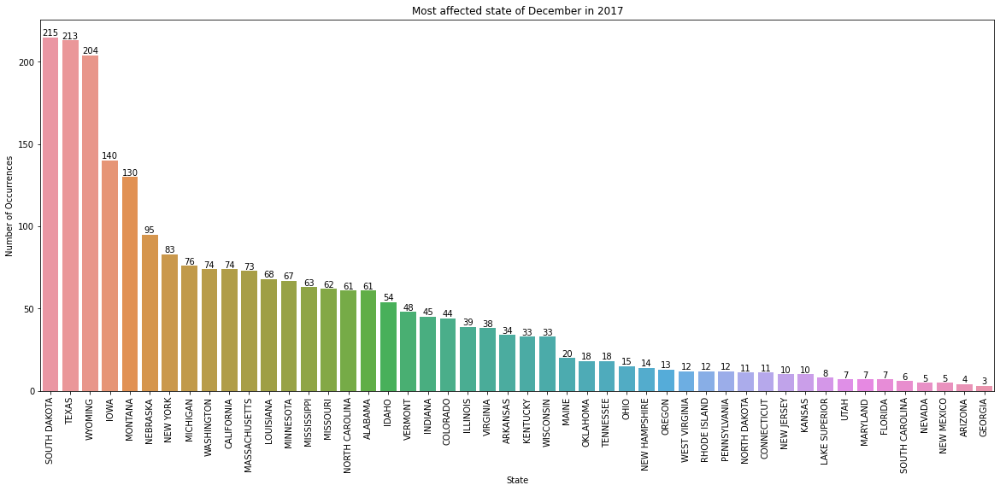

In [102]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2017[df_2017["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state of {month} in 2017")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below shows that california was affected 463 times in Jan 2017 and son on. Like wise others

# 2018

In [103]:
df_2018 = df[df["YEAR"]==2018]

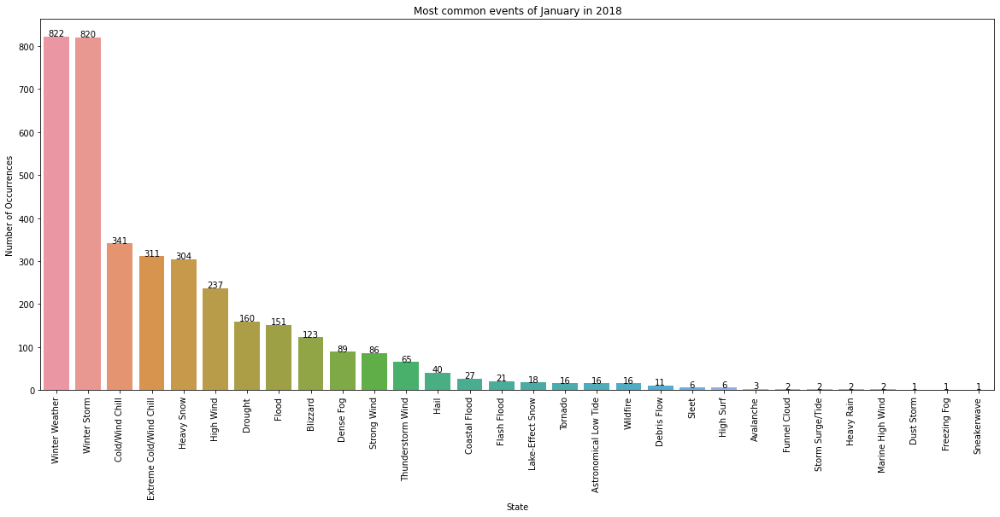

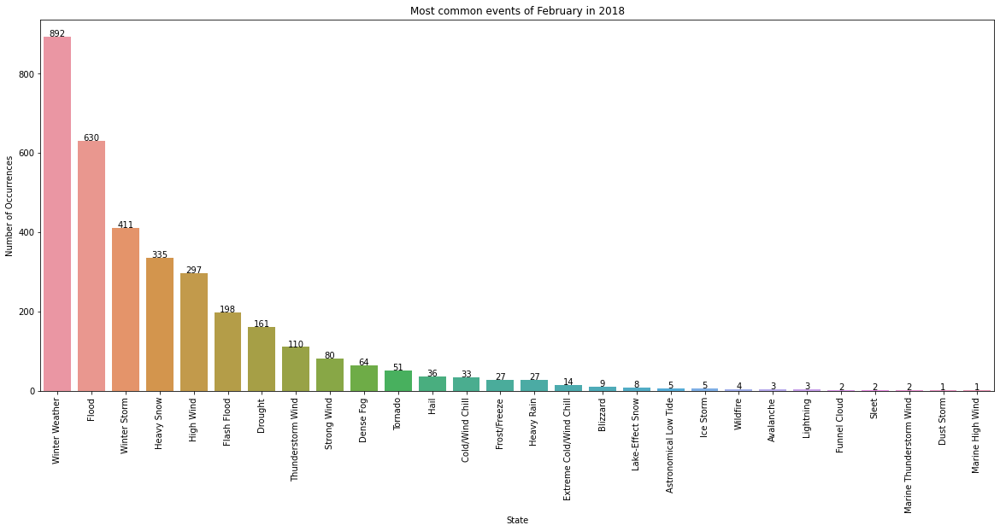

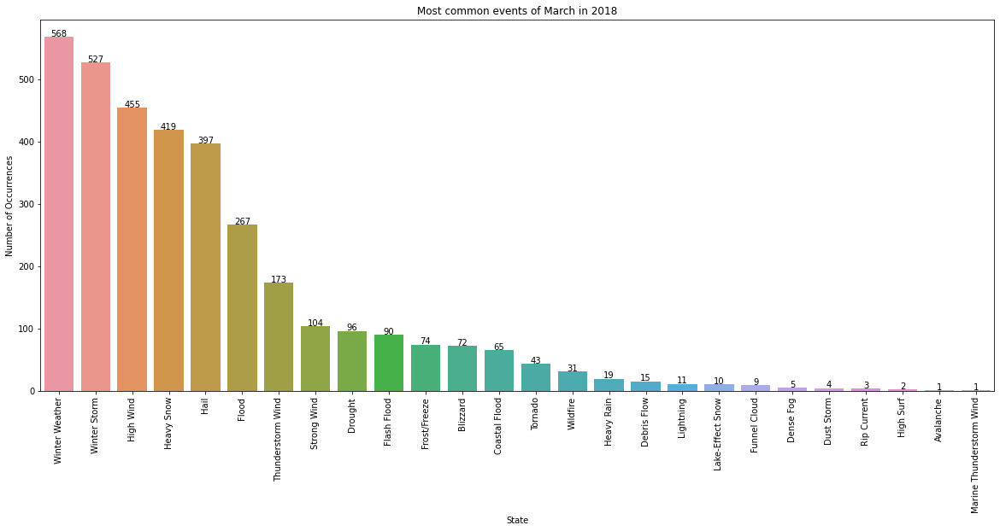

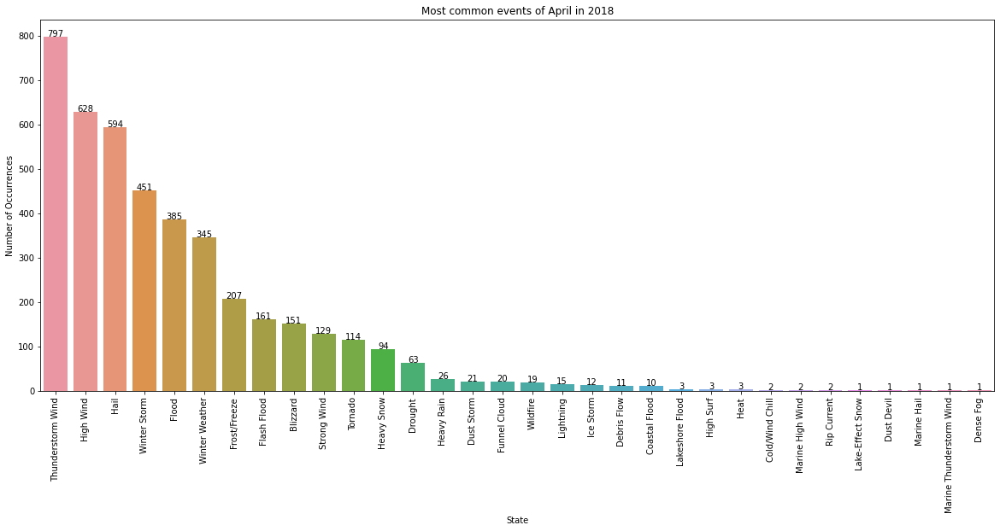

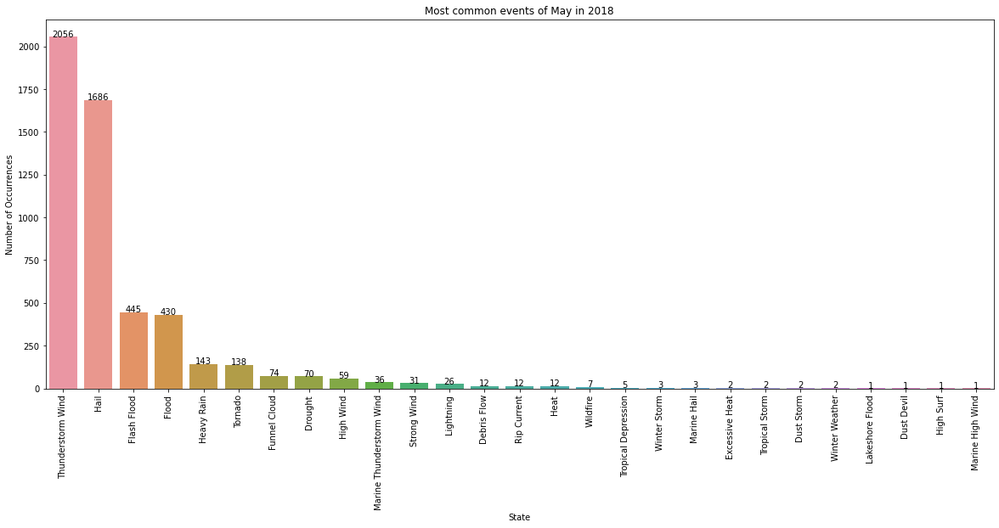

...

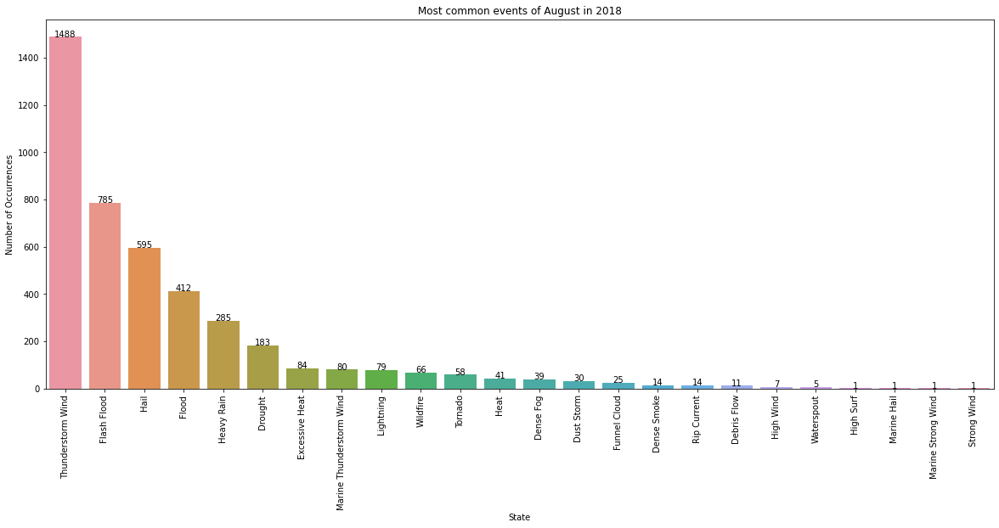

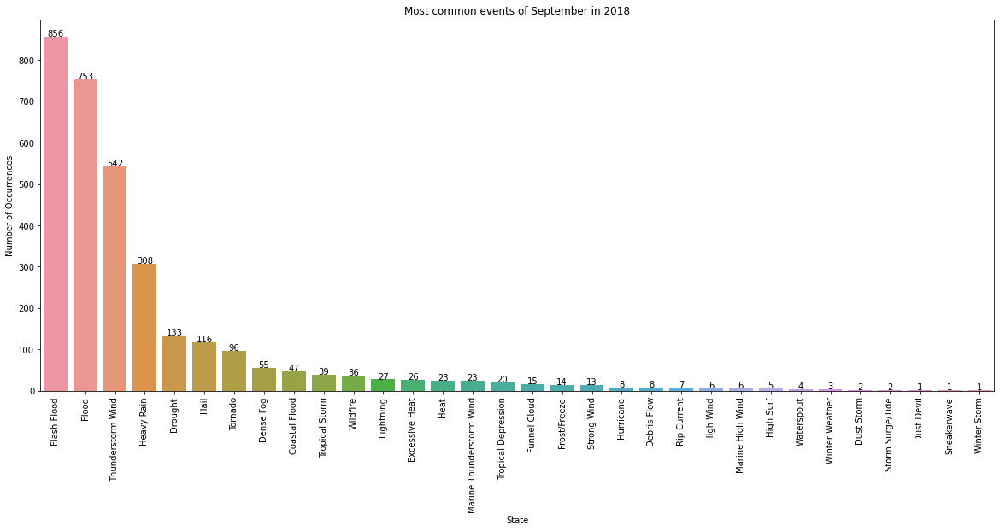

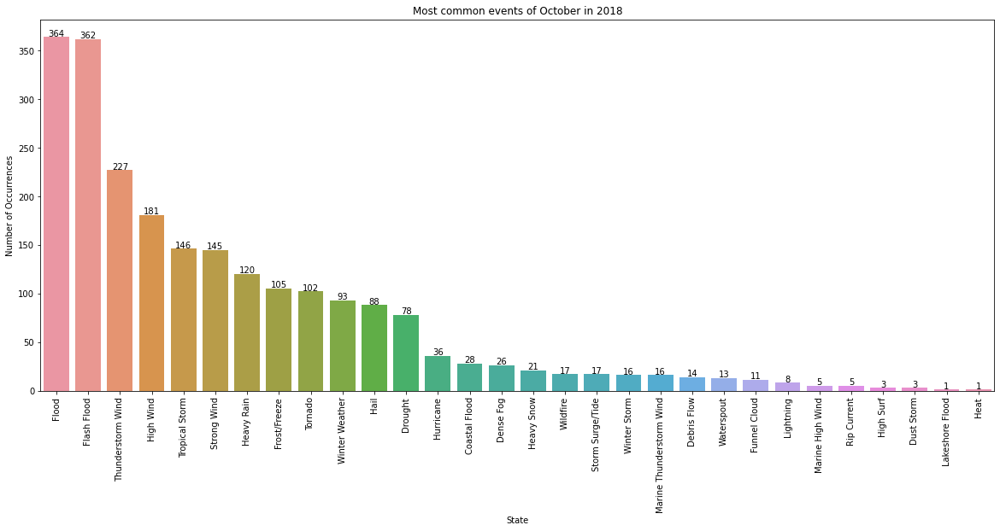

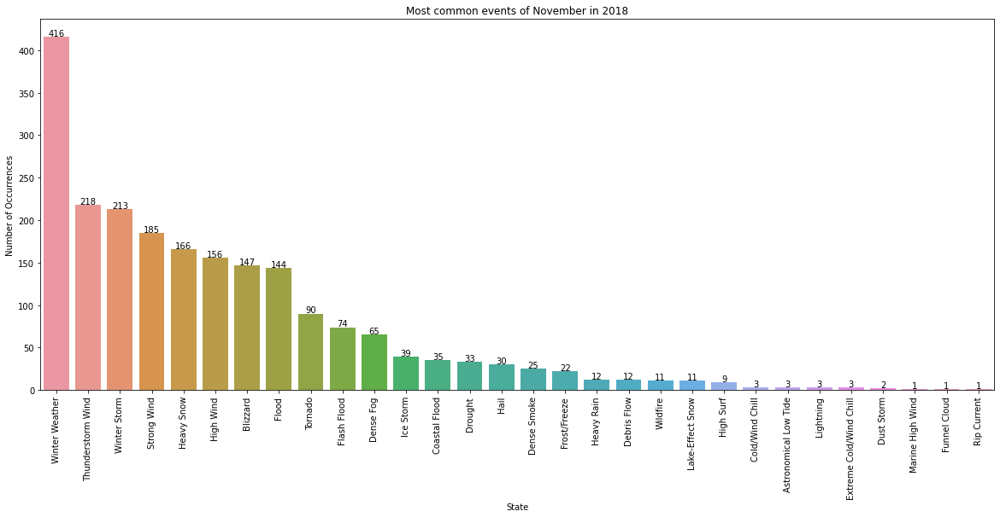

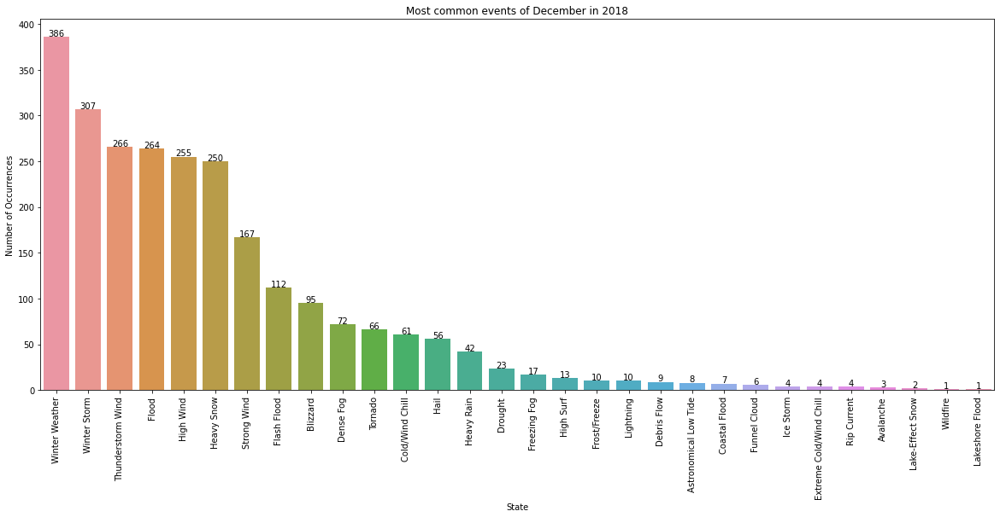

In [104]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2018[df_2018["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in 2018")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below represents Winter Weather occured 822 times in Jan 2018 and so on. Likewise others

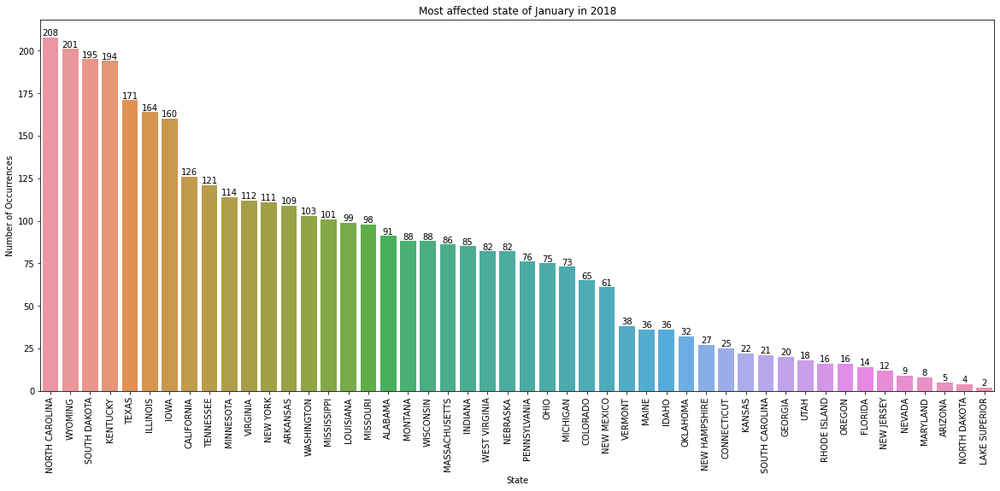

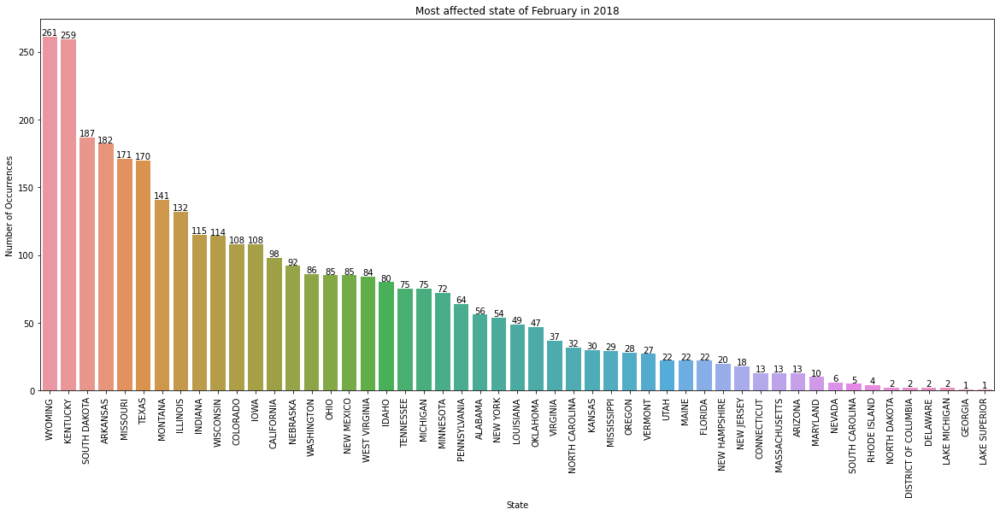

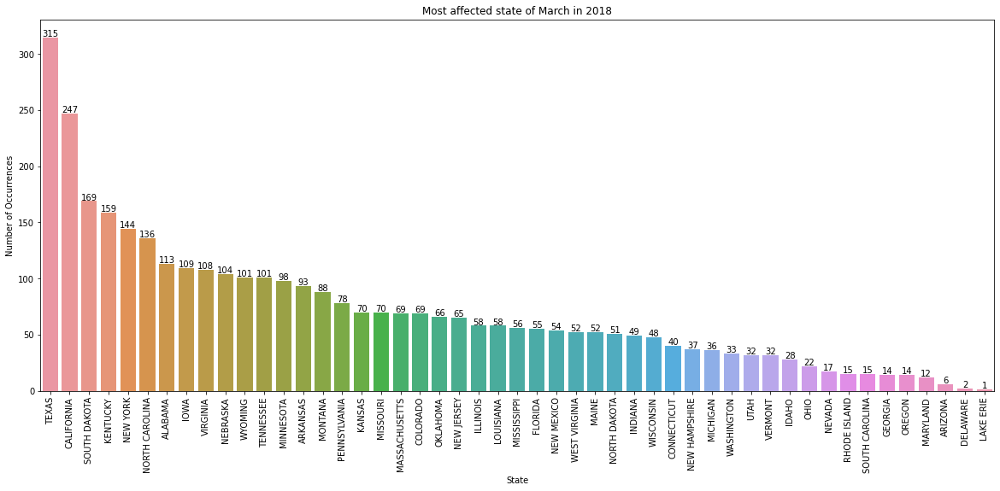

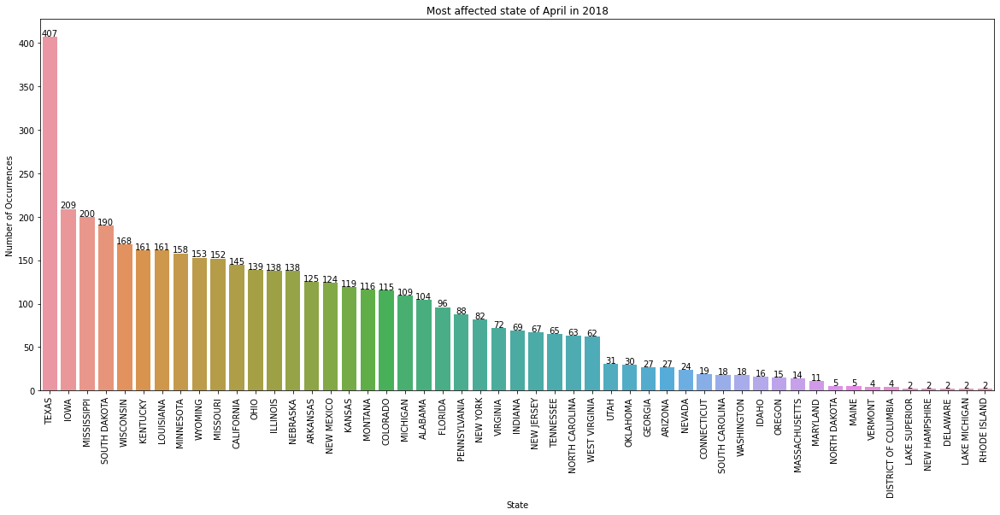

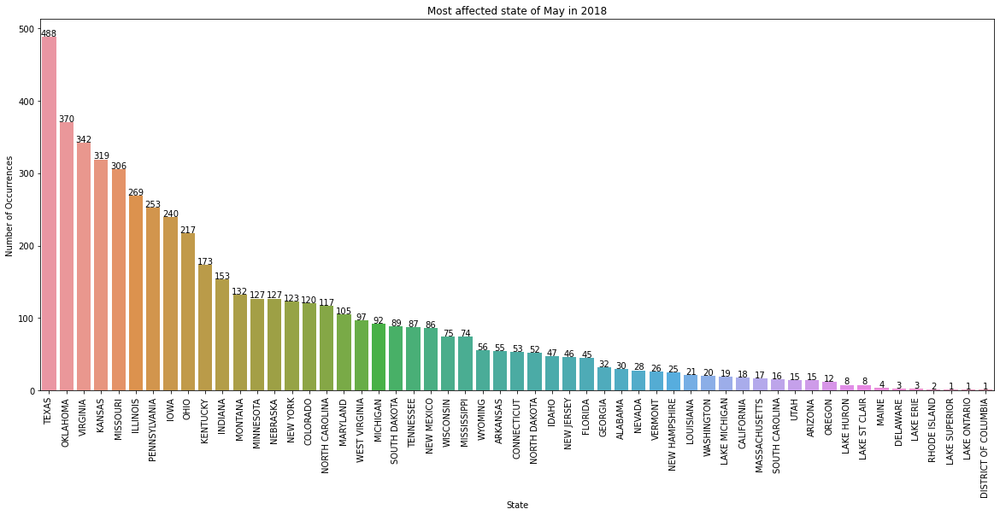

...

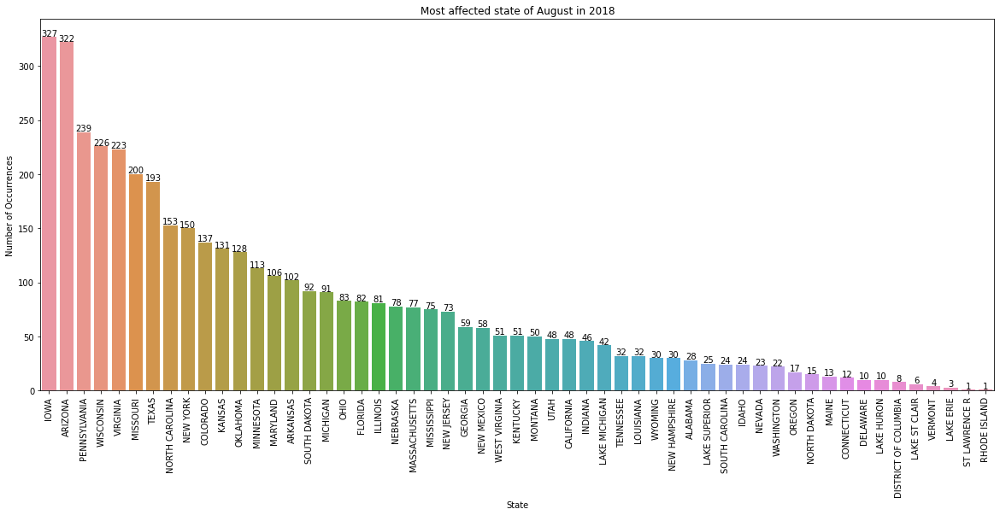

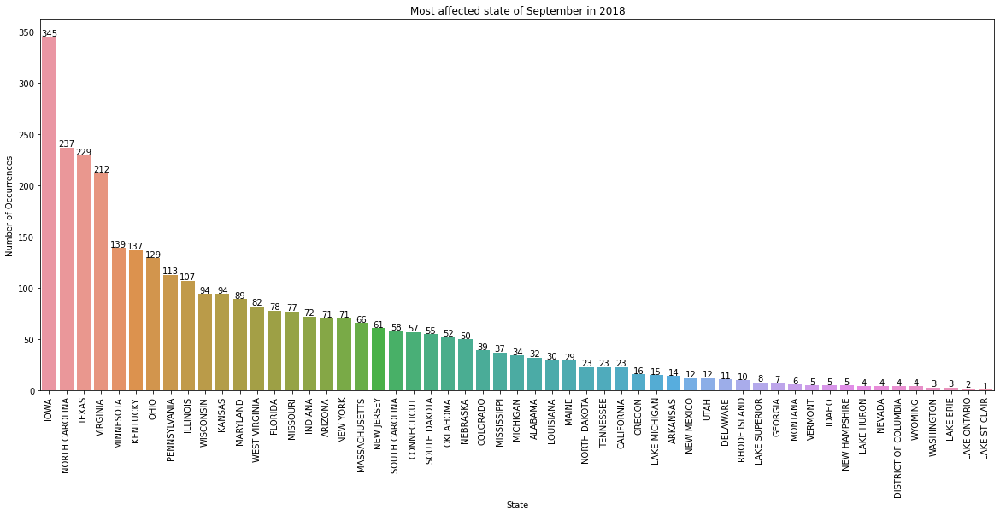

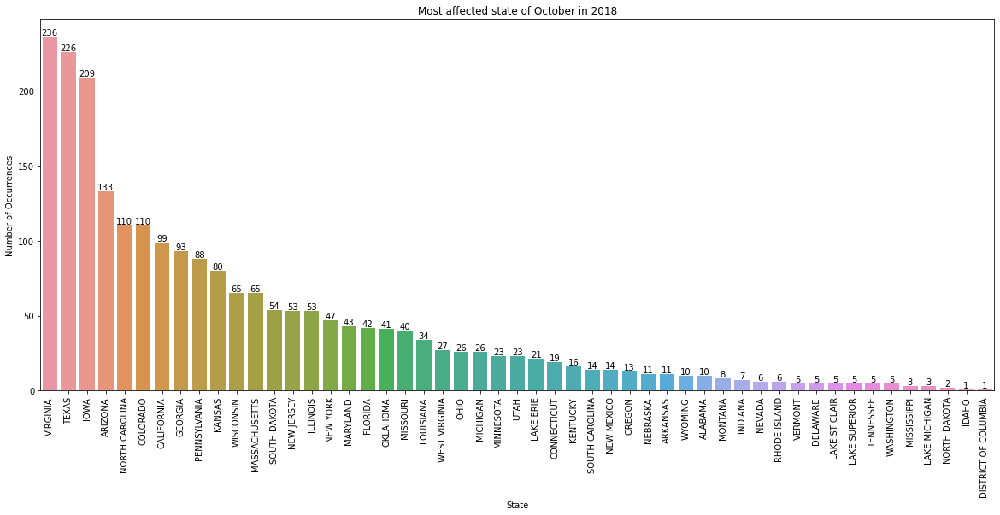

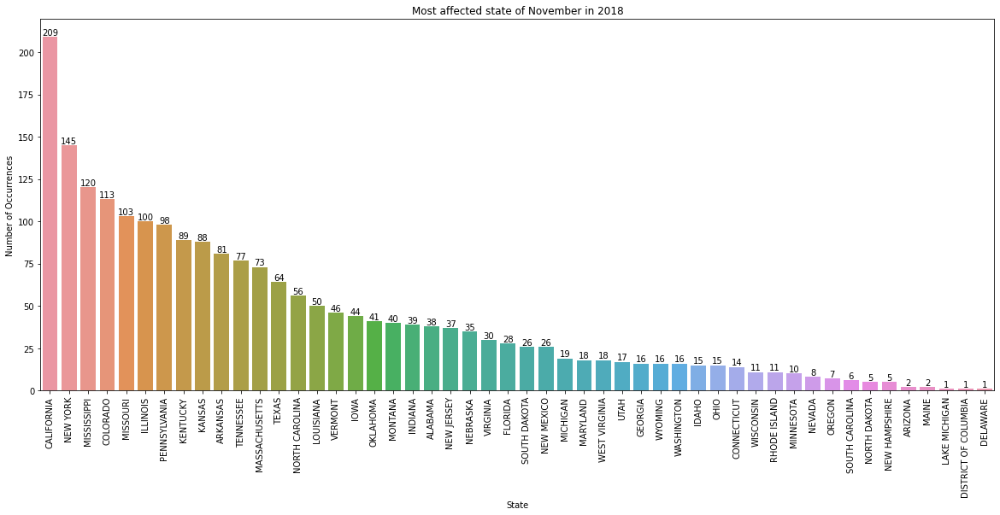

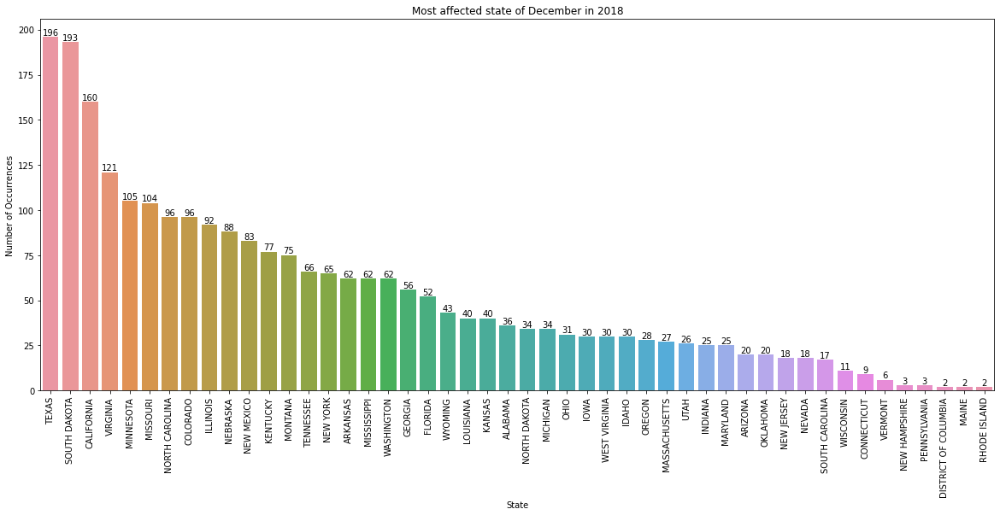

In [105]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2018[df_2018["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state of {month} in 2018")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below shows that north carolina was affected 208 times in Jan 2018 and son on. Like wise others

# 2019

In [106]:
df_2019 = df[df["YEAR"]==2019]

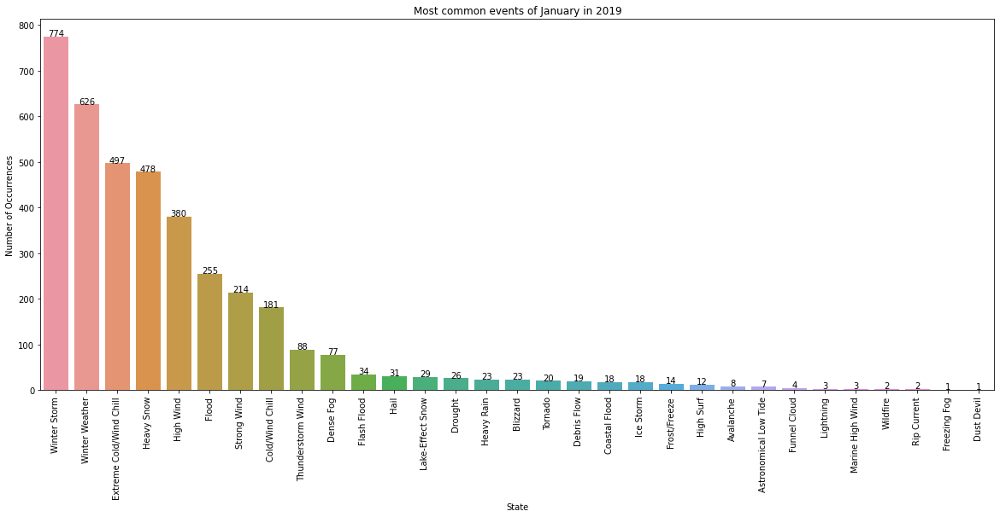

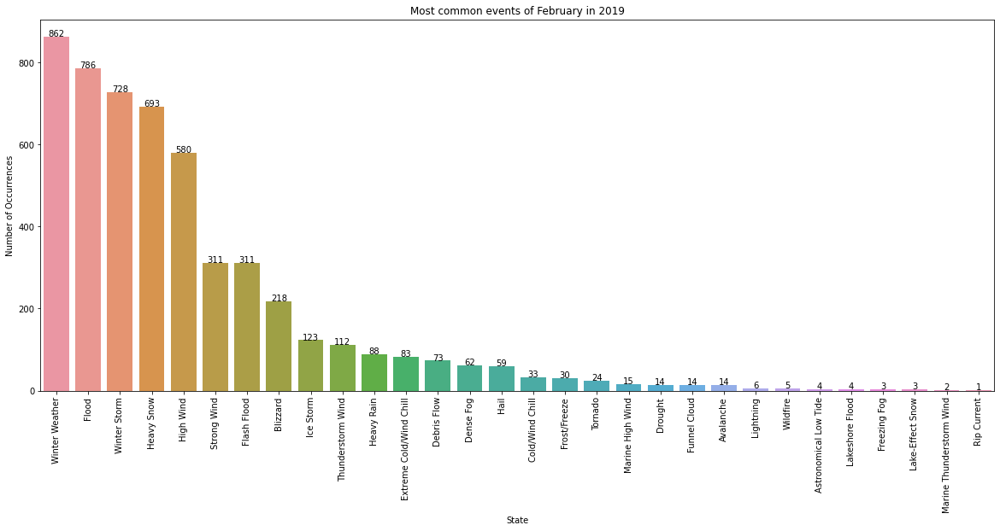

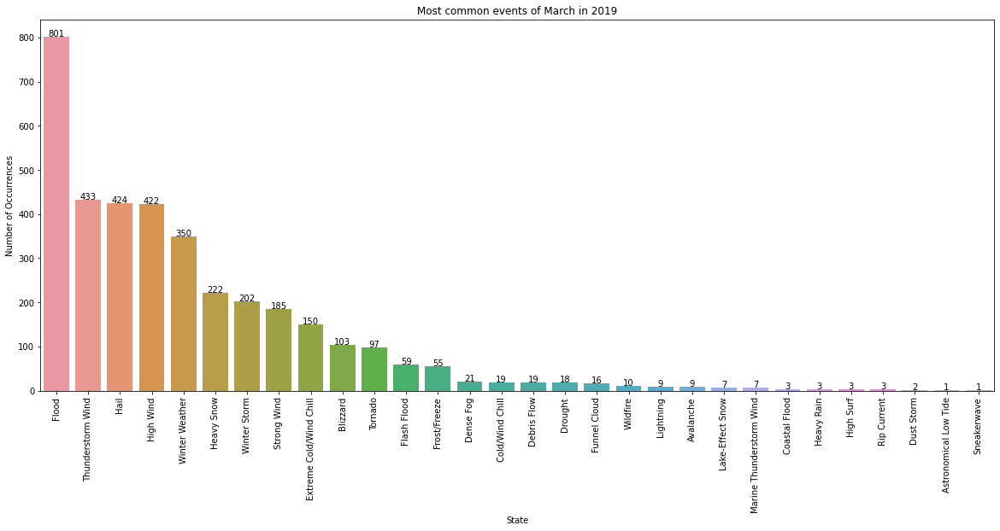

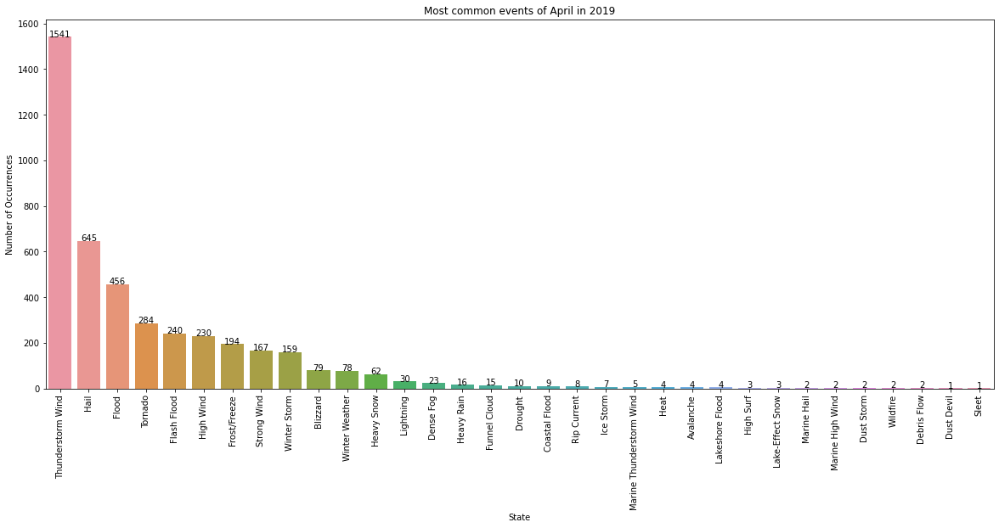

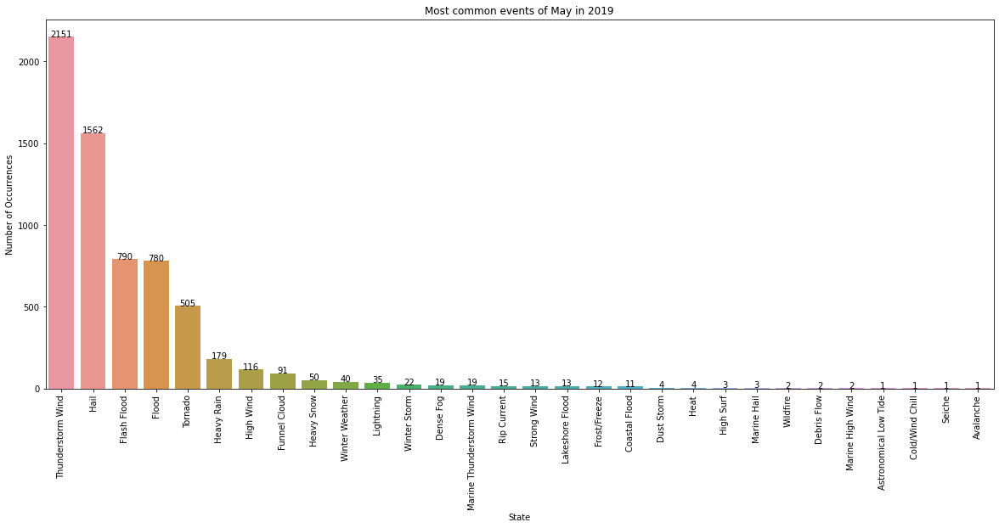

...

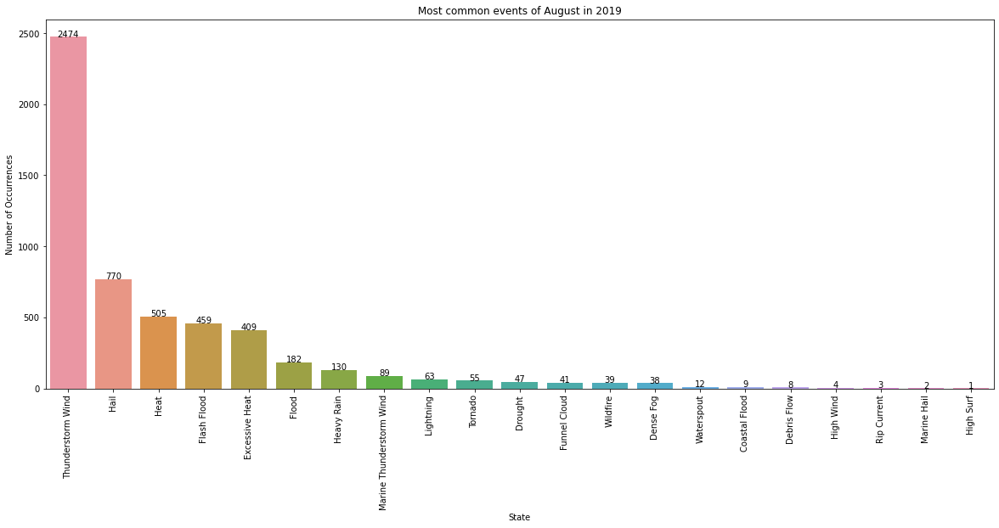

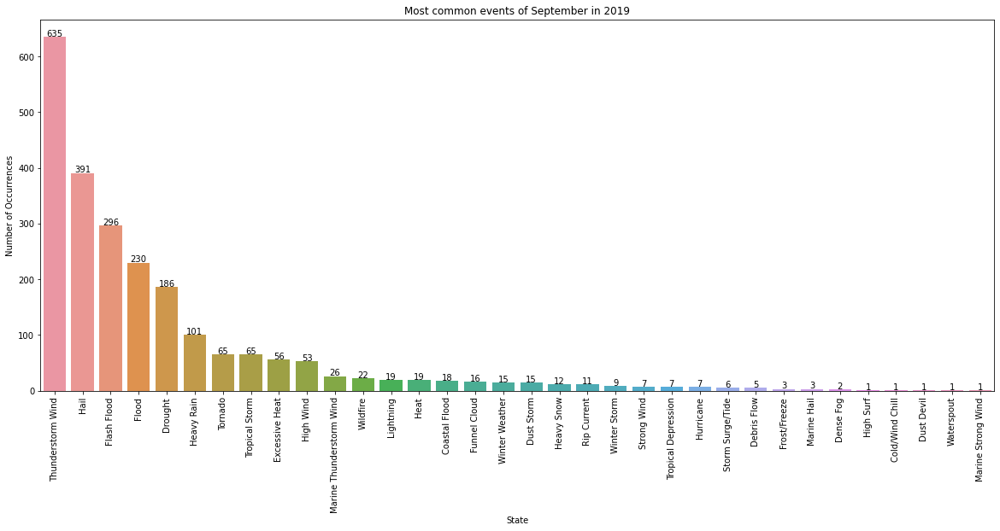

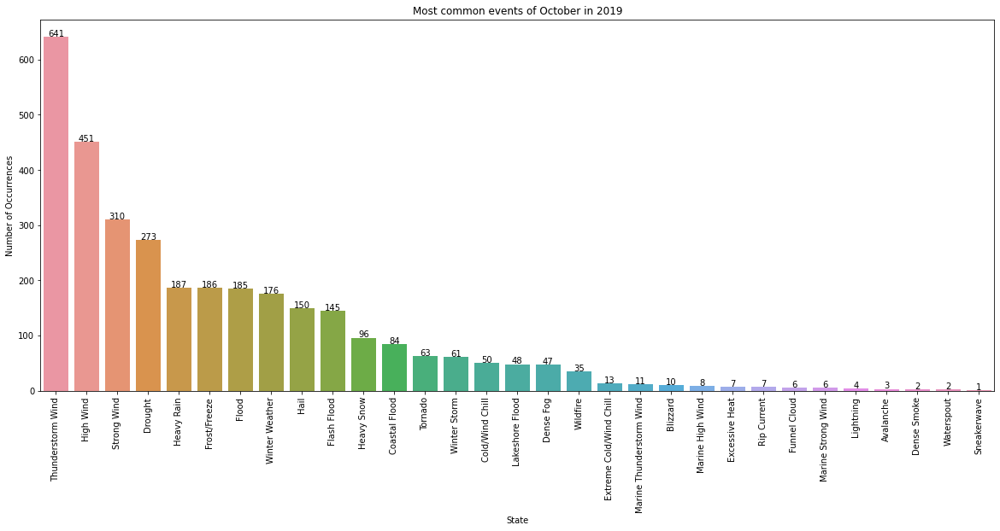

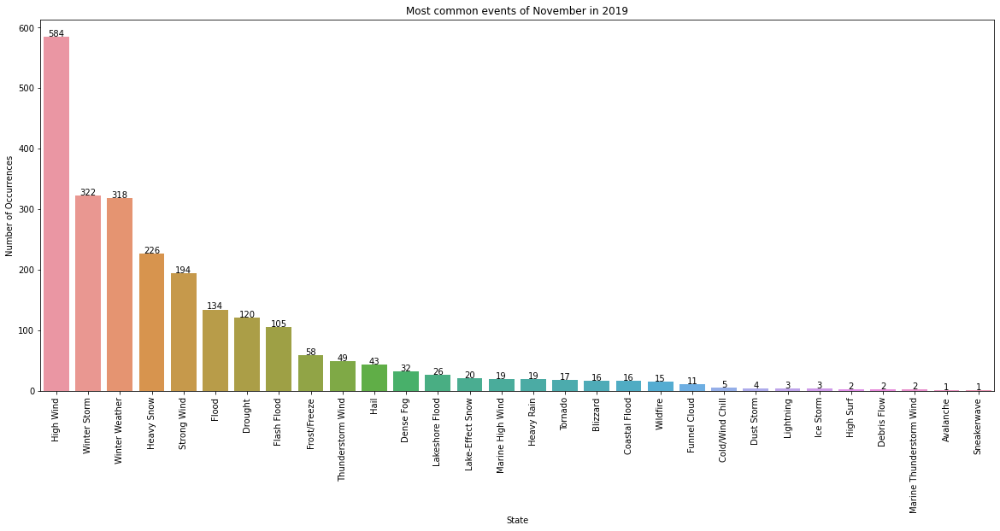

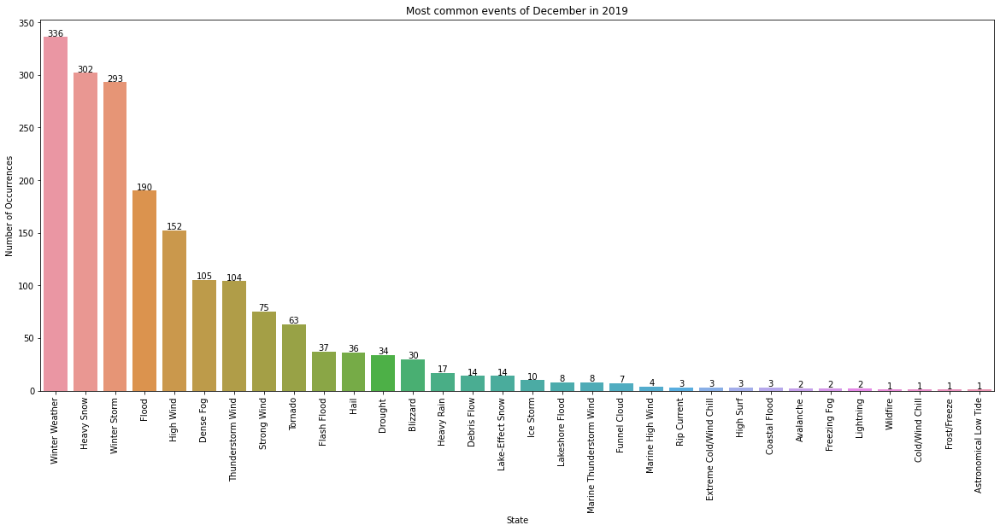

In [107]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2019[df_2019["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in 2019")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below represents Winter Storm occured 774 times in Jan 2019 and so on. Likewise others

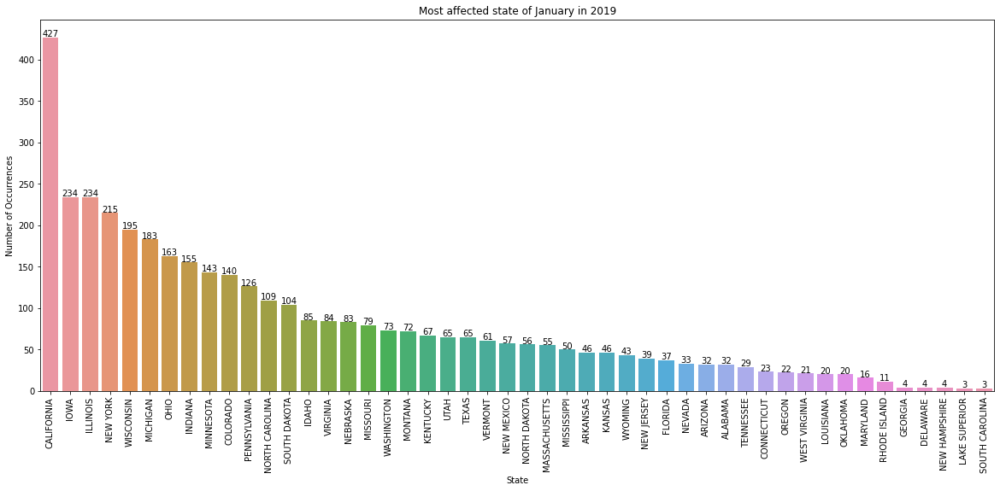

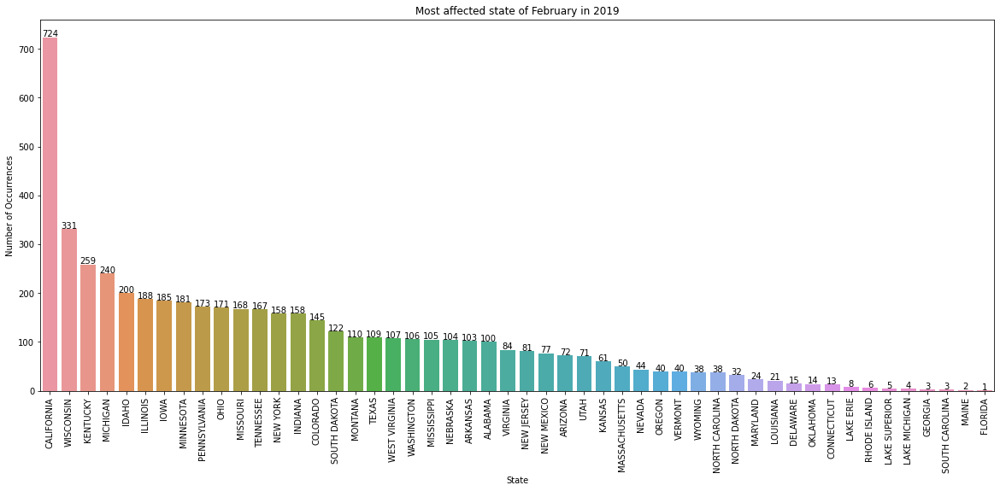

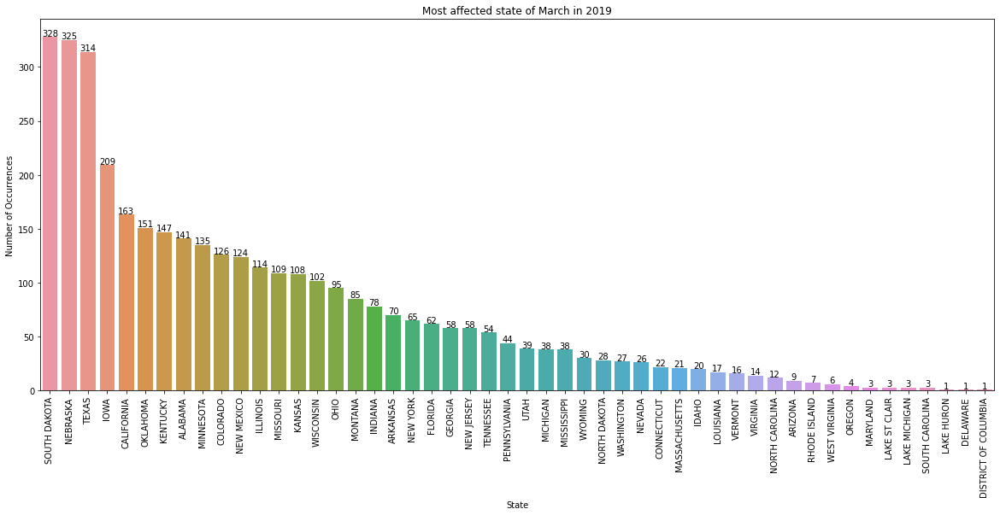

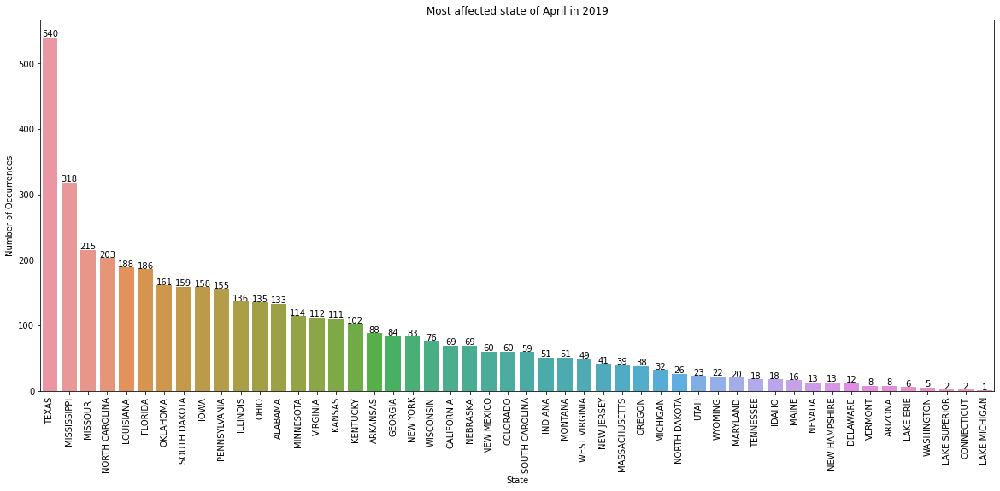

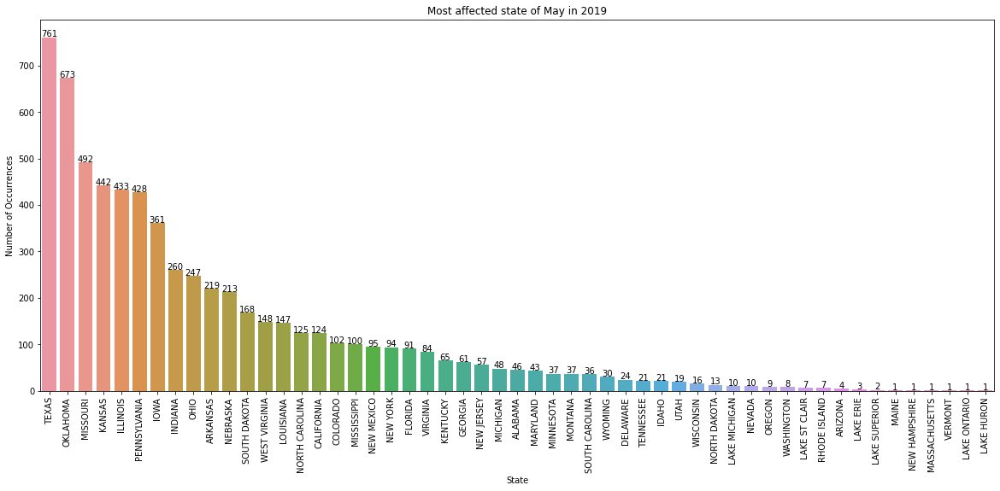

...

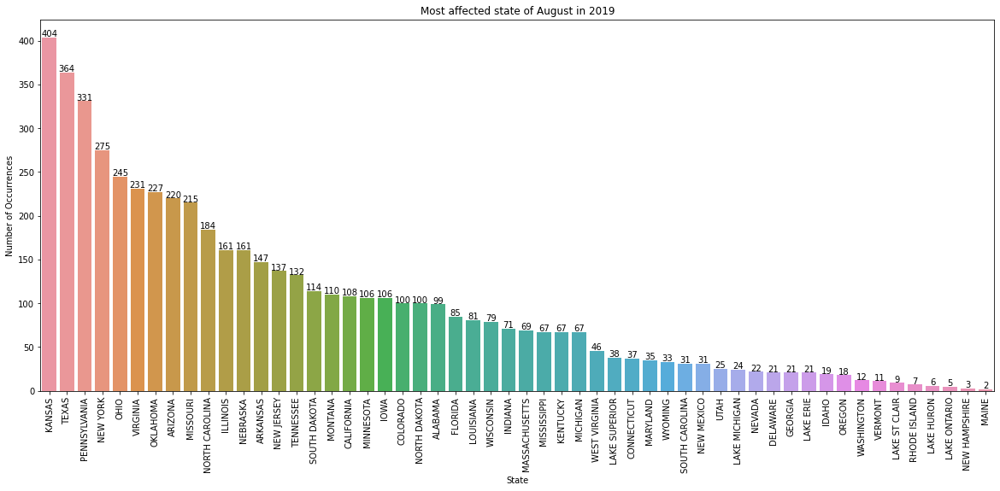

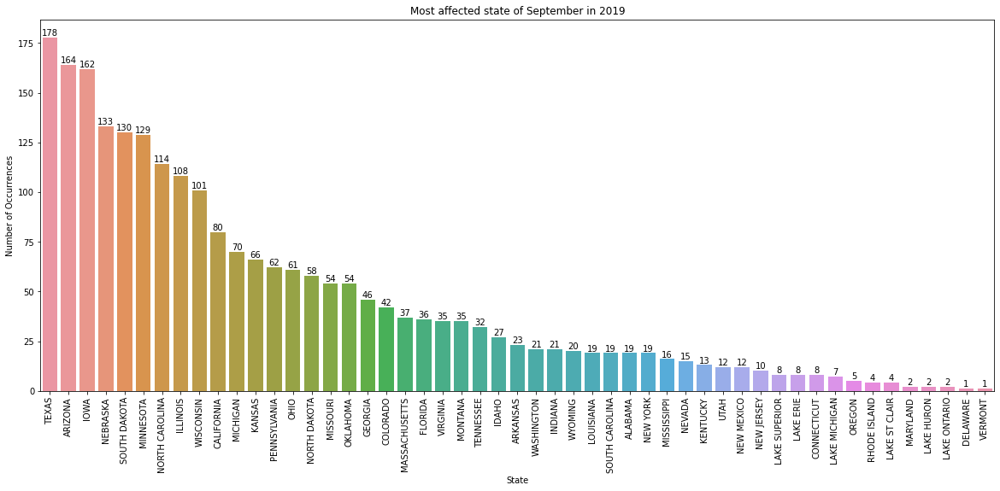

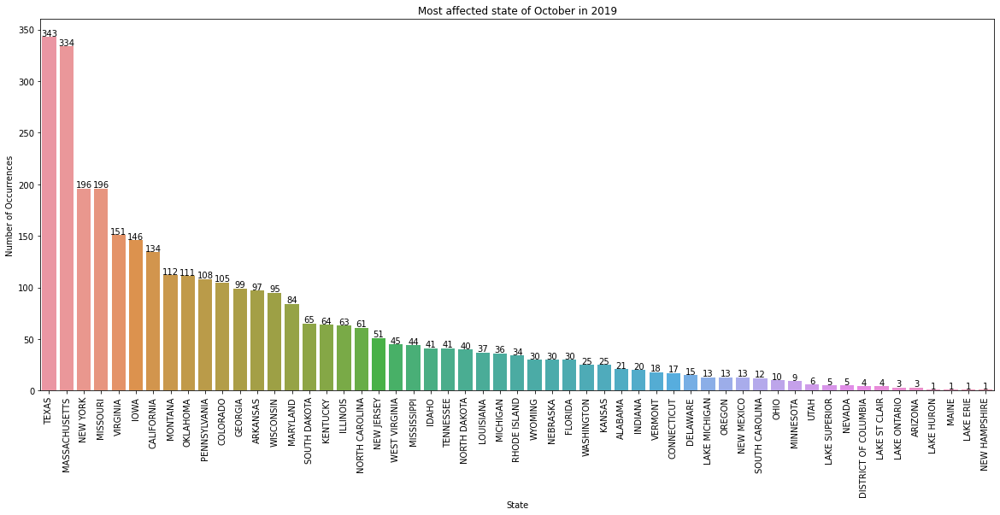

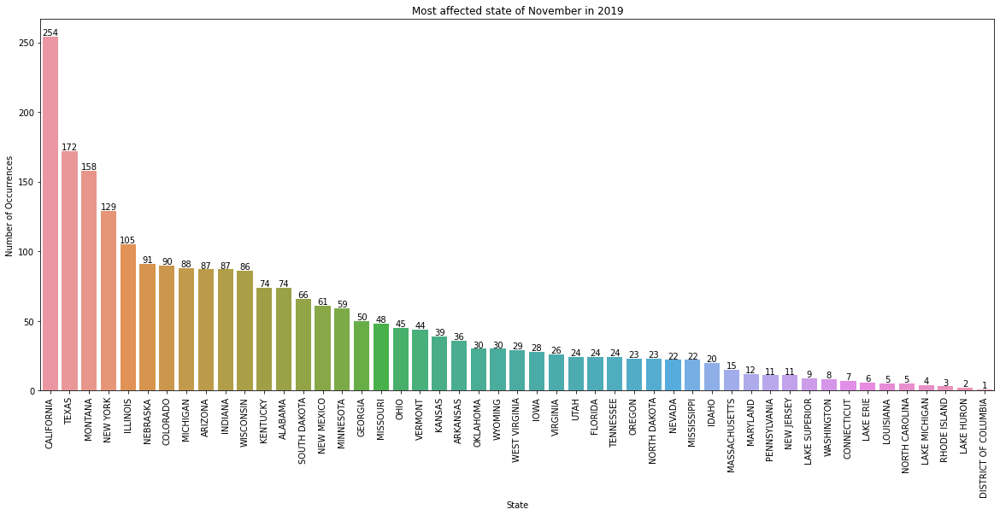

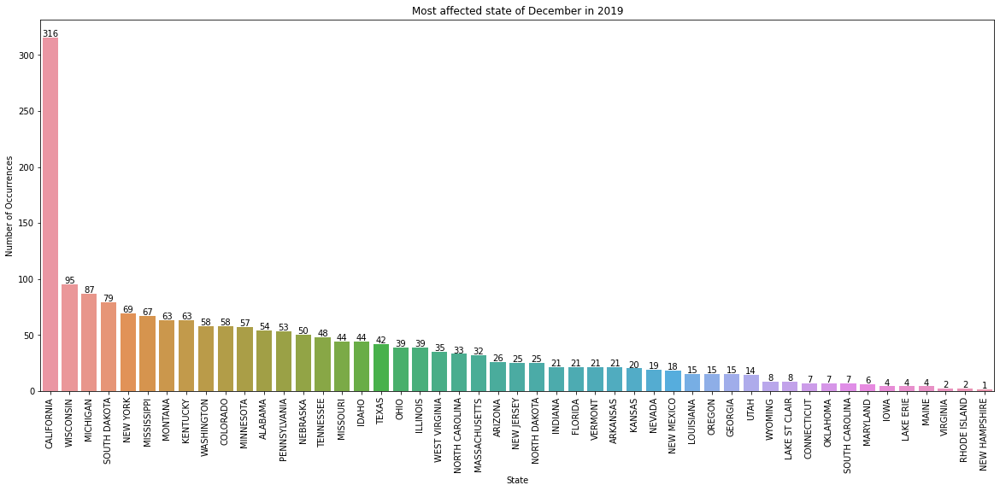

In [108]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2019[df_2019["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state of {month} in 2019")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below shows that California was affected 427 times in Jan 2019 and son on. Like wise others

# 2020

In [109]:
df_2020 = df[df["YEAR"]==2020]

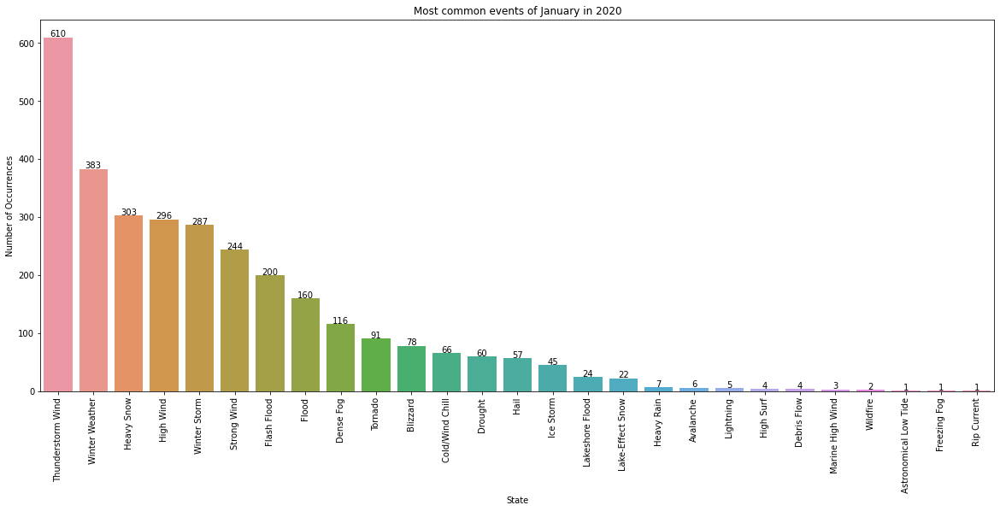

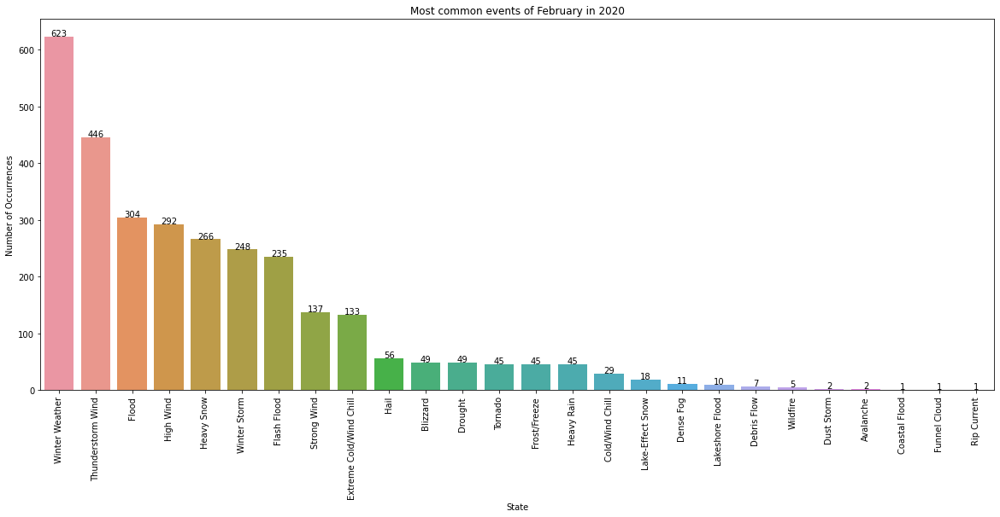

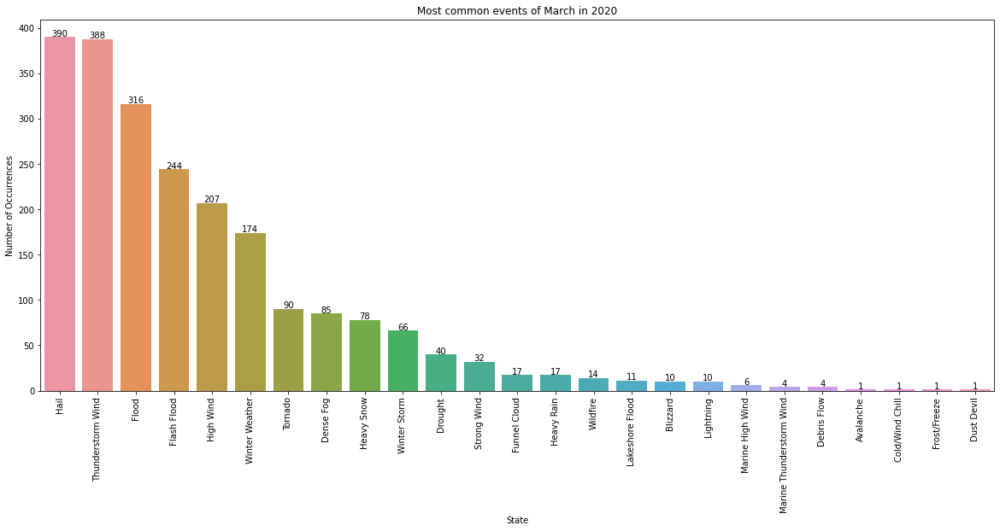

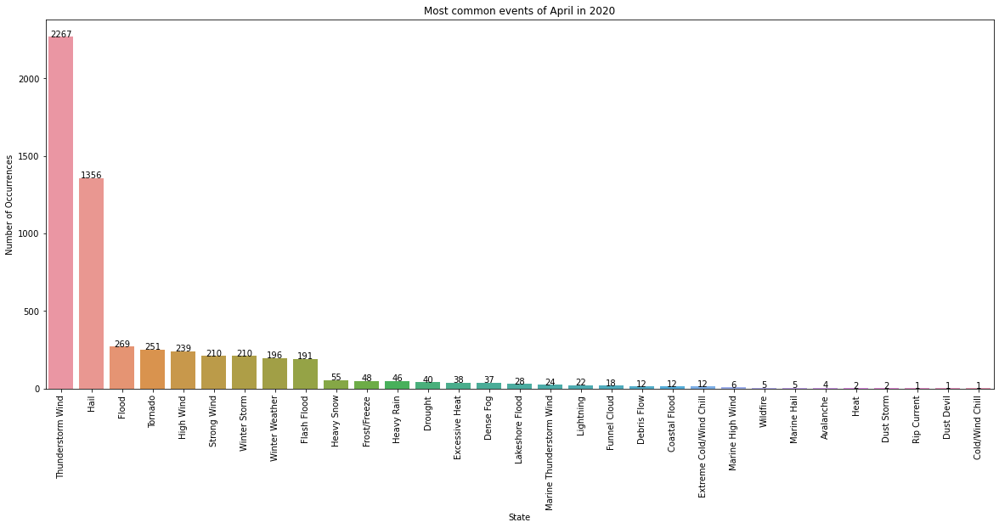

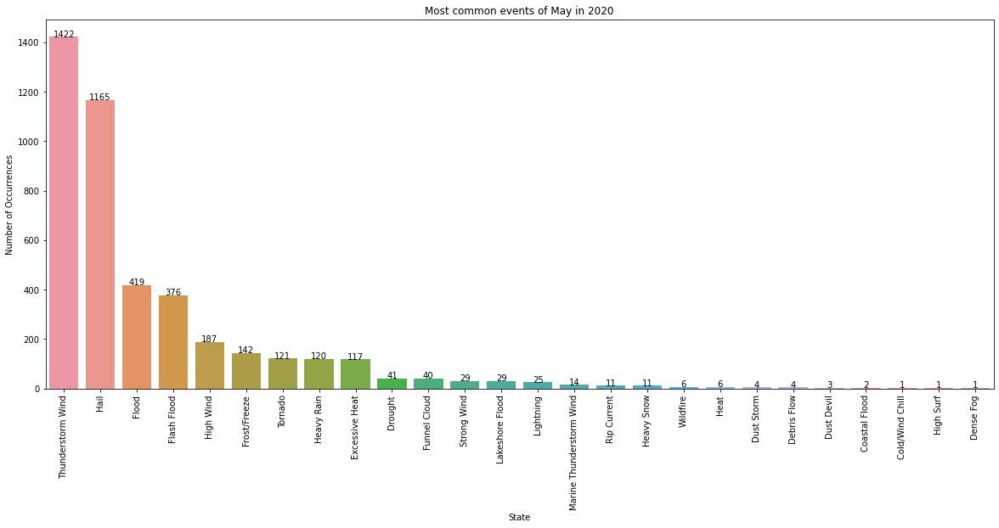

...

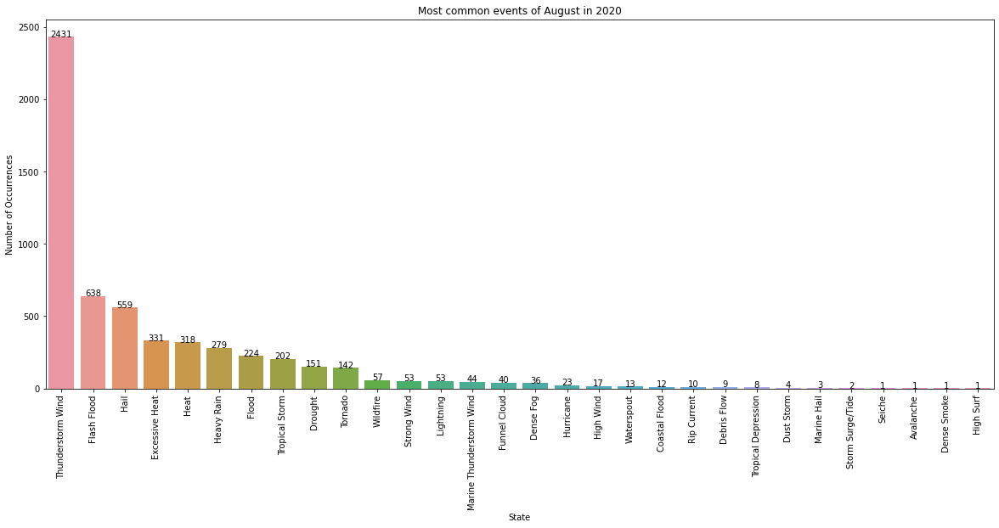

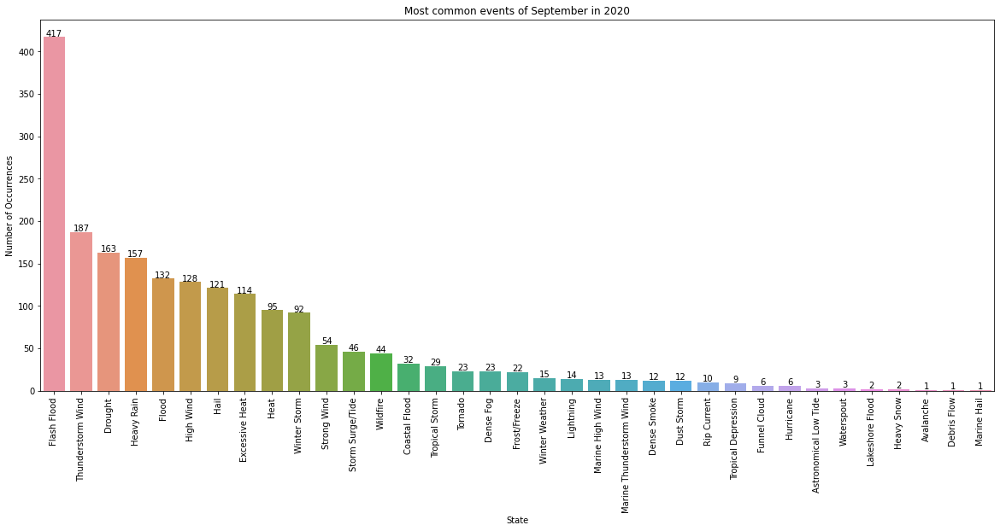

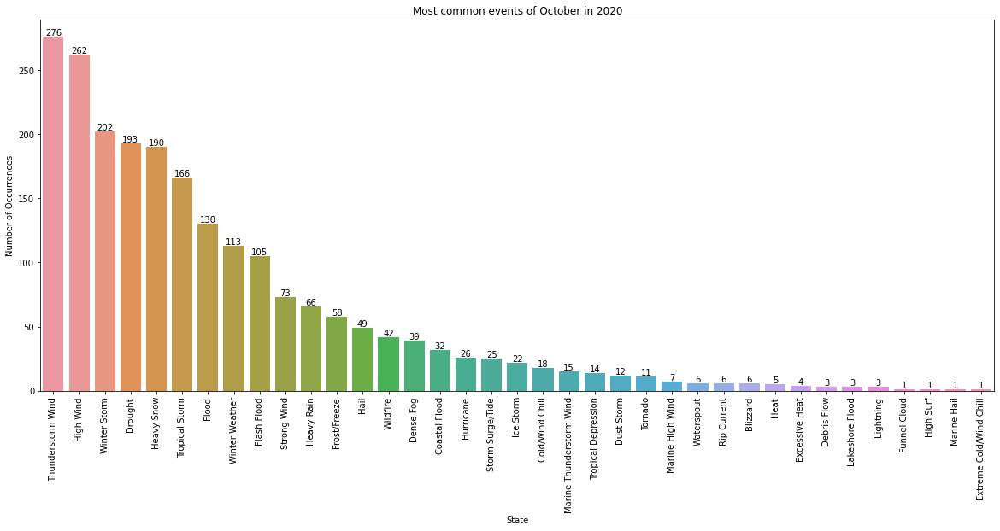

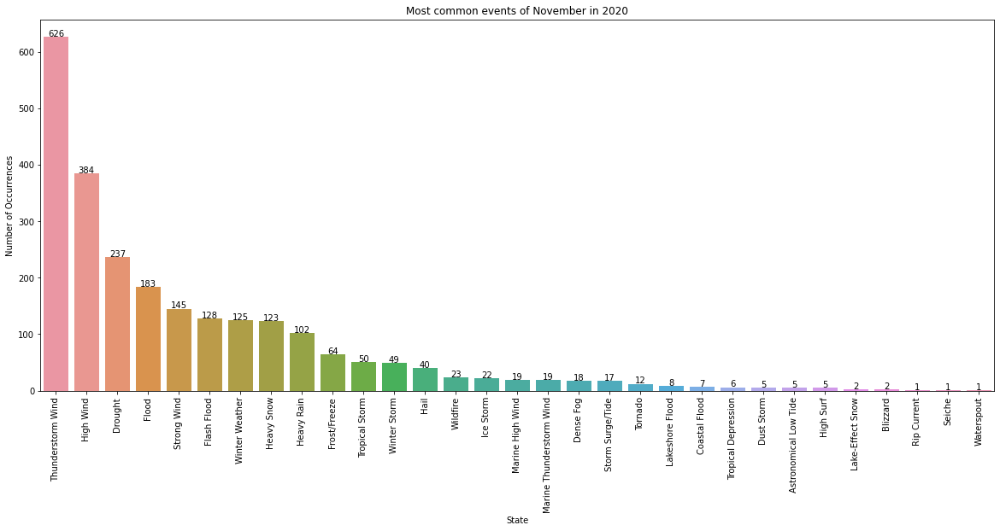

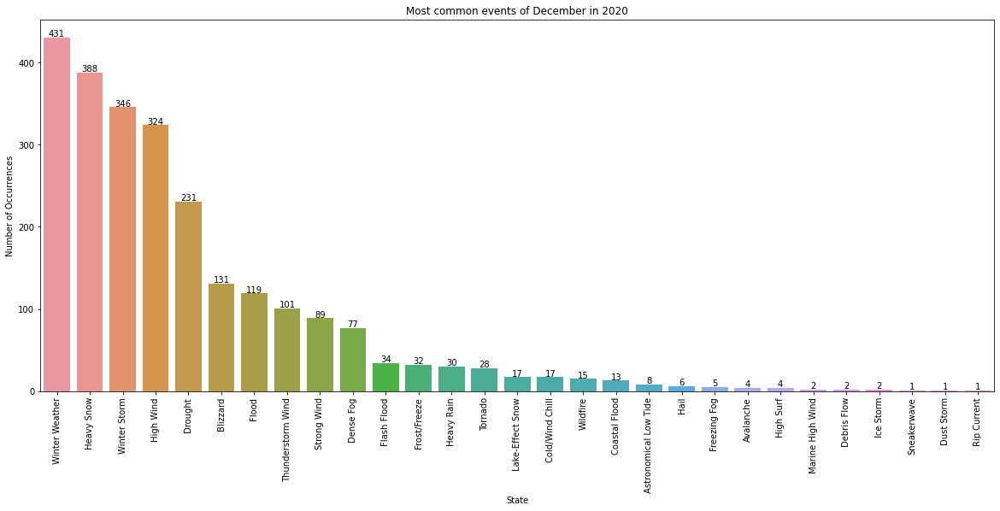

In [110]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2020[df_2020["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in 2020")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below represents Thunderstorm Wind occured 610 times in Jan 2020 and so on. Likewise others

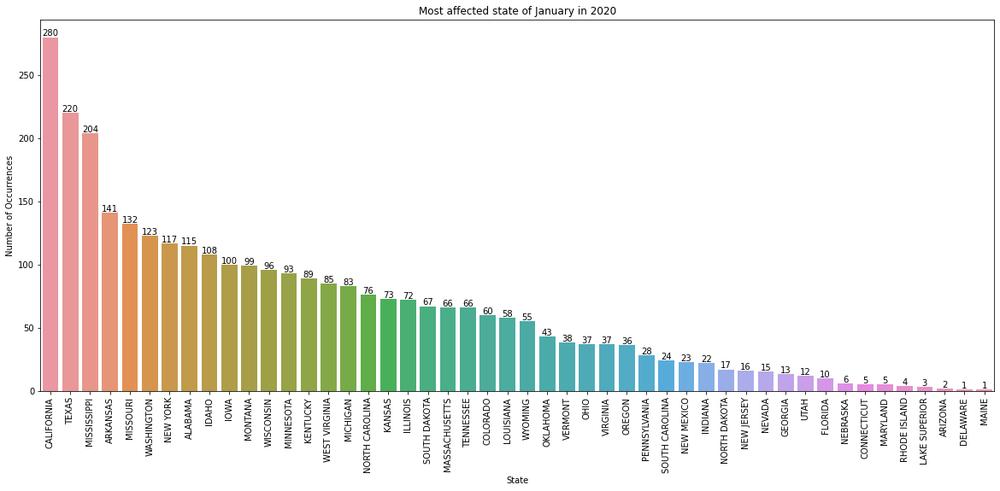

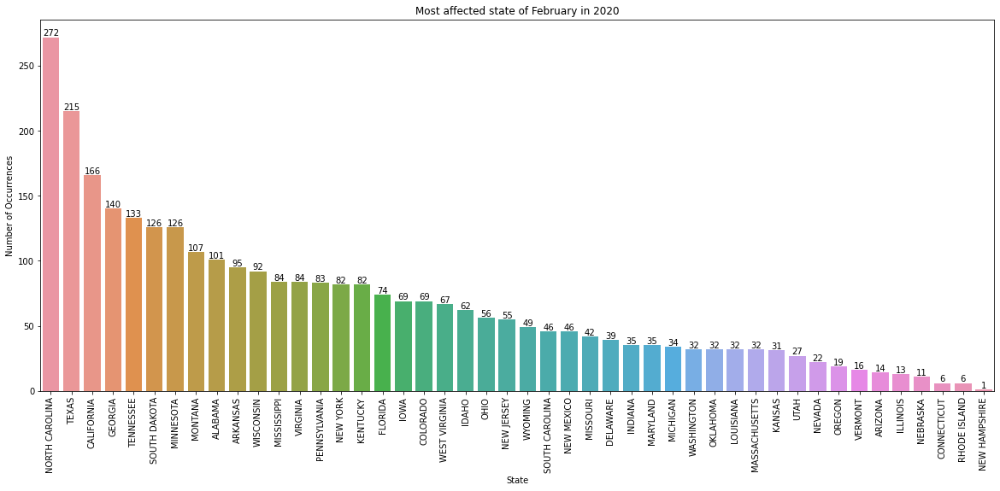

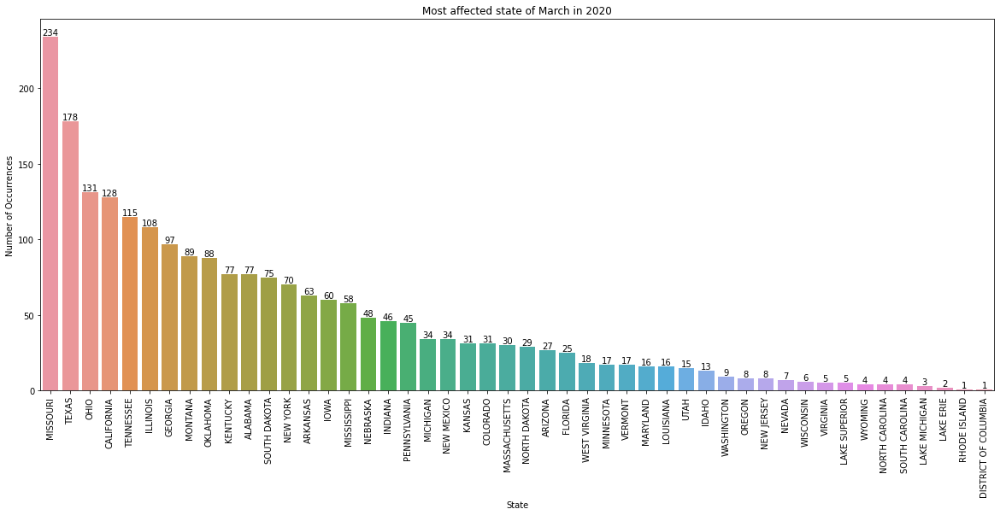

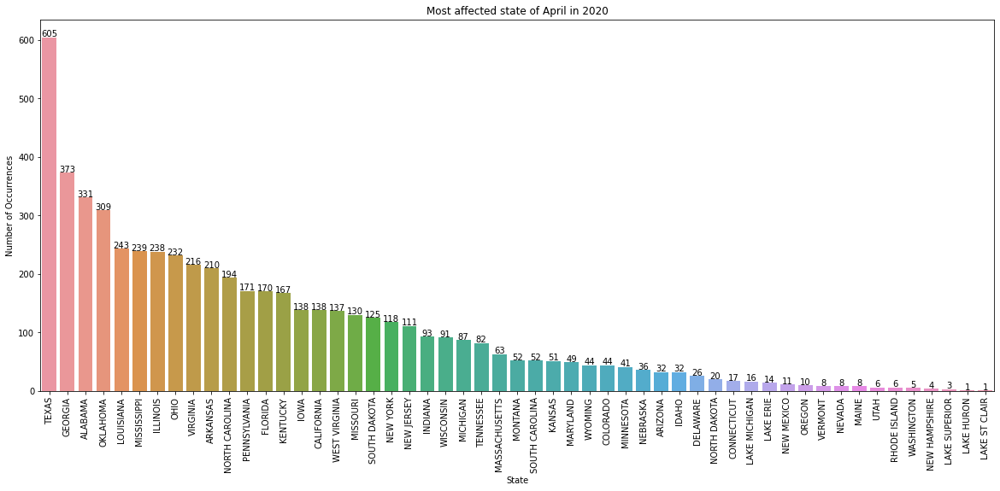

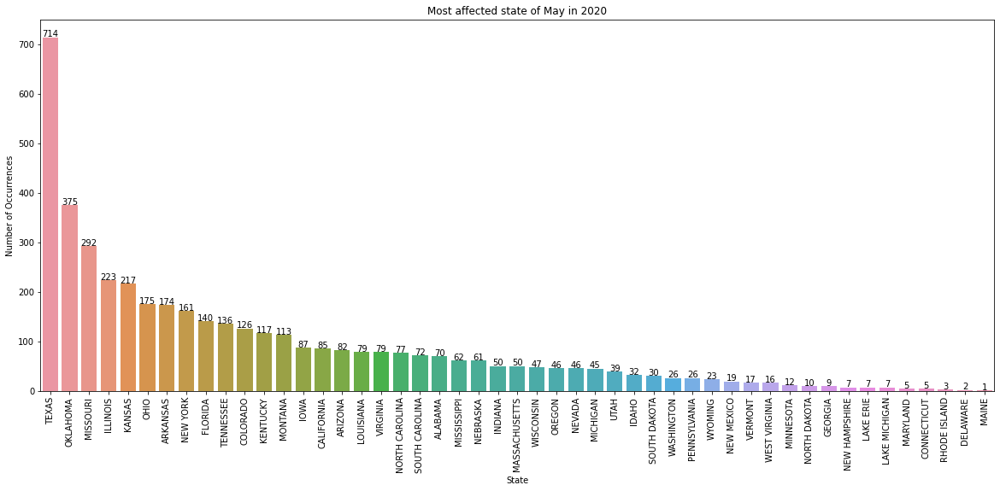

...

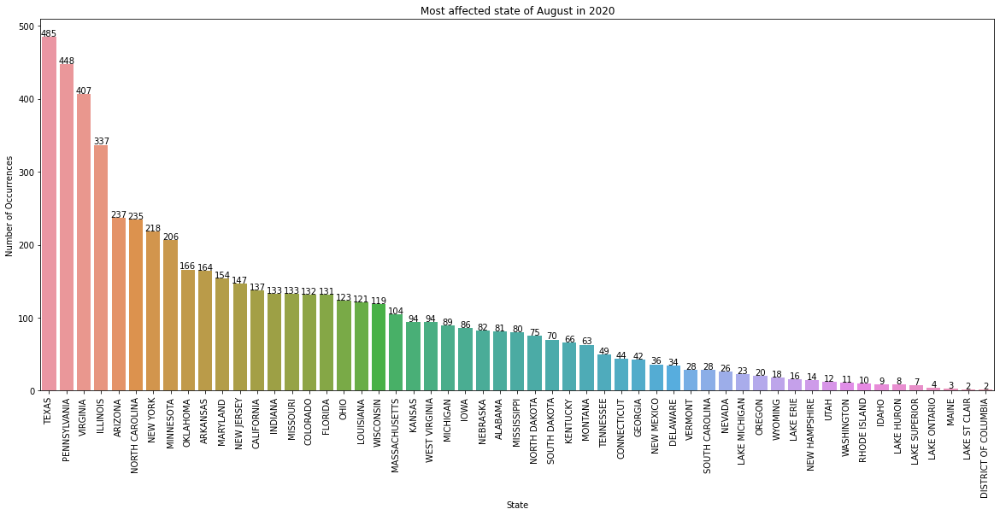

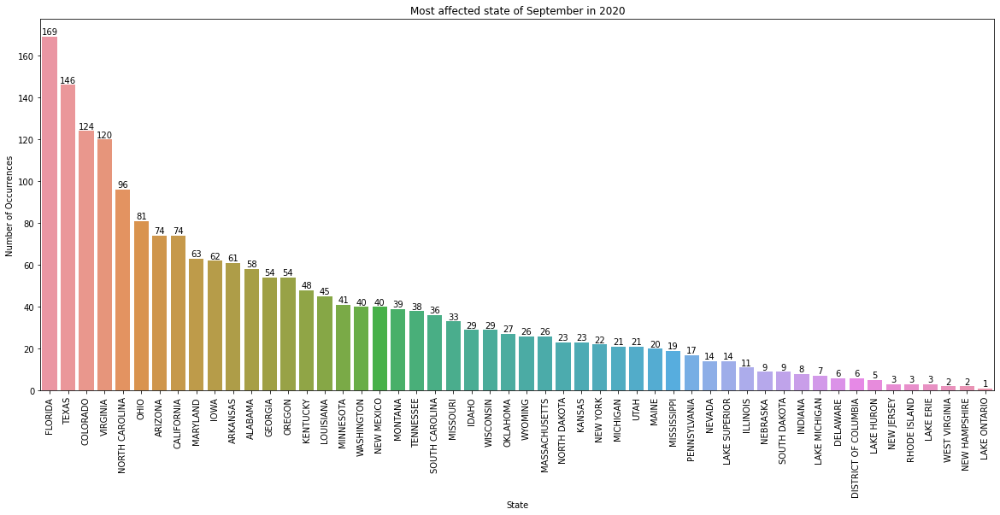

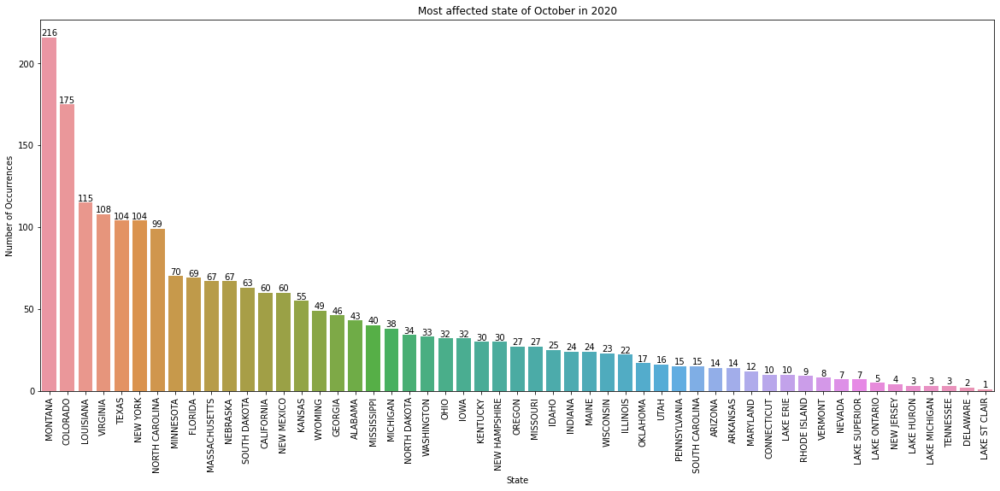

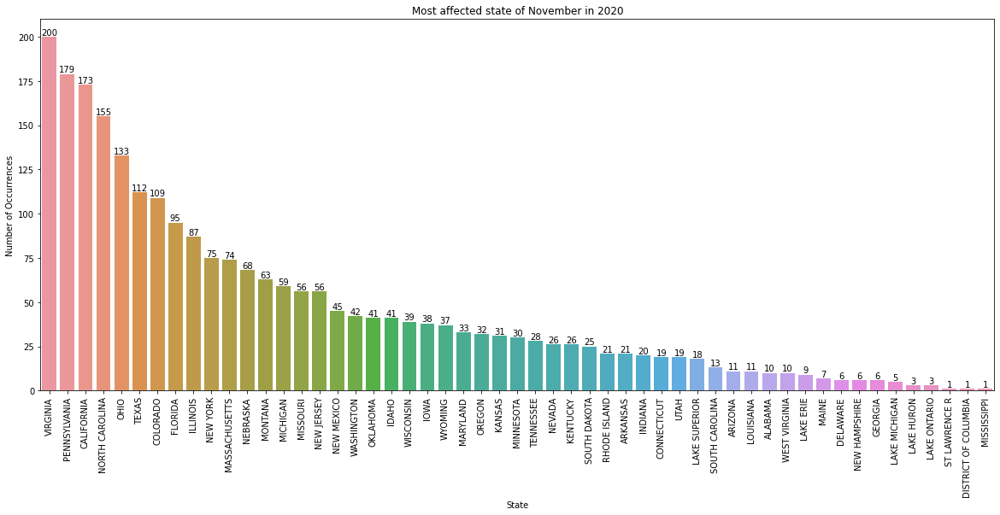

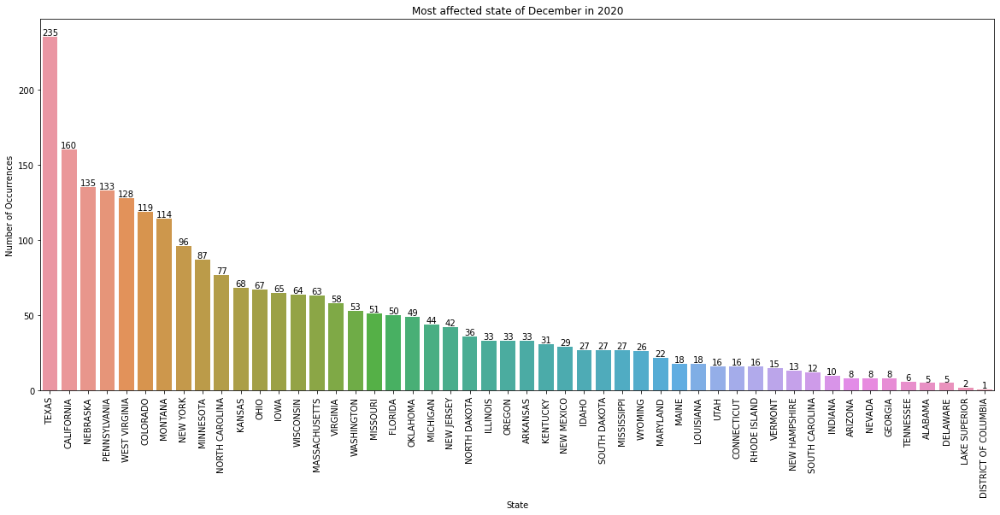

In [111]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2020[df_2020["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state of {month} in 2020")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below shows that California was affected 280 times in Jan 2020 and son on. Like wise others

# 2021

In [112]:
df_2021 = df[df["YEAR"]==2021]

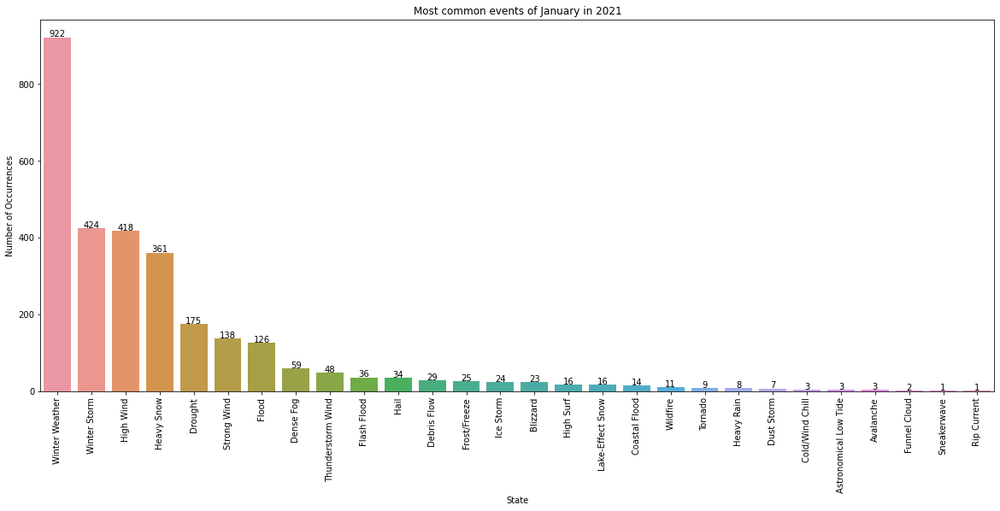

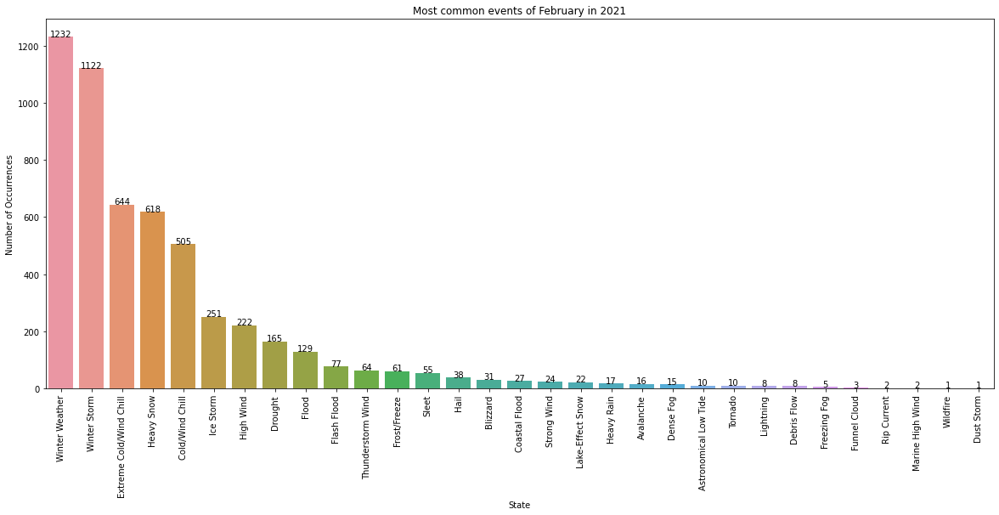

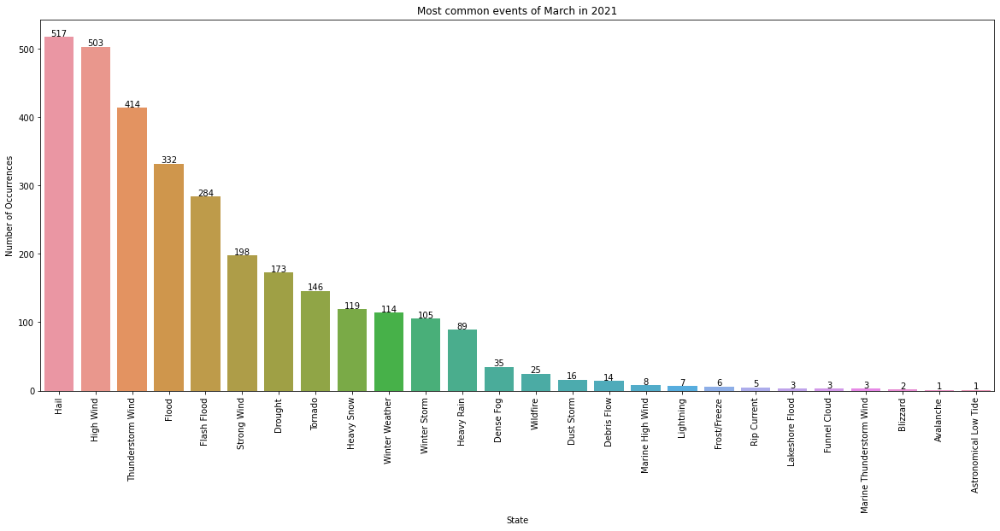

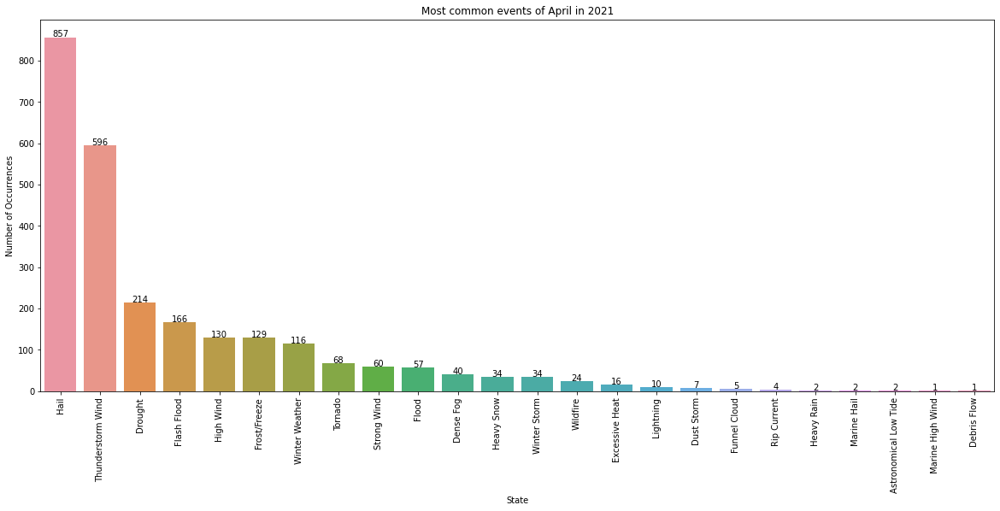

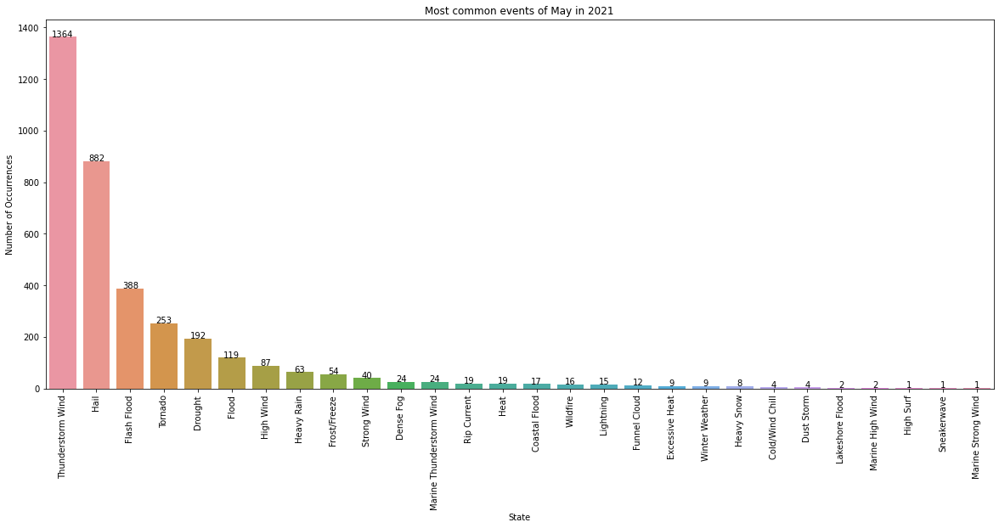

...

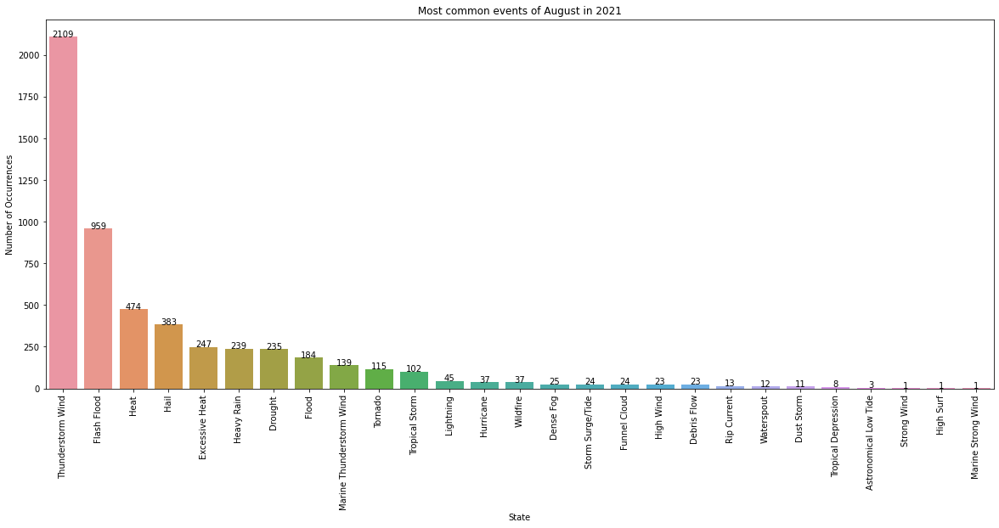

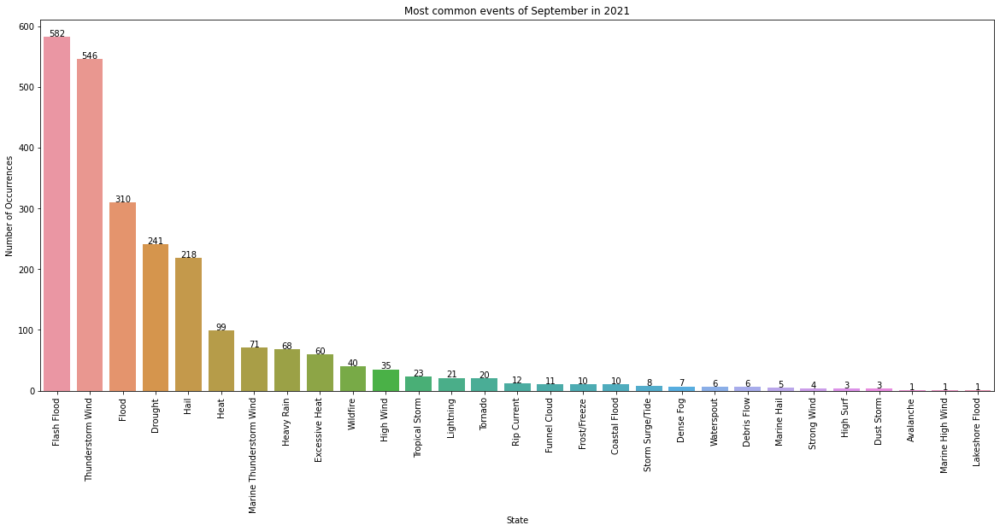

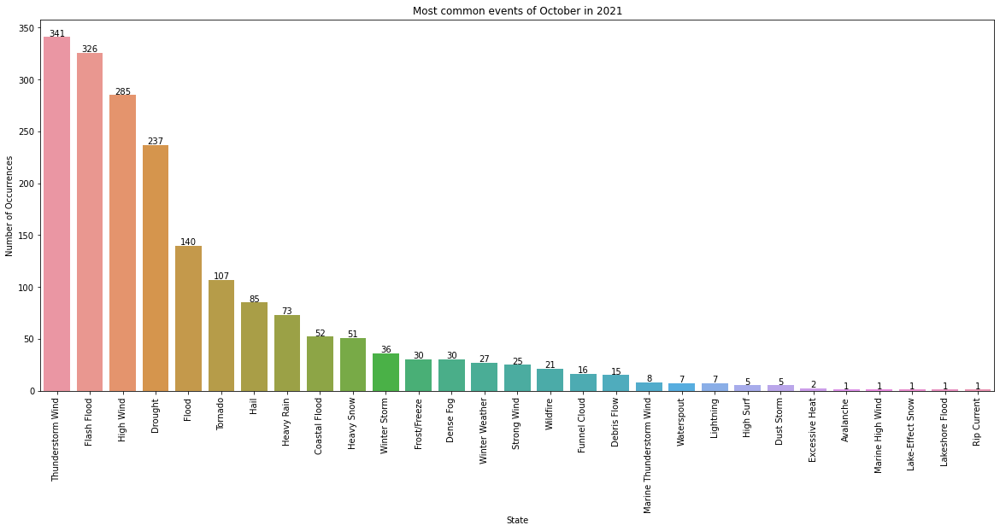

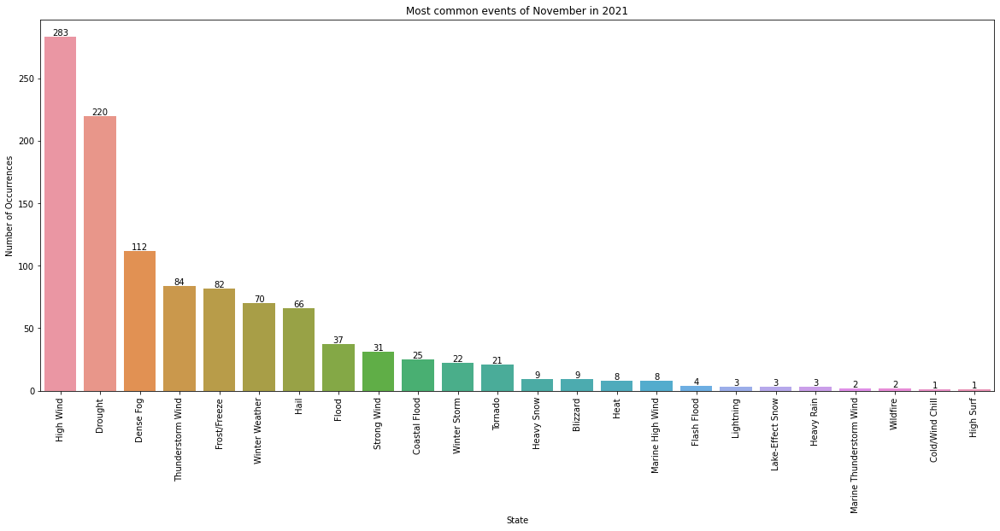

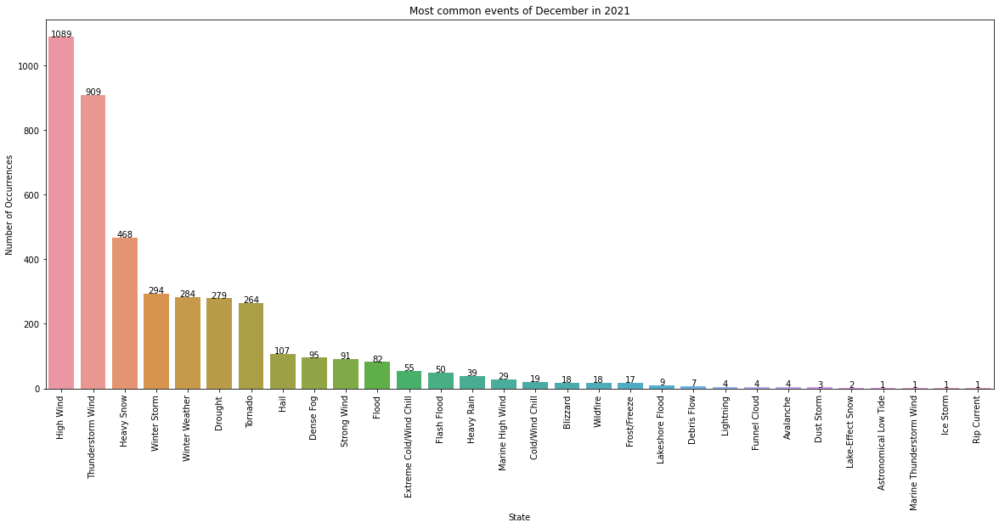

In [113]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2021[df_2021["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="EVENT_TYPE", data=dff, order=dff["EVENT_TYPE"].value_counts().index)
    plt.title(f"Most common events of {month} in 2021")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below represents winter weather occured 922 times in Jan 2021 and so on. Likewise others

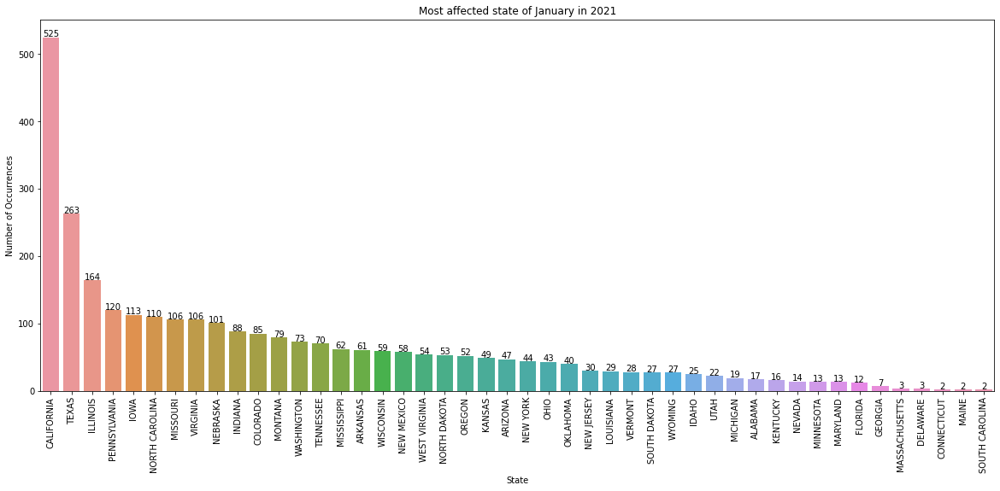

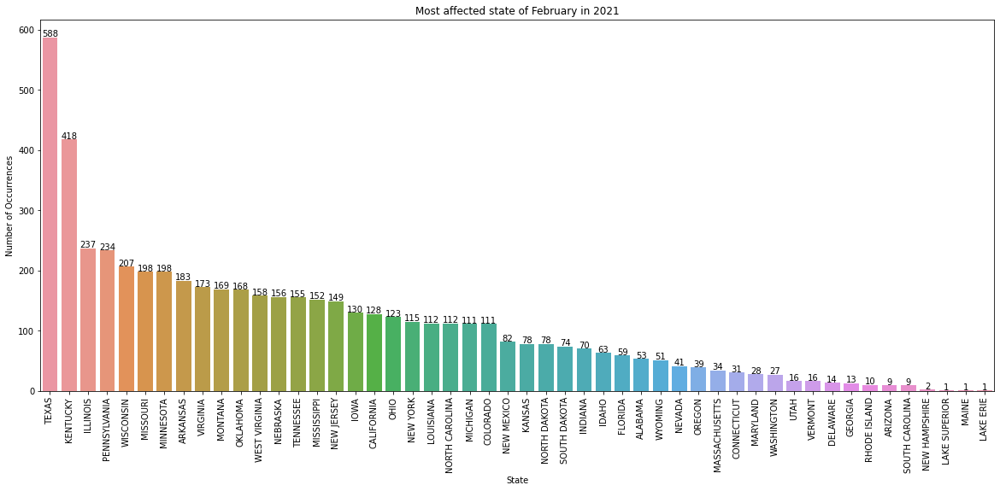

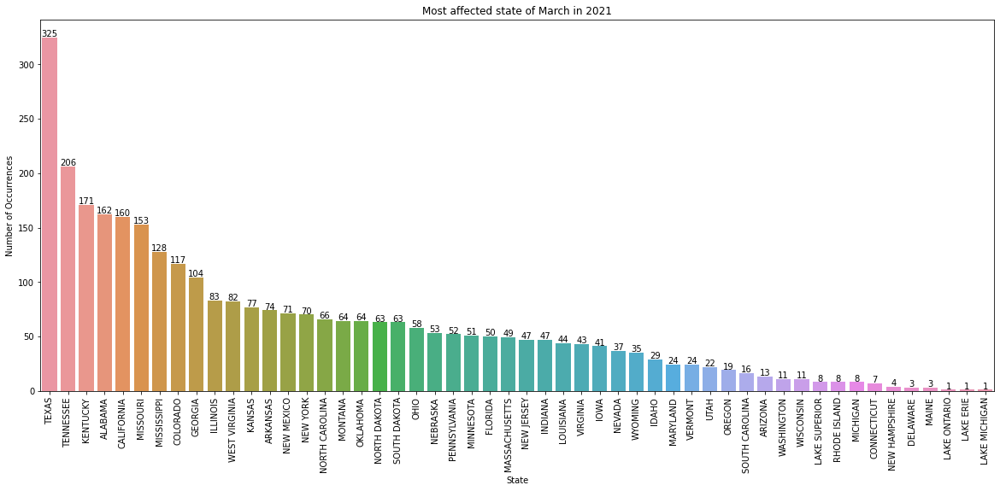

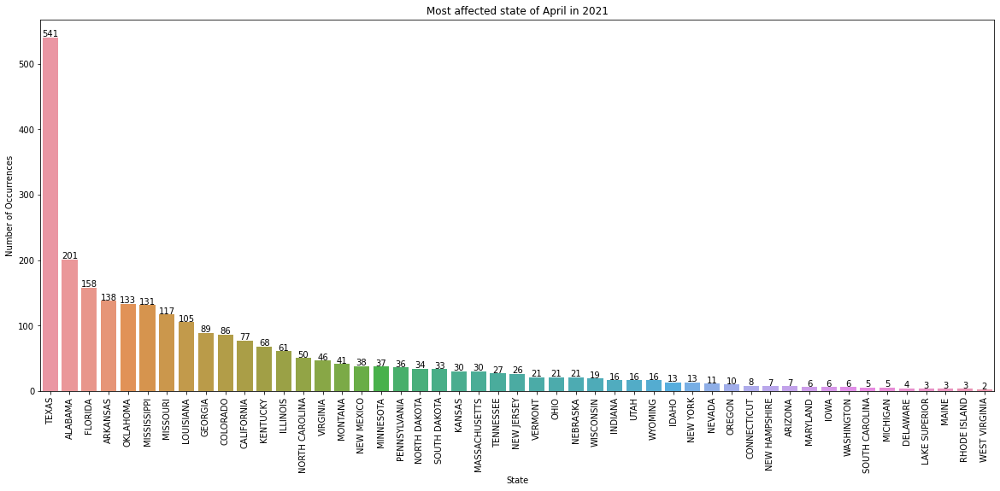

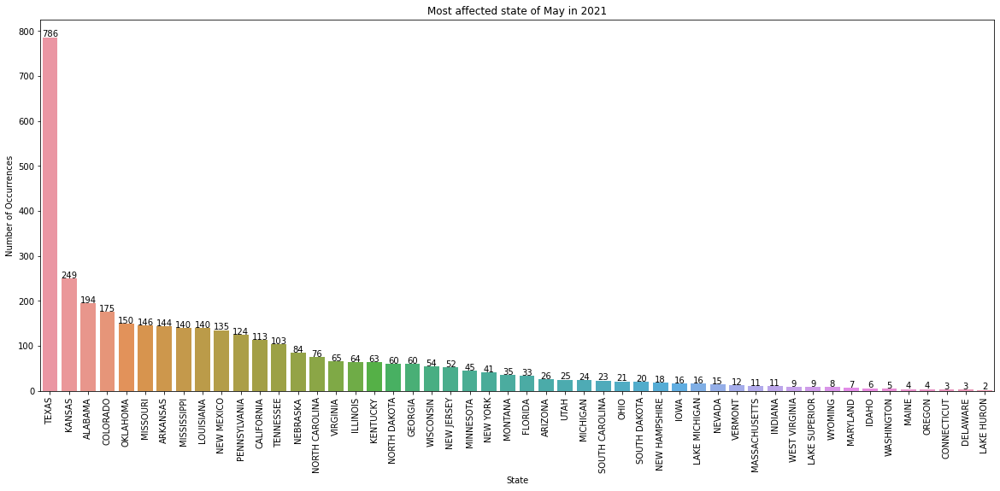

...

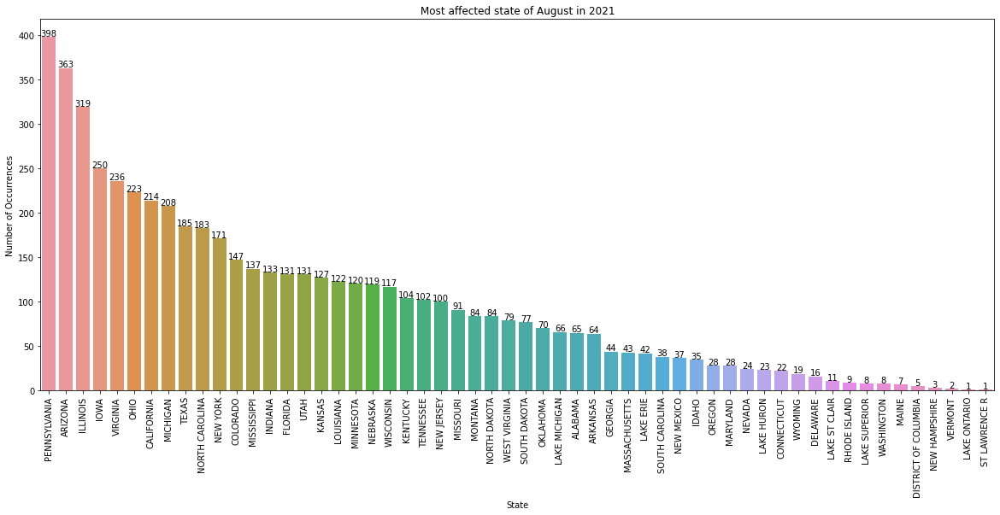

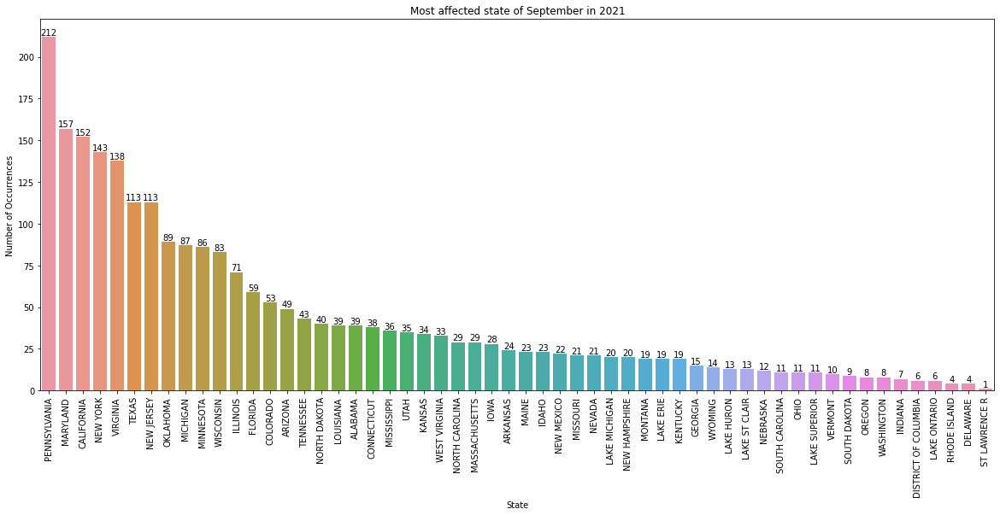

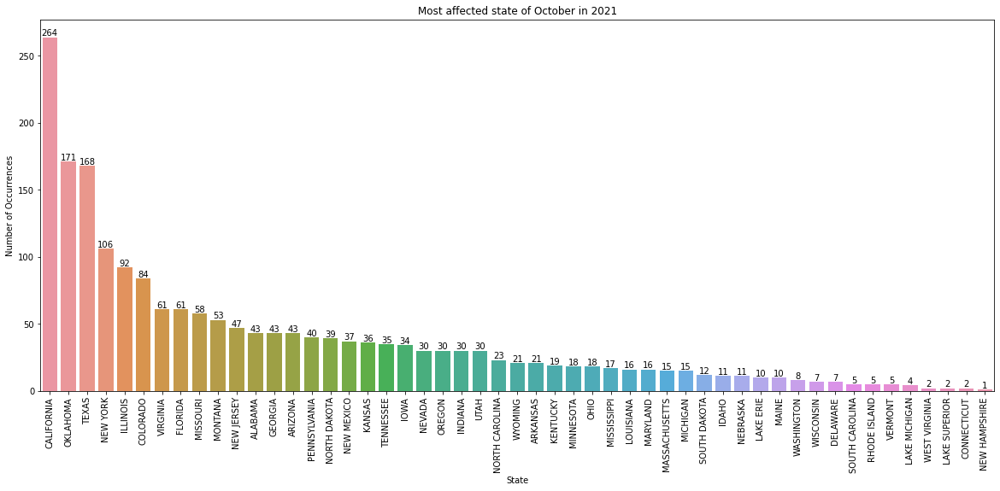

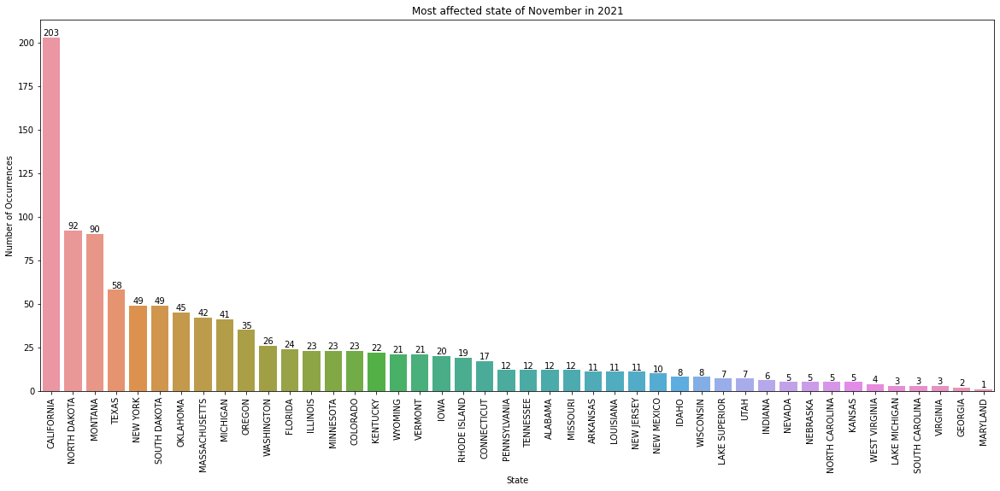

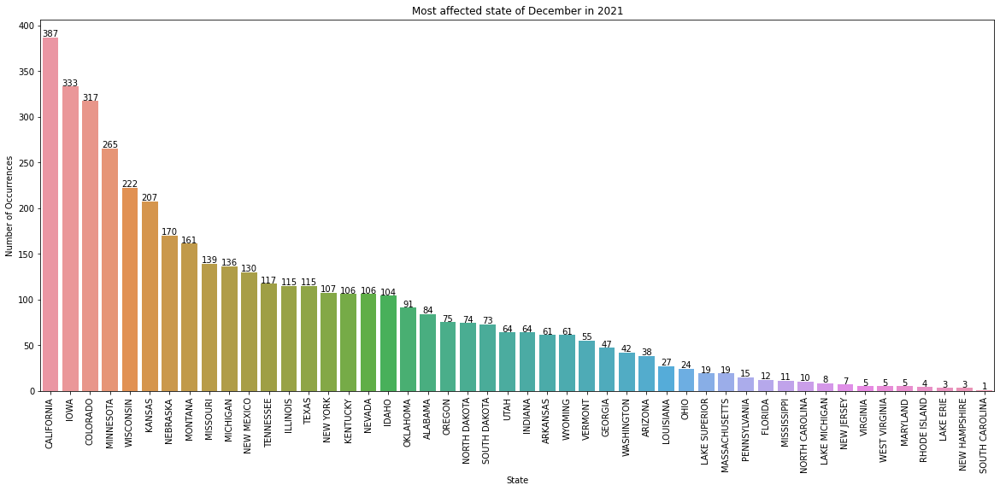

In [114]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
          'November', 'December']

for month in months:
    dff = df_2021[df_2021["MONTH_NAME"] == month]
    plt.figure(figsize=(20,8))
    ax = sns.countplot(x="STATE", data=dff, order=dff["STATE"].value_counts().index)
    plt.title(f"Most affected state of {month} in 2021")
    plt.xlabel("State")
    plt.ylabel("Number of Occurrences")
    plt.xticks(rotation=90)

    # Add count to each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 1, str(p.get_height()), ha="center")
    plt.show()
# The plot below shows that California was affected 525 times in Jan 2021 and son on. Like wise others

# Modelling

In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
# Applying One-hot encoding from pandas to categorical features
state_onehot = pd.get_dummies(df['STATE'], prefix='state')
month_onehot = pd.get_dummies(df['MONTH_NAME'], prefix='month')
df = pd.concat([df, state_onehot, month_onehot], axis=1)

In [ ]:
# Dropping the original features as I aldy converted them above
df.drop(['STATE', 'MONTH_NAME'], axis=1, inplace=True)

In [ ]:
# Label encoding the target variable
label_encoder = LabelEncoder()
df['EVENT_TYPE'] = label_encoder.fit_transform(df['EVENT_TYPE'])

In [ ]:
# Factorize remaining categorical features
for column in df.select_dtypes(include=['object']):
    df[column] = pd.factorize(df[column])[0]

In [ ]:
# Scaling the features because there are many values which is higher than the averages values. Did this so that the larger
# values dont dominate the model
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.drop('EVENT_TYPE', axis=1))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, df['EVENT_TYPE'], test_size=0.2, random_state=42)

# LOGISTIC REGRESSION

In [ ]:
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)
y_pred_lr = logreg.predict(X_test)

print('Logistic Regression Results:')
print('Accuracy:', accuracy_score(y_test, y_pred_lr))

Logistic Regression Results:<br>
Accuracy: 0.48262904608082274

# Random Forest Classifier 

In [ ]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred_rfc = rfc.predict(X_test)

print('Random Forest Classifier Results:')
print('Accuracy:', accuracy_score(y_test, y_pred_rfc))

Random Forest Classifier Results:<br>
Accuracy: 0.7414243962467313

# XGBoost

In [ ]:
xgbc = xgb.XGBClassifier()
xgbc.fit(X_train, y_train)
y_pred_xgb = xgbc.predict(X_test)

print('XGBoost Results:')
print('Accuracy:', accuracy_score(y_test, y_pred_xgb))

XGBoost Results:<br>
Accuracy: 0.7076933219065199